# Imports section

In [1]:
import pandas as pd
import numpy as np
import scipy

# statistics
from scipy import stats

#data visualizations
import matplotlib.pyplot as plt
%matplotlib inline
#%matplotlib widget

#Machine learning library
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from plot import *
from data_proccessing import *
from histogram_matching import *
from utils import *

import warnings
warnings.filterwarnings("ignore")

In [2]:
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.metrics import r2_score, mean_squared_error, \
    mean_absolute_percentage_error,mean_absolute_error, accuracy_score

In [3]:
!mkdir ~/.kaggle

mkdir: cannot create directory ‘/home/tom/.kaggle’: File exists


In [4]:
!cp kaggle.json ~/.kaggle

In [5]:
!chmod 600 ~/.kaggle/kaggle.json

In [6]:
# from google.colab import drive
# drive.mount('/content/drive', force_remount=True)

# Histogarm Matching

## Test the histogram equalization

We wanted to test the histogram matching algorithm on several random distribution.\
The results are shown below where the blue histograms are the original distributions and the orange are the distribution after normalization.\
Above each plot there is the P-value of KS-test of the normalized distribution, to see how well it matches a normal distribution.

In [7]:
rnd = np.random

funcs = [rnd.power, rnd.lognormal, rnd.poisson, rnd.weibull, rnd.uniform, rnd.pareto, rnd.standard_t, rnd.dirichlet]

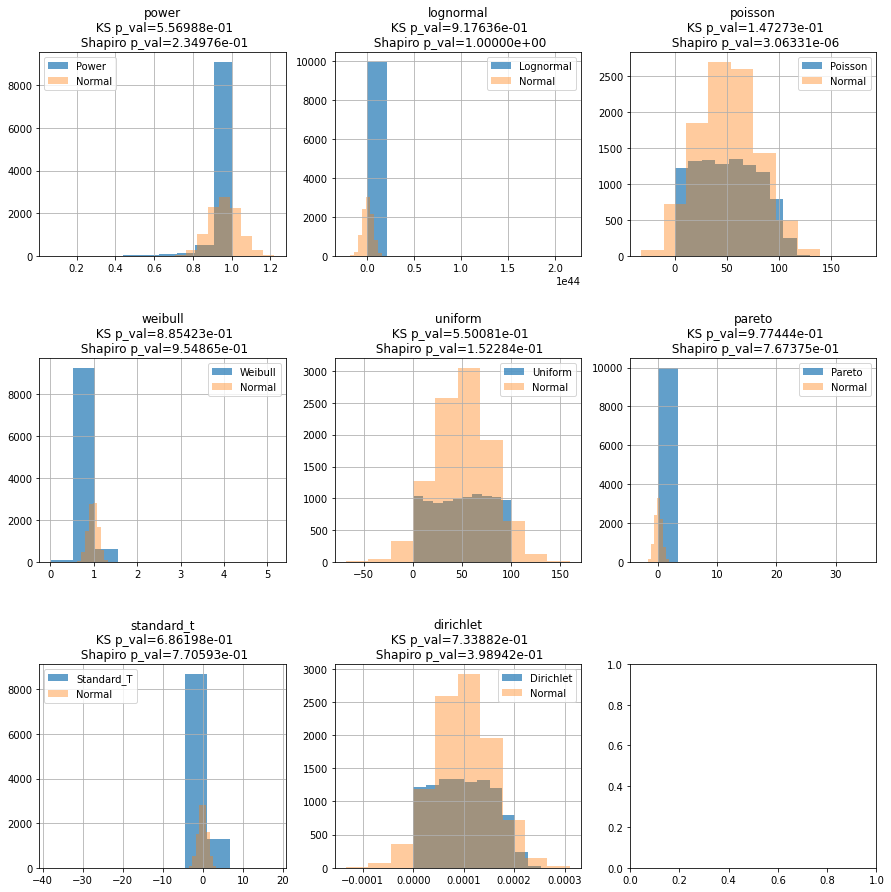

In [8]:
n = len(funcs)
cols = 3
rows=(n//3) + 1 if n%3 !=0 else (n // 3)

#generate a figures grid:
fig, axes = plt.subplots(rows,cols,figsize=(cols*5,rows*5))
fig.subplots_adjust(hspace=0.5)

for i, func in enumerate(funcs):
    # simple example - from uniform to normal
    if func is not np.random.uniform:
        src_dist = func(np.random.uniform(1, 100, 10_000))
    else:
        src_dist = np.random.uniform(1, 100, 10_000)

    m, s = src_dist.mean(), src_dist.std()
    dst_dist = np.random.normal(m, s, 10_000)

    match = histogram_matching(src_dist, dst_dist)

    #calculate the current place on the grid
    r=int(i/cols)
    c=i%cols

    df = pd.DataFrame({f'{func.__name__}':src_dist, 'normal_match':match}, index=[np.zeros(10_000)])


    m,s = stats._continuous_distns.norm.fit(df['normal_match'])
    ks_res, ks_pval = scipy.stats.kstest(df['normal_match'].values,stats._continuous_distns.norm.cdf,args=(m,s))

    shapiro_res, shapiro_pval = stats.shapiro(df['normal_match'].values)
    # build the histograms

    df[f'{func.__name__}'].hist(alpha=0.7, ax=axes[r,c])
    df.normal_match.hist(alpha=0.4, ax=axes[r,c])
    axes[r,c].set_title(f'{func.__name__}\n KS p_val={ks_pval:.5e}\n Shapiro p_val={shapiro_pval:.5e}')
    axes[r,c].legend([f'{func.__name__.title()}', 'Normal'])

One of the most common examples is using the histogram matching algorithm in order to alter an image contrust.\
In this example, we took an image with low contrust and matched it to a unifom distribution in order to have better quality.

### Download example image

In [9]:
!wget http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg -O ./image.jpg

--2022-03-09 14:04:20--  http://3.bp.blogspot.com/-SC-w7eTgpM0/URE9NsI_nuI/AAAAAAAAAGE/YmlWnimNuPM/s320/7957178556_001939ffc5_z.jpg
Resolving 3.bp.blogspot.com (3.bp.blogspot.com)... 142.250.201.33, 2a00:1450:4006:80d::2001
Connecting to 3.bp.blogspot.com (3.bp.blogspot.com)|142.250.201.33|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22102 (22K) [image/jpeg]
Saving to: ‘./image.jpg’

./image.jpg         100%[===================>]  21.58K  --.-KB/s    in 0.06s   

2022-03-09 14:04:21 (379 KB/s) - ‘./image.jpg’ saved [22102/22102]



### Example on images

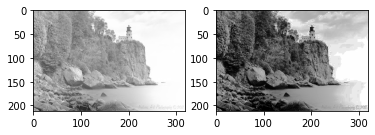

In [10]:
from PIL import Image, ImageOps

# load the image
low_contrast_image = Image.open('./image.jpg')
low_contrast_image = ImageOps.grayscale(low_contrast_image)

low_contrast_image = np.array(low_contrast_image)

dst_dist = np.arange(0, 256)

image = histogram_matching(low_contrast_image, dst_dist)

fig, (ax1, ax2) = plt.subplots(1, 2)
# show low contrast image
ax1.imshow(low_contrast_image, cmap=plt.cm.gray)
# show image after histogram matching to uniform distribution
ax2.imshow(image, cmap=plt.cm.gray)

# Utils

In [11]:
correction_func = lambda x, y: ((x - x.min()) * ((y.max() - y.min()) / (x.max() - x.min()))) + y.min()

# Try on first Dataset (Regression)

https://www.kaggle.com/wkirgsn/electric-motor-temperature

In [12]:
!if [ ! -f datasets/measures_v2.csv ]; then kaggle datasets download --unzip -d wkirgsn/electric-motor-temperature -p datasets/; fi;

100%|████████████████████████████████████████| 117M/117M [00:19<00:00, 6.89MB/s]
100%|████████████████████████████████████████| 117M/117M [00:19<00:00, 6.18MB/s]


In [13]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/measures_v2.csv.zip' -d './measures_v2.csv.zip'

In [14]:
# !unzip -n ./electric-motor-temperature.zip -d .
# !rm -rf ./electric-motor-temperature.zip

In [15]:
# !unzip -n ./measures_v2.csv.zip -d .
# !rm -rf ./measures_v2.csv.zip

In [13]:
measures_df = pd.read_csv('./datasets/measures_v2.csv')

In [14]:
measures_df.describe()

,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
count,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06,1.330816e+06
mean,5.427900e+01,3.622999e+01,6.634275e+01,-2.513381e+01,5.687858e+01,2.202081e+03,-6.871681e+01,3.741278e+01,5.850678e+01,4.818796e+01,2.456526e+01,3.110603e+01,4.079306e+01
std,4.417323e+01,2.178615e+01,2.867206e+01,6.309197e+01,2.295223e+01,1.859663e+03,6.493323e+01,9.218188e+01,1.900150e+01,1.999100e+01,1.929522e+00,7.713575e+01,2.504549e+01
min,-2.529093e+01,1.062375e+01,1.858582e+01,-1.315304e+02,1.813398e+01,-2.755491e+02,-2.780036e+02,-2.934268e+02,2.085696e+01,1.807669e+01,8.783478e+00,-2.464667e+02,2.000000e+00
25%,1.206992e+01,1.869814e+01,4.278796e+01,-7.869090e+01,3.841601e+01,3.171107e+02,-1.154061e+02,1.095863e+00,4.315158e+01,3.199033e+01,2.318480e+01,-1.374265e-01,1.700000e+01
50%,4.893818e+01,2.690014e+01,6.511013e+01,-7.429755e+00,5.603635e+01,1.999977e+03,-5.109376e+01,1.577401e+01,6.026629e+01,4.562551e+01,2.479733e+01,1.086035e+01,4.300000e+01
75%,9.003439e+01,4.985749e+01,8.814114e+01,1.470271e+00,7.558668e+01,3.760639e+03,-2.979688e+00,1.006121e+02,7.200837e+01,6.146083e+01,2.621702e+01,9.159718e+01,6.500000e+01
max,1.330370e+02,1.015985e+02,1.413629e+02,1.314698e+02,1.119464e+02,6.000015e+03,5.189670e-02,3.017079e+02,1.136066e+02,1.011480e+02,3.071420e+01,2.610057e+02,8.100000e+01


In [15]:
print(measures_df.shape)
measures_df.head()

(1330816, 13)


,u_q,coolant,stator_winding,u_d,stator_tooth,motor_speed,i_d,i_q,pm,stator_yoke,ambient,torque,profile_id
0,-0.450682,18.805172,19.086670,-0.350055,18.293219,0.002866,0.004419,0.000328,24.554214,18.316547,19.850691,0.187101,17
1,-0.325737,18.818571,19.092390,-0.305803,18.294807,0.000257,0.000606,-0.000785,24.538078,18.314955,19.850672,0.245417,17
2,-0.440864,18.828770,19.089380,-0.372503,18.294094,0.002355,0.001290,0.000386,24.544693,18.326307,19.850657,0.176615,17
3,-0.327026,18.835567,19.083031,-0.316199,18.292542,0.006105,0.000026,0.002046,24.554018,18.330833,19.850647,0.238303,17
4,-0.471150,18.857033,19.082525,-0.332272,18.291428,0.003133,-0.064317,0.037184,24.565397,18.326662,19.850639,0.208197,17


In [16]:
measures_test_df = measures_df.loc[measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)
measures_train_df = measures_df.loc[~measures_df['profile_id'].isin([65, 72])].drop('profile_id', axis=1)

In [17]:
print(measures_train_df.shape)
print(measures_test_df.shape)

(1275421, 12)
(55395, 12)


In [18]:
measures_train_df_X, measures_train_df_y = measures_train_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_train_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [19]:
print(measures_train_df_X.shape)
print(measures_train_df_y.shape)

(1275421, 8)
(1275421, 4)


In [20]:
measures_test_df_X, measures_test_df_y = measures_test_df[['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']], measures_test_df[['stator_yoke', 'stator_winding', 'stator_tooth', 'pm']]

In [21]:
print(measures_test_df_X.shape)
print(measures_test_df_y.shape)

(55395, 8)
(55395, 4)


### Visualize histograms of features

In [22]:
measures_numeric_columns = measures_train_df_X.dtypes[(measures_train_df_X.dtypes=="float64") | (measures_train_df_X.dtypes=="int64")].index.tolist()

In [23]:
measures_numeric_columns, measures_categorical_columns = get_numeric_categorical_columns(measures_train_df_X, ['profile_id'])

column: u_q, %: 95.3708618565948
column: coolant, %: 83.23957344280831
column: u_d, %: 97.25282867382613
column: motor_speed, %: 56.62208792234094
column: i_d, %: 77.78576642536072
column: i_q, %: 76.01795799191012
column: ambient, %: 89.74550364154268
column: torque, %: 87.38659626899667
numeric_columns = ['u_q', 'coolant', 'u_d', 'motor_speed', 'i_d', 'i_q', 'ambient', 'torque']
categorical_columns = []


In [24]:
len(measures_train_df_X)

1275421

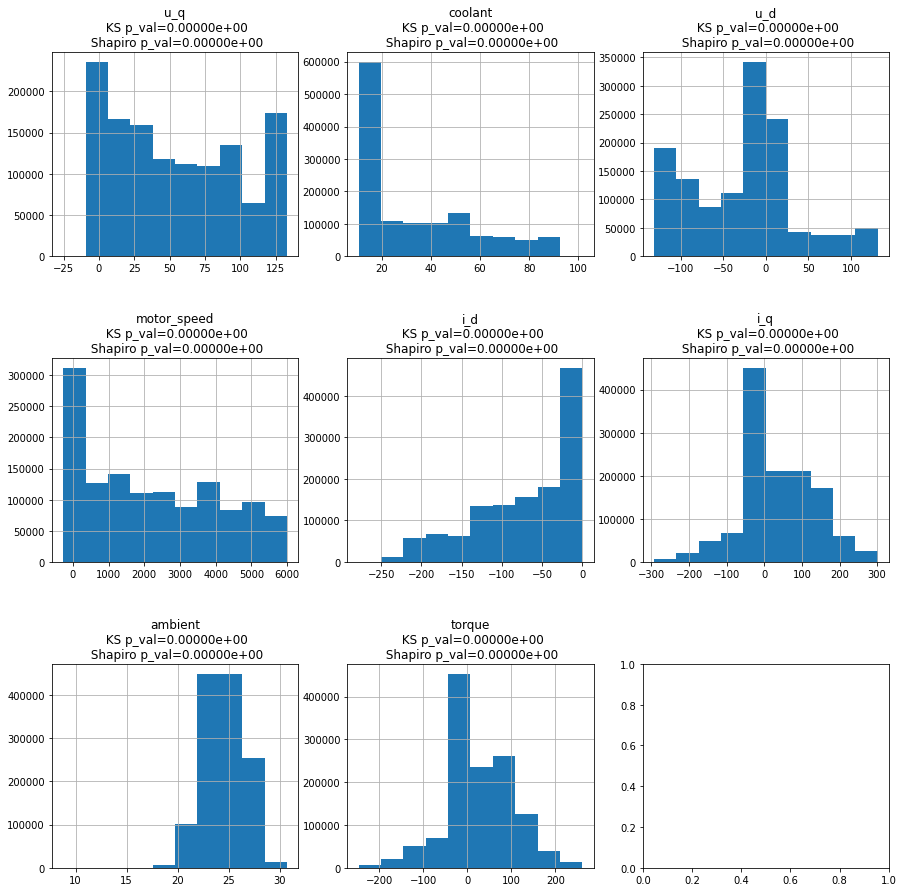

In [25]:
plot_numerical_histograms(measures_train_df_X, measures_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: u_q
Correction: coolant
Correction: u_d
Correction: motor_speed
Correction: i_d
Correction: i_q
Correction: ambient
Correction: torque


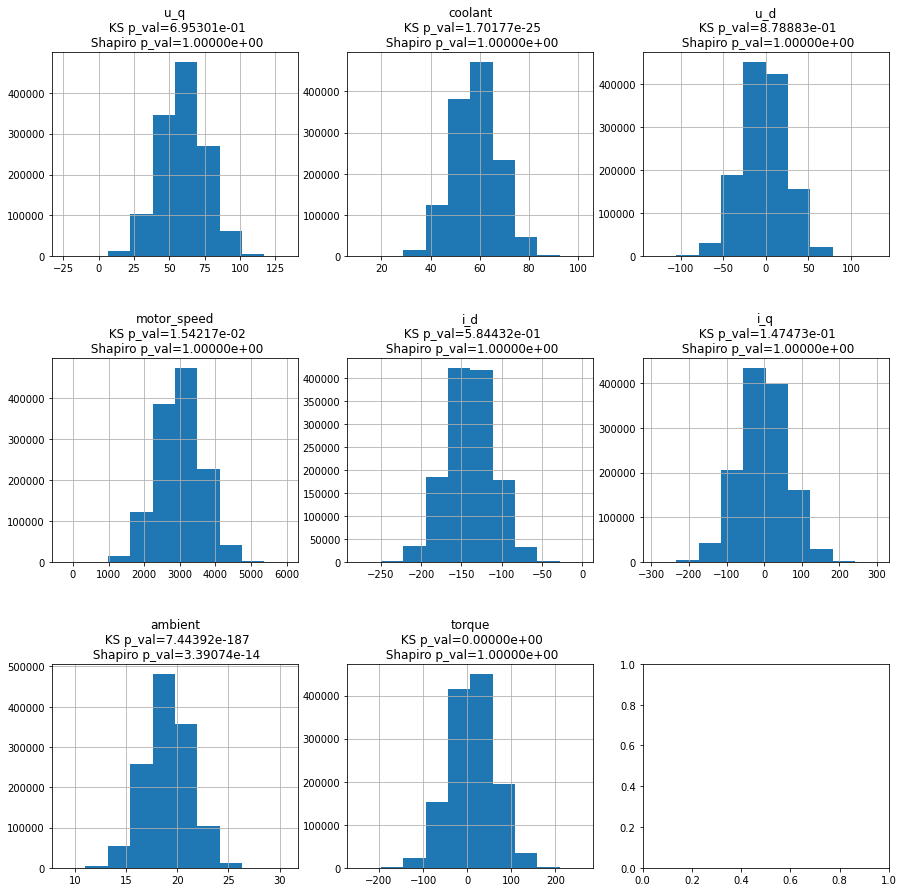

In [26]:
matched_measures_train_df_X, train_df_X_normal_mapping = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution,
                                                                           correction=correction_func
                                                                           )

matched_measures_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(measures_train_df_X,\
                                                                           match_to_normal_distribution
                                                                           )

plot_numerical_histograms(matched_measures_train_df_X, measures_numeric_columns)

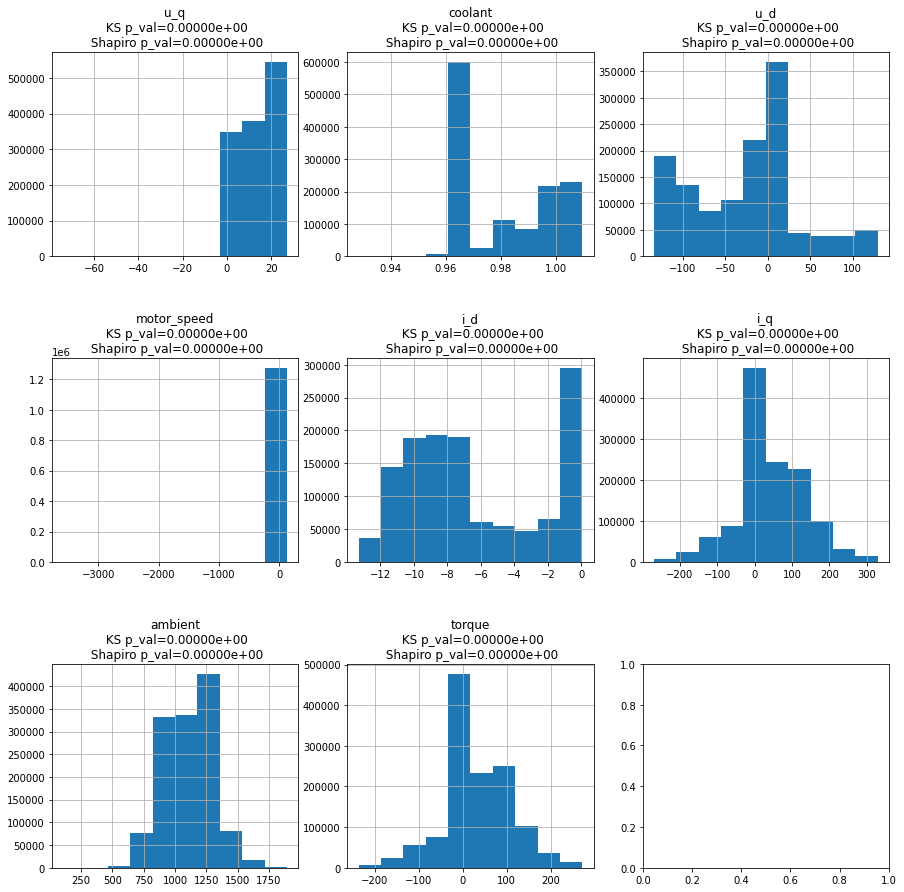

In [27]:
yeo_measures_train_df_X, train_df_X_yeo_mapping = transform_dataset(measures_train_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_measures_train_df_X, measures_numeric_columns)

#### Match test set X

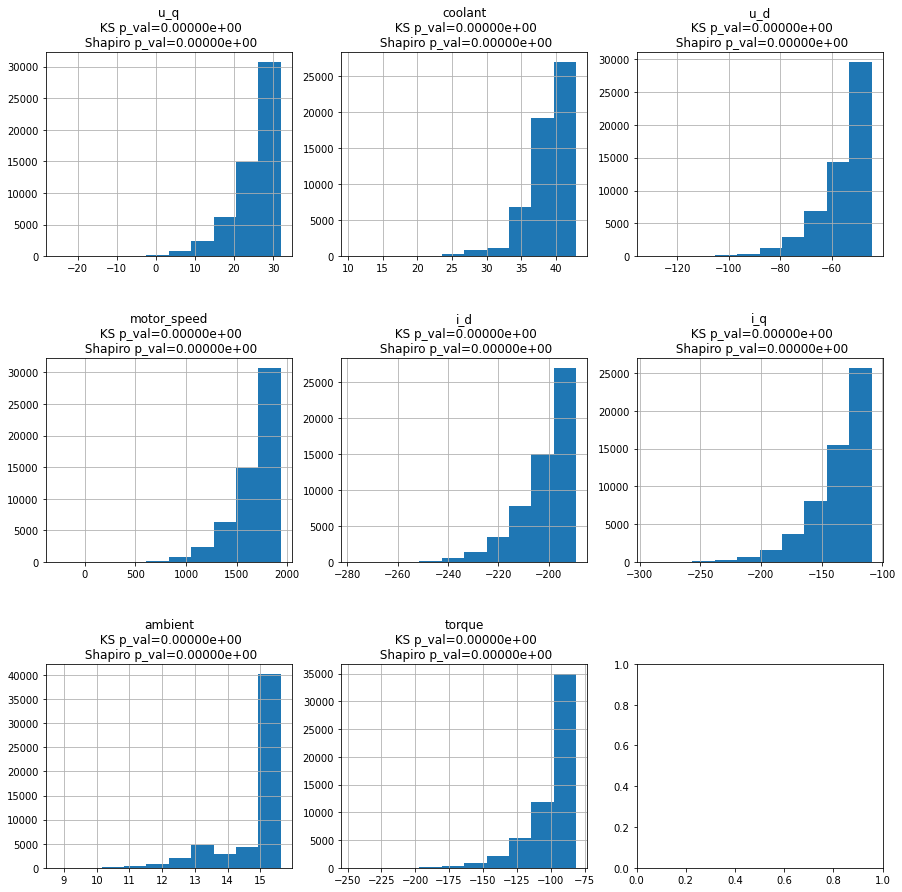

In [28]:
matched_measures_test_df_X, _ = transform_dataset(measures_test_df_X,\
                                                  match_to_normal_distribution,\
                                                  mapping=train_df_X_normal_mapping)
plot_numerical_histograms(matched_measures_test_df_X, measures_numeric_columns)

In [29]:
yeo_measures_test_df_X, _ = transform_dataset(measures_test_df_X, stats.yeojohnson, mapping=train_df_X_yeo_mapping)

## QQ plots of features

### QQ plots for regular features

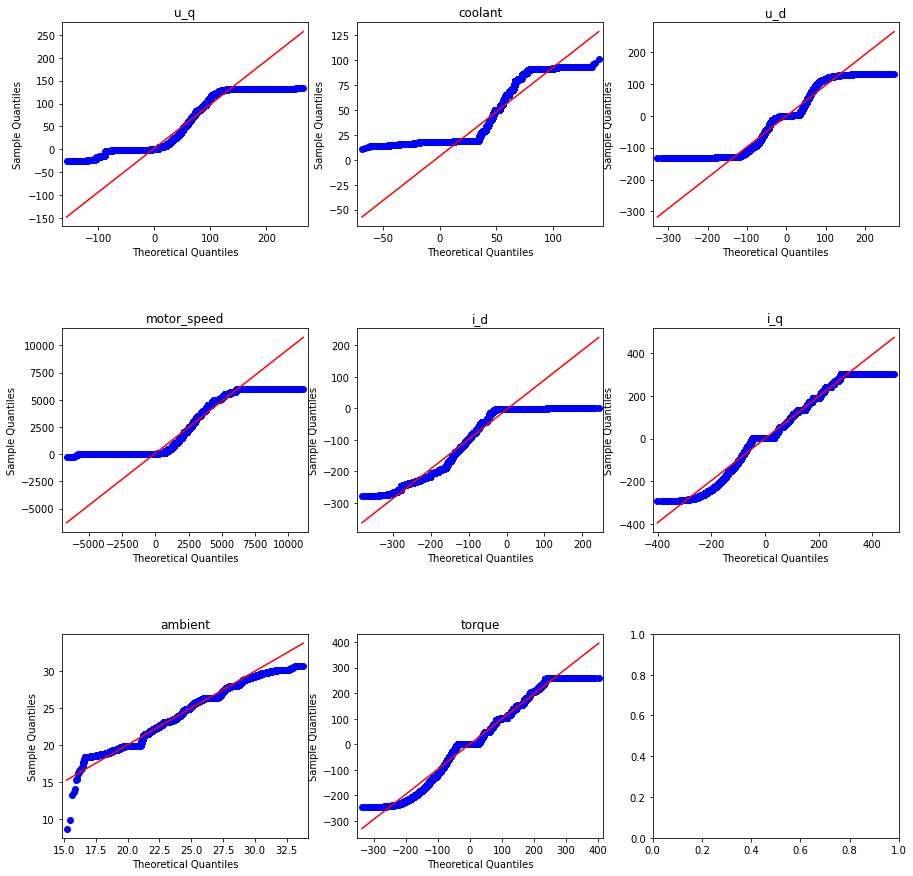

In [30]:
qq_plot_data(measures_train_df_X, measures_numeric_columns)

### QQ plots for Matched features

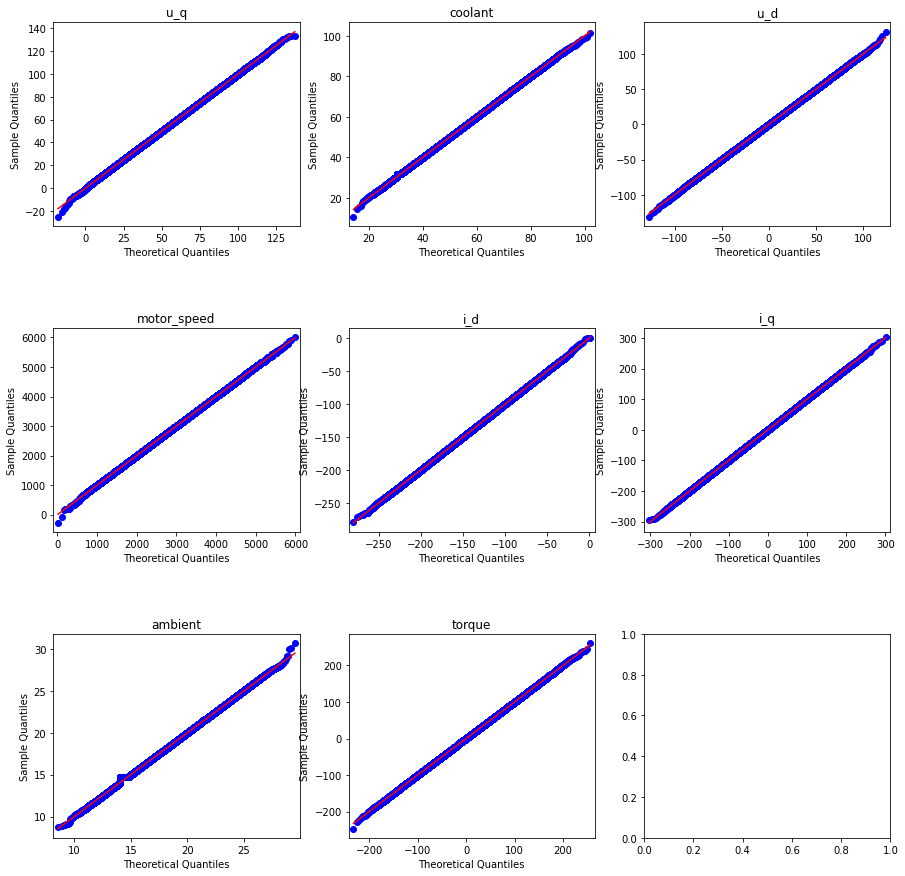

In [31]:
qq_plot_data(matched_measures_train_df_X, measures_numeric_columns)

### QQ plots for Yeo-Johnson features

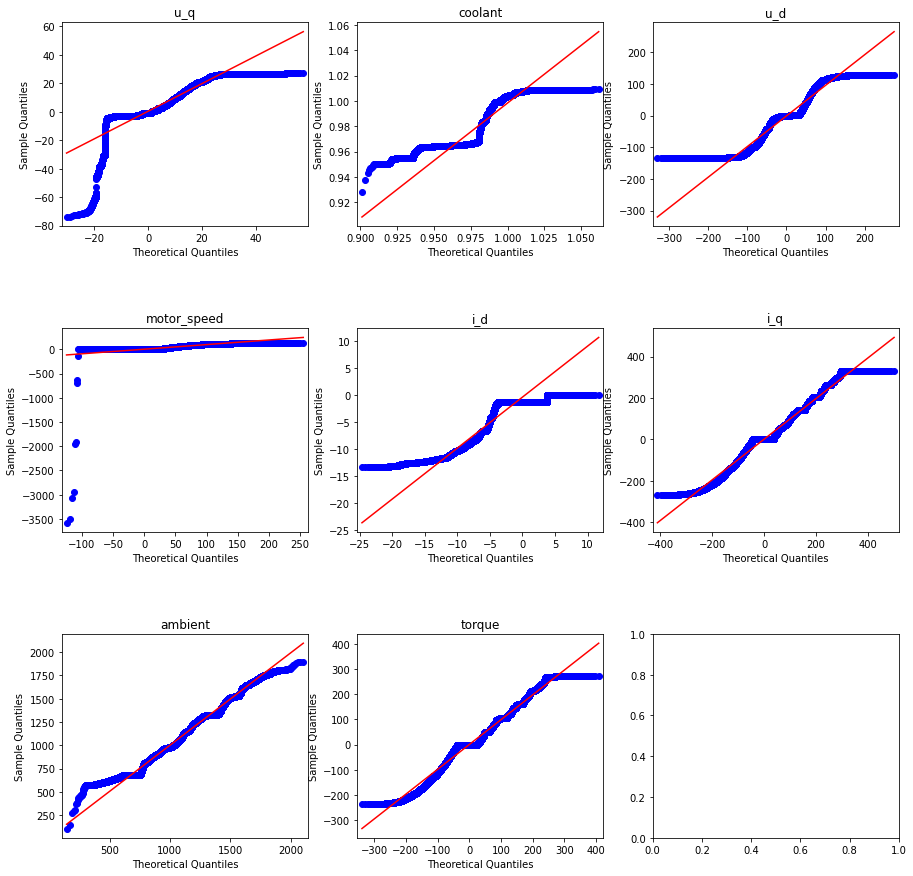

In [32]:
qq_plot_data(yeo_measures_train_df_X, measures_numeric_columns)

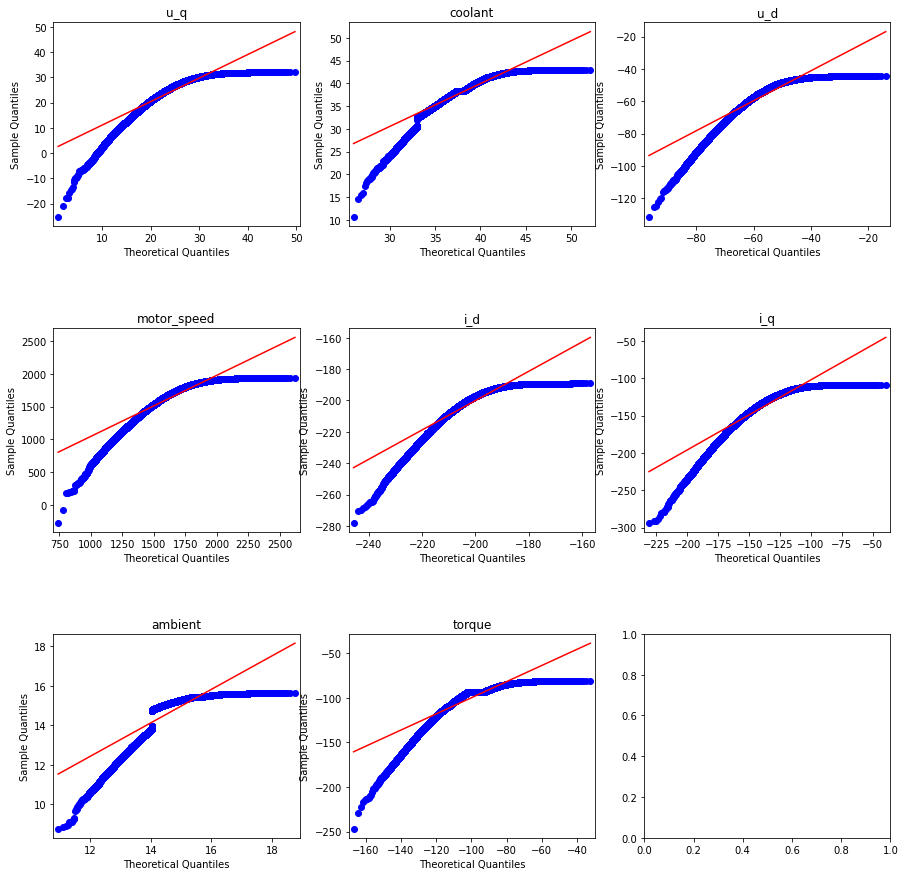

In [33]:
qq_plot_data(matched_measures_test_df_X, measures_numeric_columns)

## Compare model preformance

### Test on regular data

In [34]:
for column in measures_test_df_y:
    model = LinearRegression()
    prediction = model.fit(measures_train_df_X,measures_train_df_y[column]).predict(measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.8157037365081542
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8
column=stator_winding, r2=0.5806161453601706
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.215
Mean Absolute Error (Σ|y - pred|/n): 13
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 17
column=stator_tooth, r2=0.6648058996604785
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.178
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12
column=pm, r2=0.28225137362710206
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.170
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


### Test on matched data

In [35]:
for column in measures_test_df_y:
    matched_model = LinearRegression()
    matched_prediction = matched_model.fit(matched_measures_train_df_X,measures_train_df_y[column]).predict(matched_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=stator_yoke, r2=-3.4292980798608577
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.627
Mean Absolute Error (Σ|y - pred|/n): 36
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 39
column=stator_winding, r2=0.16938937122952868
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.284
Mean Absolute Error (Σ|y - pred|/n): 20
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 24
column=stator_tooth, r2=-0.7200793420078173
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.304
Mean Absolute Error (Σ|y - pred|/n): 22
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 28
column=pm, r2=0.20960467636530067
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.186
Mean Absolute Error (Σ|y - pred|/n): 11
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 13


### Test on Yeo-Johnson data

In [36]:
for column in measures_test_df_y:
    yeo_model = LinearRegression()
    yeo_prediction = yeo_model.fit(yeo_measures_train_df_X,measures_train_df_y[column]).predict(yeo_measures_test_df_X)
    print(f'column={column}, r2={r2_score(measures_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(measures_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(measures_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(measures_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=stator_yoke, r2=0.627605624306735
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.201
Mean Absolute Error (Σ|y - pred|/n): 10
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 11
column=stator_winding, r2=0.5092807190190152
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.254
Mean Absolute Error (Σ|y - pred|/n): 15
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 18
column=stator_tooth, r2=0.5503797540828994
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 12
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 14
column=pm, r2=0.32294051349261976
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.167
Mean Absolute Error (Σ|y - pred|/n): 9
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 12


## Try to normalize only 1 column at a time and Compare to regular model

In [37]:
for column in measures_test_df_y:   
    compare_one_norm_column(measures_train_df_X, measures_test_df_X, measures_train_df_y[column], \
                            measures_test_df_y[column], matched_measures_train_df_X, \
                            matched_measures_test_df_X, yeo_measures_train_df_X, yeo_measures_test_df_X,\
                            column, measures_numeric_columns)

=== Measure for regular model: ===
column=stator_yoke, r2=0.8157037365081542
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.126
Mean Absolute Error (Σ|y - pred|/n): 6
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 8

=== Compare for column u_q ===
column=u_q, matched r2=0.8134179576919345
column=u_q, yeo r2=0.8156448287162383

=== Compare for column coolant ===
column=coolant, matched r2=-3.6696064410620712
column=coolant, yeo r2=0.6018165773800633

=== Compare for column u_d ===
column=u_d, matched r2=0.7436420865394571
column=u_d, yeo r2=0.8157464061540273

=== Compare for column motor_speed ===
column=motor_speed, matched r2=0.8193260186159388
column=motor_speed, yeo r2=0.8154367659234809

=== Compare for column i_d ===
column=i_d, matched r2=0.3076793854455647
column=i_d, yeo r2=0.8219467140679424

=== Compare for column i_q ===
column=i_q, matched r2=0.825960966060883
column=i_q, yeo r2=0.8169902947397292

=== Compare for column ambient ===
column=ambient, matched r2=0.76566909

## Get insights about the data

In [38]:
measures_insights = get_insights(measures_train_df_X[measures_numeric_columns])
measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,54.672782,49.121655,44.017220,1.937516e+03,0.309313,-1.239211,13.983263
coolant,10.623751,101.598512,35.739074,24.507384,21.773772,4.740972e+02,1.088849,-0.021891,13.674798
u_d,-131.530411,131.469788,-26.654494,-7.612911,62.633535,3.922960e+03,0.151665,-0.283908,14.018684
motor_speed,-275.549144,6000.015137,2213.149549,1999.977173,1853.909143,3.436979e+06,0.387876,-1.137312,12.037969
i_d,-278.003632,0.051897,-69.151568,-52.044140,65.000795,4.225103e+03,-0.708554,-0.558587,13.373278
i_q,-293.426793,301.707855,39.616075,21.105413,91.906337,8.446775e+03,-0.156577,0.685779,13.150222
ambient,8.783478,30.714205,24.506731,24.755806,1.938694,3.758534e+00,-0.306136,-0.162134,13.714909
torque,-246.466663,261.005707,32.968623,16.273051,76.860488,5.907535e+03,-0.135584,0.681981,13.175017


In [39]:
matched_measures_insights = get_insights(matched_measures_train_df_X[measures_numeric_columns])
matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-25.290930,133.036994,59.565413,59.546620,16.145361,260.672697,-0.000072,-0.005019,13.983263
coolant,10.623751,101.598512,58.201213,58.200373,9.126132,83.286286,0.003361,-0.011376,13.674798
u_d,-131.530411,131.469788,-1.793806,-1.810392,26.112496,681.862463,0.002030,0.000660,14.018684
motor_speed,-275.549144,6000.015137,2998.682079,2999.044444,621.433747,386179.901700,-0.001166,0.003588,12.037969
i_d,-278.003632,0.051897,-139.341133,-139.344457,29.260756,856.191835,0.001016,0.002306,13.373278
i_q,-293.426793,301.707855,-1.719570,-1.714734,62.950631,3962.781984,-0.002607,-0.002872,13.150222
ambient,8.783478,30.714205,19.042280,19.038347,2.182522,4.763403,0.020461,-0.016461,13.714909
torque,-246.466663,261.005707,11.879503,11.783985,50.862283,2586.971873,-0.003260,0.009134,13.175017


In [40]:
matched_not_measures_insights = get_insights(matched_measures_train_df_X_not[measures_numeric_columns])
matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-152.326340,267.674472,54.635002,54.622308,44.009992,1.936879e+03,-0.001269,-0.003122,13.983263
coolant,-73.622700,145.880124,35.739135,35.725169,21.786534,4.746530e+02,-0.000342,-0.005200,13.674798
u_d,-331.050003,274.246459,-26.656146,-26.624341,62.621016,3.921392e+03,-0.002598,0.003092,14.018684
motor_speed,-6353.864416,11770.414003,2213.866676,2213.198916,1855.210472,3.441806e+06,0.003013,0.001110,12.037969
i_d,-388.177453,245.926870,-69.120042,-69.155147,65.022462,4.227921e+03,0.000391,-0.002377,13.373278
i_q,-384.617920,500.787711,39.782875,39.738213,91.988967,8.461970e+03,-0.000151,0.005174,13.150222
ambient,15.416660,33.773809,24.513299,24.507957,1.930435,3.726579e+00,0.021948,-0.011660,13.714909
torque,-352.319789,400.736219,33.225753,33.075788,76.843831,5.904974e+03,-0.004013,0.004219,13.175017


In [41]:
yeo_measures_insights = get_insights(yeo_measures_train_df_X[measures_numeric_columns])
yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,-73.898395,27.052663,13.700577,14.659158,9.156519,83.841833,-0.371198,0.048266,13.983263
coolant,0.928289,1.009609,0.981466,0.977824,0.016752,0.000281,0.296149,-1.596986,13.667816
u_d,-133.565361,129.468607,-27.331076,-7.655808,62.979182,3966.377425,0.113435,-0.333258,14.018684
motor_speed,-3578.756002,123.829657,65.353999,73.138826,39.515984,1561.512985,-2.466310,175.475974,12.037969
i_d,-13.306719,0.052873,-6.477371,-7.142497,3.788179,14.350299,0.218281,-1.394630,13.373278
i_q,-268.876813,329.524340,44.884537,22.006636,94.726074,8973.029056,0.091339,0.445453,13.150222
ambient,106.880880,1894.280258,1124.088623,1139.542298,204.013217,41621.392704,-0.021229,-0.301041,13.714909
torque,-236.648719,271.990202,34.973780,16.571677,77.878065,6064.993065,-0.018096,0.564177,12.323850


In [42]:
measures_insights - matched_not_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,127.035410,-134.637478,0.037780,-5.500653,0.007228,0.636295,0.310582,-1.236089,0.0
coolant,84.246452,-44.281612,-0.000061,-11.217785,-0.012761,-0.555884,1.089190,-0.016690,0.0
u_d,199.519592,-142.776672,0.001652,19.011430,0.012519,1.568055,0.154263,-0.287000,0.0
motor_speed,6078.315272,-5770.398866,-0.717126,-213.221743,-1.301329,-4826.784610,0.384863,-1.138421,0.0
i_d,110.173822,-245.874973,-0.031526,17.111007,-0.021667,-2.817260,-0.708946,-0.556210,0.0
i_q,91.191127,-199.079855,-0.166800,-18.632801,-0.082630,-15.195360,-0.156426,0.680605,0.0
ambient,-6.633182,-3.059604,-0.006568,0.247849,0.008259,0.031955,-0.328084,-0.150474,0.0
torque,105.853126,-139.730512,-0.257130,-16.802737,0.016657,2.560211,-0.131571,0.677761,0.0


In [43]:
measures_insights - matched_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,0.0,0.000000e+00,-4.892631,-10.424966,27.871859,1.676843e+03,0.309385,-1.234192,0.0
coolant,0.0,-1.421085e-14,-22.462139,-33.692989,12.647640,3.908109e+02,1.085488,-0.010515,0.0
u_d,0.0,-2.842171e-14,-24.860688,-5.802519,36.521039,3.241097e+03,0.149636,-0.284569,0.0
motor_speed,0.0,0.000000e+00,-785.532529,-999.067272,1232.475396,3.050799e+06,0.389042,-1.140900,0.0
i_d,0.0,6.938894e-18,70.189565,87.300317,35.740039,3.368912e+03,-0.709570,-0.560893,0.0
i_q,0.0,5.684342e-14,41.335645,22.820147,28.955705,4.483993e+03,-0.153970,0.688651,0.0
ambient,0.0,-3.552714e-15,5.464451,5.717459,-0.243828,-1.004869e+00,-0.326597,-0.145673,0.0
torque,0.0,5.684342e-14,21.089121,4.489066,25.998204,3.320563e+03,-0.132323,0.672846,0.0


In [44]:
measures_insights - yeo_measures_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
u_q,48.607465,105.984330,40.972205,34.462496,34.860701,1.853674e+03,0.680512,-1.287477,0.000000
coolant,9.695462,100.588903,34.757608,23.529560,21.757020,4.740969e+02,0.792700,1.575095,0.006982
u_d,2.034951,2.001181,0.676582,0.042897,-0.345647,-4.341770e+01,0.038231,0.049349,0.000000
motor_speed,3303.206858,5876.185480,2147.795551,1926.838347,1814.393159,3.435418e+06,2.854186,-176.613285,0.000000
i_d,-264.696912,-0.000977,-62.674197,-44.901643,61.212616,4.210753e+03,-0.926836,0.836043,0.000000
i_q,-24.549980,-27.816485,-5.268463,-0.901223,-2.819737,-5.262543e+02,-0.247916,0.240326,0.000000
ambient,-98.097402,-1863.566053,-1099.581892,-1114.786492,-202.074523,-4.161763e+04,-0.284907,0.138907,0.000000
torque,-9.817944,-10.984495,-2.005157,-0.298626,-1.017578,-1.574585e+02,-0.117487,0.117803,0.851167


## Plot distirbutions

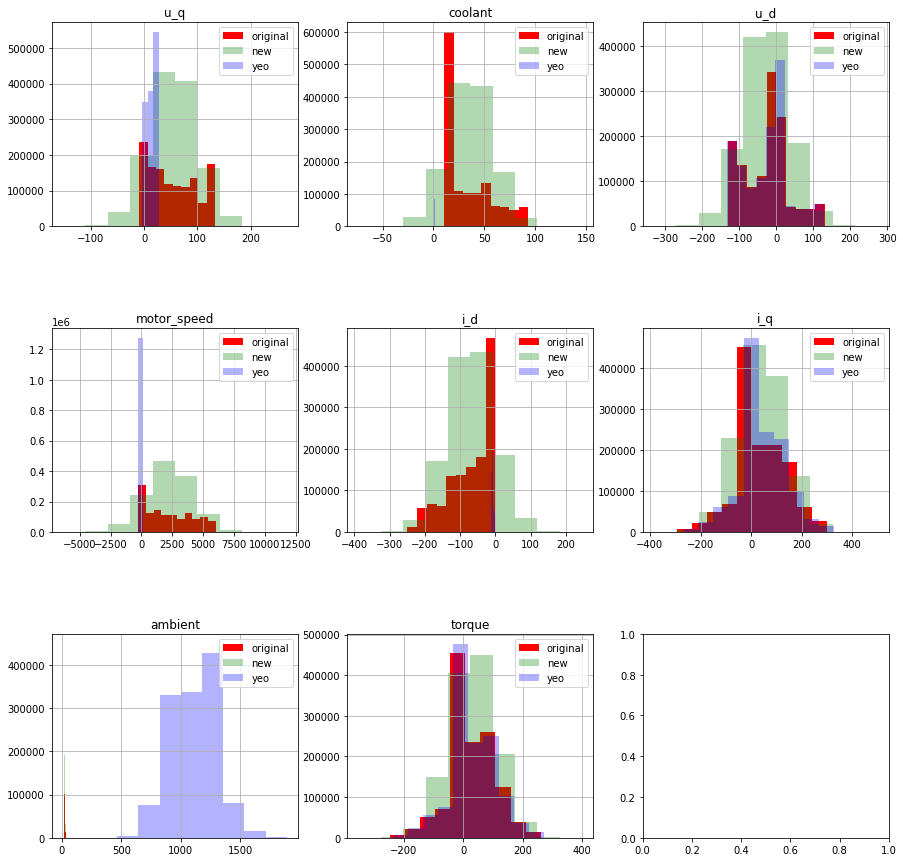

In [45]:
plot_histograms(measures_train_df_X[measures_numeric_columns], 
                matched_measures_train_df_X_not[measures_numeric_columns], 
                yeo_measures_train_df_X[measures_numeric_columns])

## Plot a Heatmap of all columns to targets

In [46]:
matched_measures_df_corr = pd.concat([matched_measures_train_df_X, measures_train_df_y], axis=1)
matched_measures_df_corr_not = pd.concat([matched_measures_train_df_X_not, measures_train_df_y], axis=1)
yeo_measures_df_corr = pd.concat([yeo_measures_train_df_X, measures_train_df_y], axis=1)

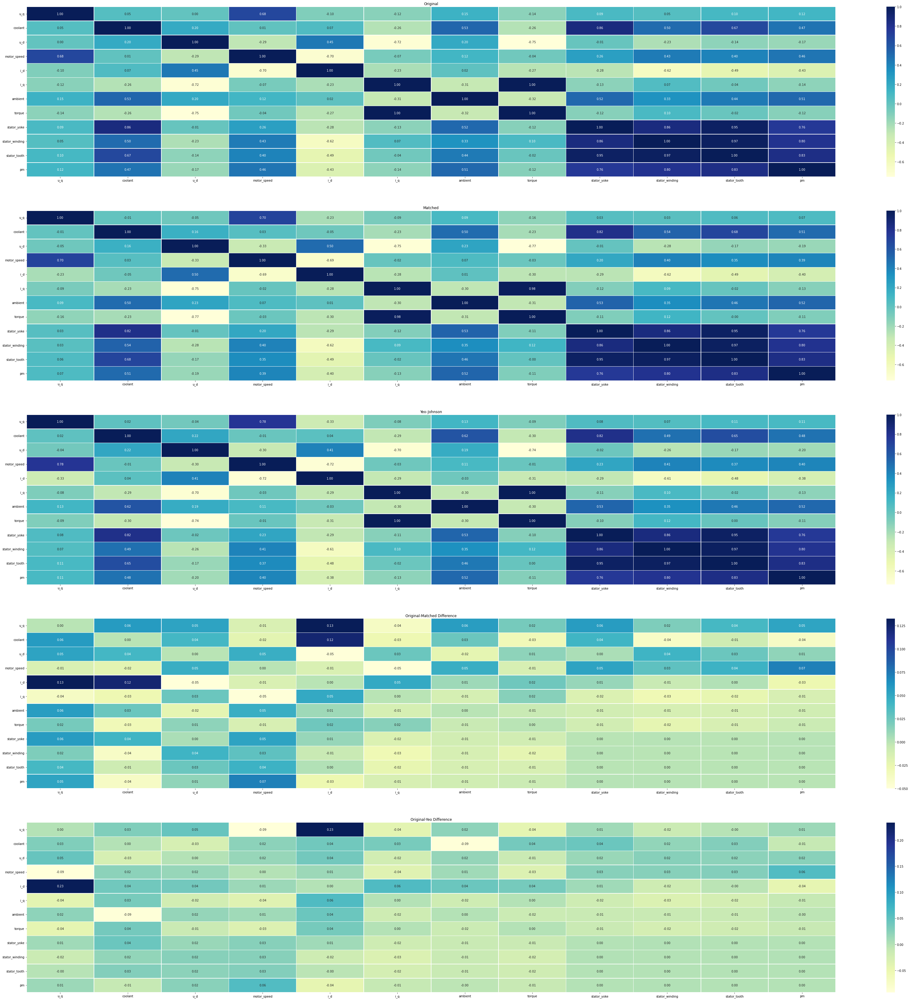

In [47]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

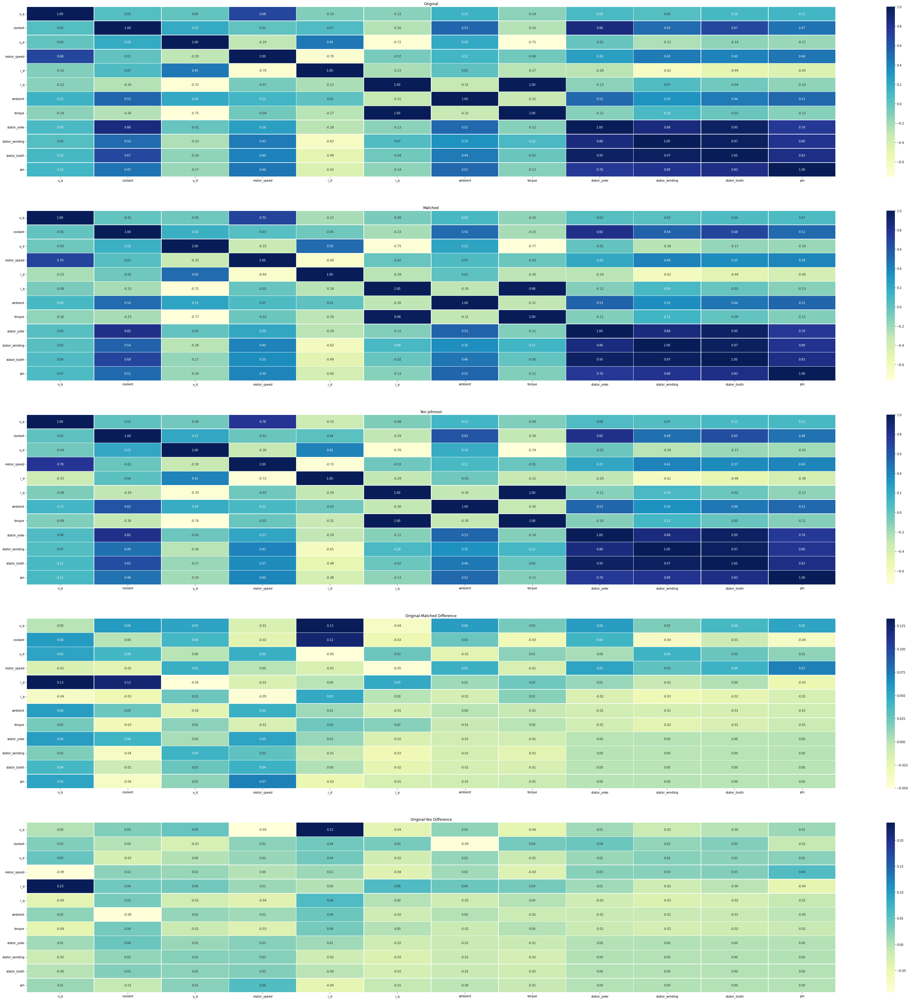

In [48]:
plot_correlation_heatmaps(measures_df, matched_measures_df_corr_not, yeo_measures_df_corr,\
                          measures_numeric_columns + ['stator_yoke', 'stator_winding', 'stator_tooth', 'pm'])

In [49]:
for column in measures_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_measures_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_measures_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: stator_yoke ===============
matched corr sum: 5.679226575091583
yeo corr sum: 5.759830482150586
=============== Compare sum of corr for target column: stator_winding ===============
matched corr sum: 6.057142346929568
yeo corr sum: 6.011968584461707
=============== Compare sum of corr for target column: stator_tooth ===============
matched corr sum: 5.995530746456726
yeo corr sum: 6.0017245441475815
=============== Compare sum of corr for target column: pm ===============
matched corr sum: 5.693607978413993
yeo corr sum: 5.703339580359221


In [50]:
measures_diff_corr_df = pd.concat([
           matched_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_measures_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

measures_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
u_q,2.525097,2.840165
coolant,4.749280,4.918981
u_d,4.422537,4.250147
motor_speed,4.220980,4.362243
i_d,4.850136,4.887881
i_q,4.004542,4.055712
ambient,4.370082,4.514042
torque,4.109894,4.075795
stator_yoke,5.679227,5.759830
stator_winding,6.057142,6.011969


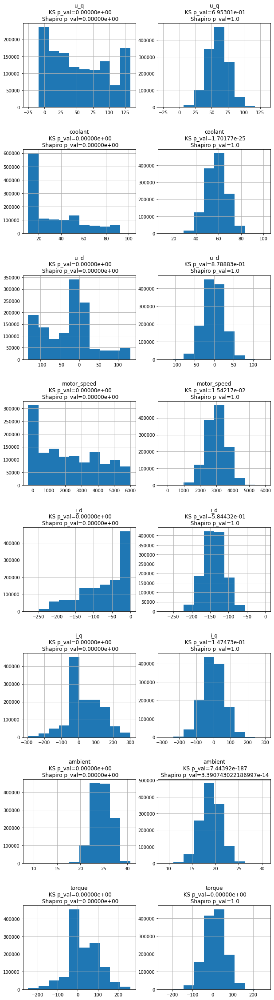

In [51]:
plot_histograms_side_by_side(measures_train_df_X, matched_measures_train_df_X)

## Plot waterfall of each model

In [55]:
# def plot_waterfall_coeficients(X_train, X_test, y_test, prediction, model, sample_size=1000):
#     # prediction = prediction.reshape(-1, 1)
#     ## residuals
#     residuals = y_test - prediction

#     rel_res=residuals/y_test
#     rel_res=rel_res.abs()

#     shap_sample = X_train.sample(sample_size)

#     explainer = shap.Explainer(model.predict, shap_sample)
#     shap_values = explainer(shap_sample)

#     test_shap_values = explainer(X_test)

#     max_id = rel_res[rel_res==rel_res.max()].index[0]
#     max_ordinal_id = X_test.index.get_loc(max_id)

#     shap.plots.waterfall(test_shap_values[max_ordinal_id])

Plot for regular model

In [56]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     model = LinearRegression()
#     prediction = model.fit(measures_train_df_X,measures_train_df_y[column]).predict(measures_test_df_X)
#     plot_waterfall_coeficients(measures_train_df_X, measures_test_df_X, measures_test_df_y[column], prediction, model)

Plot for normalized model

In [57]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     matched_model = LinearRegression()
#     matched_prediction = matched_model.fit(matched_measures_train_df_X,measures_train_df_y[column]).predict(matched_measures_test_df_X)
#     plot_waterfall_coeficients(matched_measures_train_df_X, matched_measures_test_df_X, measures_test_df_y[column], matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [58]:
# for column in measures_test_df_y:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on second Dataset (Regression)

https://www.kaggle.com/deepcontractor/miami-housing-dataset

In [52]:
!if [ ! -f datasets/miami-housing.csv ]; then kaggle datasets download --unzip -d deepcontractor/miami-housing-dataset -p datasets/; fi;

100%|████████████████████████████████████████| 650k/650k [00:00<00:00, 2.23MB/s]
100%|████████████████████████████████████████| 650k/650k [00:00<00:00, 2.23MB/s]


In [53]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/miami-housing.zip' -d './miami-housing.zip'

In [54]:
# !unzip -n ./miami-housing-dataset.zip -d .
# !rm -rf ./miami-housing-dataset.zip

In [55]:
# !unzip -n ./miami-housing.zip -d .
# !rm -rf ./miami-housing.zip

In [56]:
miami_df = pd.read_csv('./datasets/miami-housing.csv')

In [57]:
get_insights(miami_df)

,min,max,mean,median,std,var,skew,kurtosis,entropy
LATITUDE,2.543433e+01,2.597438e+01,2.572881e+01,2.573181e+01,1.406333e-01,1.977772e-02,-0.094570,-0.969276,9.526271
LONGITUDE,-8.054217e+01,-8.011975e+01,-8.032748e+01,-8.033891e+01,8.919907e-02,7.956474e-03,0.292592,-0.908129,9.526271
PARCELNO,1.020008e+11,3.660170e+12,2.356496e+12,3.040300e+12,1.199290e+12,1.438298e+24,-0.897812,-0.938196,9.526271
SALE_PRC,7.200000e+04,2.650000e+06,3.999419e+05,3.100000e+05,3.172147e+05,1.006252e+11,3.215506,13.275156,6.333583
LND_SQFOOT,1.248000e+03,5.706400e+04,8.620880e+03,7.500000e+03,6.070089e+03,3.684598e+07,3.830115,19.076805,6.992606
TOT_LVG_AREA,8.540000e+02,6.287000e+03,2.058045e+03,1.877500e+03,8.135385e+02,6.618449e+05,1.346930,2.487290,7.688164
SPEC_FEAT_VAL,0.000000e+00,1.750200e+05,9.562493e+03,2.765500e+03,1.389097e+04,1.929590e+08,1.902250,4.667249,7.703347
RAIL_DIST,1.050000e+01,2.962150e+04,8.348549e+03,7.106300e+03,6.178027e+03,3.816802e+07,0.824282,-0.012673,9.471141
OCEAN_DIST,2.361000e+02,7.574490e+04,3.169099e+04,2.854175e+04,1.759508e+04,3.095868e+08,0.393140,-0.690381,9.510187
WATER_DIST,0.000000e+00,5.039980e+04,1.196029e+04,6.922600e+03,1.193299e+04,1.423963e+08,1.138049,0.328991,9.444248


In [58]:
miami_df.describe()

,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
count,13932.000000,13932.000000,1.393200e+04,1.393200e+04,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000,13932.000000
mean,25.728811,-80.327475,2.356496e+12,3.999419e+05,8620.879917,2058.044574,9562.493468,8348.548715,31690.993798,11960.285235,68490.327132,41115.047265,7723.770693,30.669251,0.014930,6.655828,3.513997
std,0.140633,0.089199,1.199290e+12,3.172147e+05,6070.088742,813.538535,13890.967782,6178.027333,17595.079468,11932.992369,32008.474808,22161.825935,6068.936108,21.153068,0.121276,3.301523,1.097444
min,25.434333,-80.542172,1.020008e+11,7.200000e+04,1248.000000,854.000000,0.000000,10.500000,236.100000,0.000000,3825.600000,1462.800000,90.200000,0.000000,0.000000,1.000000,1.000000
25%,25.620056,-80.403278,1.079160e+12,2.350000e+05,5400.000000,1470.000000,810.000000,3299.450000,18079.350000,2675.850000,42823.100000,23996.250000,2998.125000,14.000000,0.000000,4.000000,2.000000
50%,25.731810,-80.338911,3.040300e+12,3.100000e+05,7500.000000,1877.500000,2765.500000,7106.300000,28541.750000,6922.600000,65852.400000,41109.900000,6159.750000,26.000000,0.000000,7.000000,4.000000
75%,25.852269,-80.258019,3.060170e+12,4.280000e+05,9126.250000,2471.000000,12352.250000,12102.600000,44310.650000,19200.000000,89358.325000,53949.375000,10854.200000,46.000000,0.000000,9.000000,4.000000
max,25.974382,-80.119746,3.660170e+12,2.650000e+06,57064.000000,6287.000000,175020.000000,29621.500000,75744.900000,50399.800000,159976.500000,110553.800000,48167.300000,96.000000,1.000000,12.000000,5.000000


In [59]:
print(miami_df.shape)
miami_df.head()

(13932, 17)


,LATITUDE,LONGITUDE,PARCELNO,SALE_PRC,LND_SQFOOT,TOT_LVG_AREA,SPEC_FEAT_VAL,RAIL_DIST,OCEAN_DIST,WATER_DIST,CNTR_DIST,SUBCNTR_DI,HWY_DIST,age,avno60plus,month_sold,structure_quality
0,25.891031,-80.160561,622280070620,440000.0,9375,1753,0,2815.9,12811.4,347.6,42815.3,37742.2,15954.9,67,0,8,4
1,25.891324,-80.153968,622280100460,349000.0,9375,1715,0,4359.1,10648.4,337.8,43504.9,37340.5,18125.0,63,0,9,4
2,25.891334,-80.153740,622280100470,800000.0,9375,2276,49206,4412.9,10574.1,297.1,43530.4,37328.7,18200.5,61,0,2,4
3,25.891765,-80.152657,622280100530,988000.0,12450,2058,10033,4585.0,10156.5,0.0,43797.5,37423.2,18514.4,63,0,9,4
4,25.891825,-80.154639,622280100200,755000.0,12800,1684,16681,4063.4,10836.8,326.6,43599.7,37550.8,17903.4,42,0,7,4


In [87]:
miami_df_train, miami_df_test = train_test_split(miami_df, test_size=0.25)

print(miami_df_train.shape)
print(miami_df_test.shape)

(10449, 17)
(3483, 17)


Remove target column

In [88]:
labels_to_remove = ['SALE_PRC', 'PARCELNO', 'LATITUDE', 'LONGITUDE', 'month_sold']

miami_train_X = miami_df_train.drop(labels_to_remove, axis=1)
miami_train_y = miami_df_train['SALE_PRC']

miami_test_X = miami_df_test.drop(labels_to_remove, axis=1)
miami_test_y = miami_df_test['SALE_PRC']

Split to numeric and categorical columns

In [89]:
miami_numeric_columns, miami_categorical_columns = get_numeric_categorical_columns(miami_train_X, ['SALE_PRC'], 1)

column: LND_SQFOOT, %: 36.66379557852426
column: TOT_LVG_AREA, %: 26.299167384438704
column: SPEC_FEAT_VAL, %: 58.7520336874342
column: RAIL_DIST, %: 96.27715570868025
column: OCEAN_DIST, %: 98.30605799598048
column: WATER_DIST, %: 95.7699301368552
column: CNTR_DIST, %: 98.68886974830127
column: SUBCNTR_DI, %: 98.38262034644464
column: HWY_DIST, %: 95.98047660063163
column: age, %: 0.9091779117618911
column: avno60plus, %: 0.019140587616039813
column: structure_quality, %: 0.04785146904009953
numeric_columns = ['LND_SQFOOT', 'TOT_LVG_AREA', 'SPEC_FEAT_VAL', 'RAIL_DIST', 'OCEAN_DIST', 'WATER_DIST', 'CNTR_DIST', 'SUBCNTR_DI', 'HWY_DIST']
categorical_columns = ['age', 'avno60plus', 'structure_quality']


In [90]:
scaler = StandardScaler()
scaler.fit(miami_train_X)
miami_train_X = pd.DataFrame(scaler.transform(miami_train_X), columns=miami_test_X.columns, index=miami_train_y.index)

In [91]:
scaler = StandardScaler()
scaler.fit(miami_test_X)
miami_test_X = pd.DataFrame(scaler.transform(miami_test_X), columns=miami_train_X.columns, index=miami_test_y.index)

### Visualize histograms of features

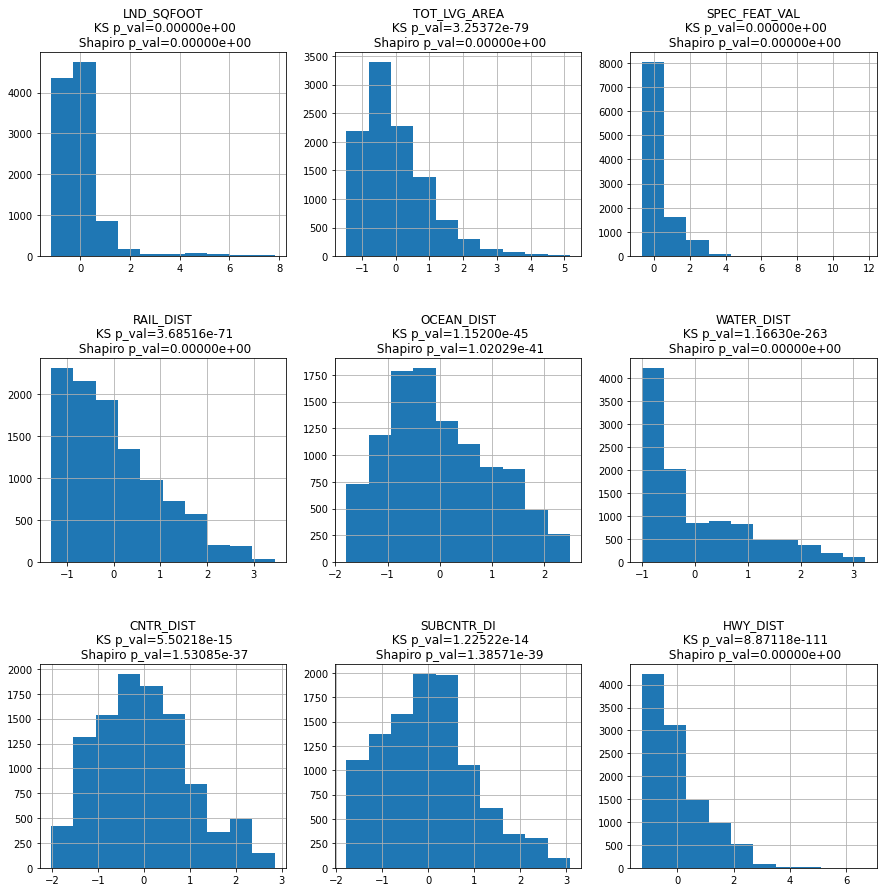

In [92]:
plot_numerical_histograms(miami_train_X, miami_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: LND_SQFOOT
Correction: TOT_LVG_AREA
Correction: SPEC_FEAT_VAL
Correction: RAIL_DIST
Correction: OCEAN_DIST
Correction: WATER_DIST
Correction: CNTR_DIST
Correction: SUBCNTR_DI
Correction: HWY_DIST


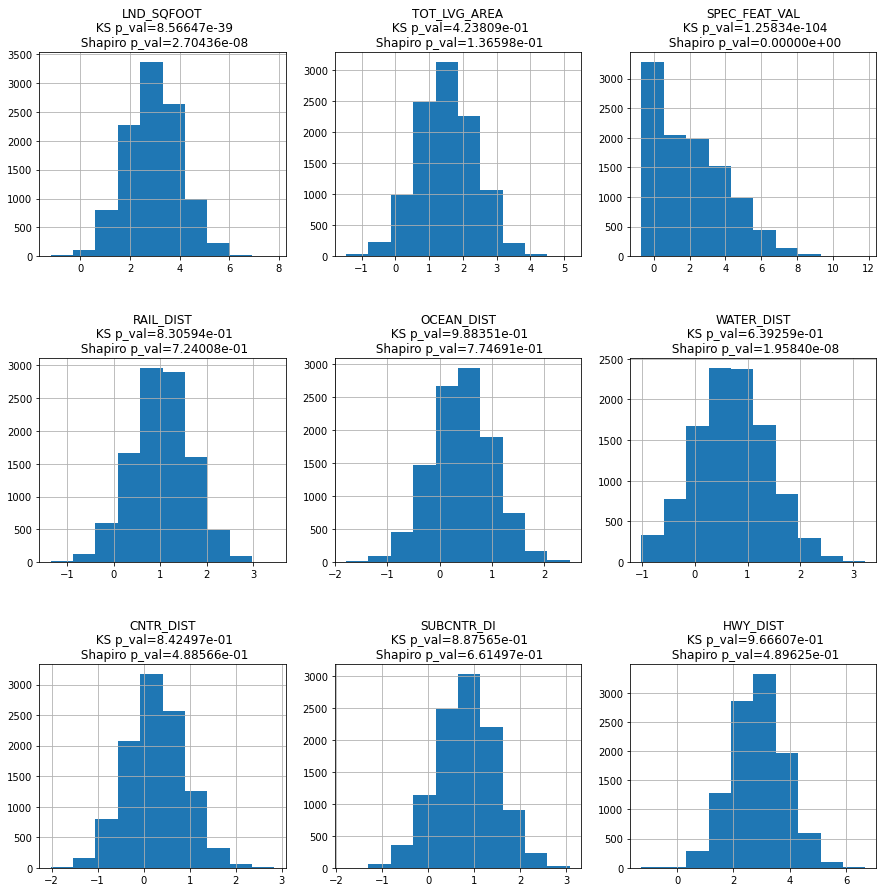

In [93]:
matched_miami_train_df_X, matched_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)
matched_miami_train_df_X_not, matched_miami_train_df_X_normal_mapping_not = transform_dataset(miami_train_X[miami_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_miami_train_df_X, miami_numeric_columns)

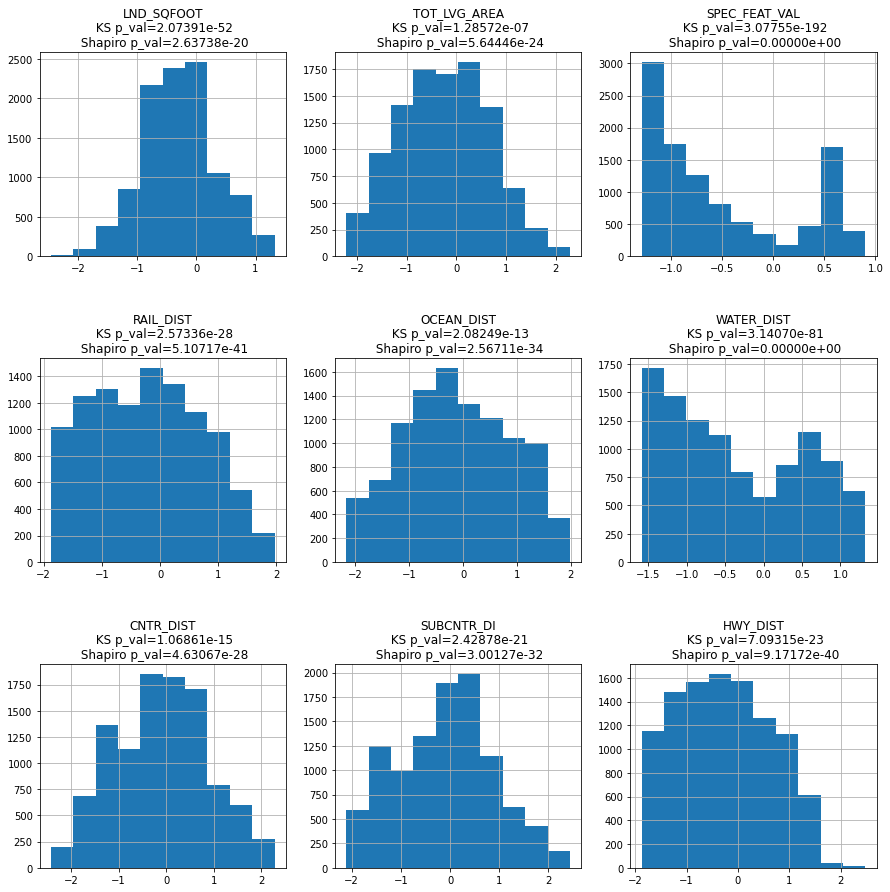

In [94]:
yeo_miami_train_df_X, yeo_miami_train_df_X_normal_mapping = transform_dataset(miami_train_X[miami_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_miami_train_df_X, miami_numeric_columns)

#### Match test set X

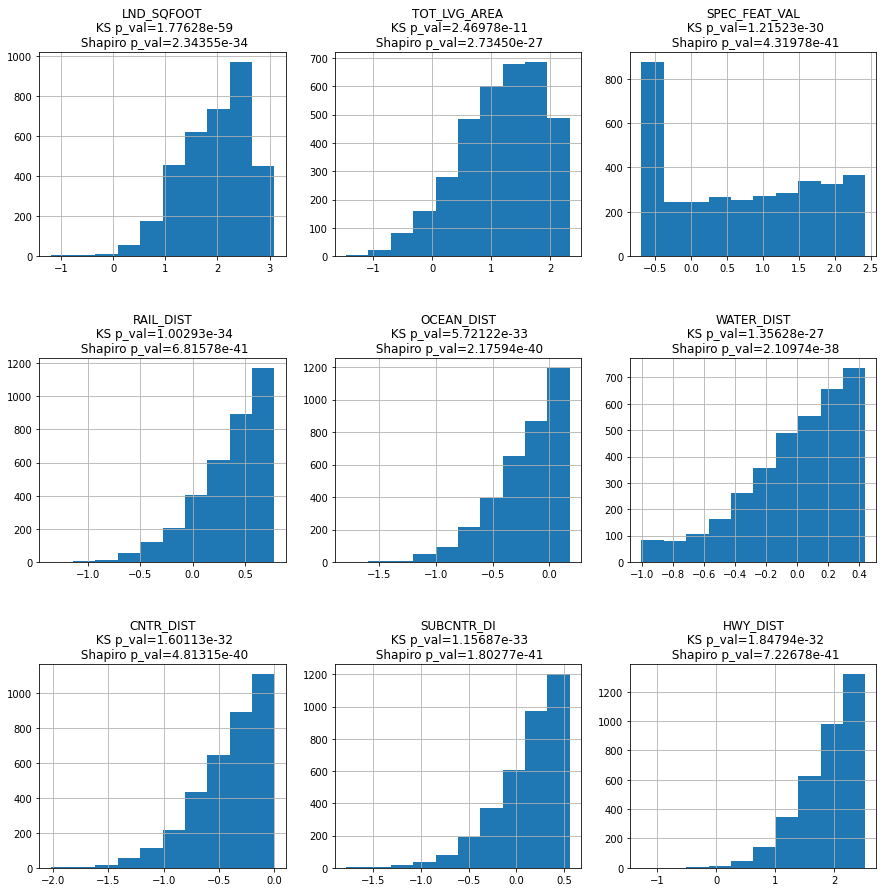

In [95]:
matched_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], match_to_normal_distribution, mapping=matched_miami_train_df_X_normal_mapping)
plot_numerical_histograms(matched_miami_test_df_X, miami_numeric_columns)

In [96]:
yeo_miami_test_df_X, _ = transform_dataset(miami_test_X[miami_numeric_columns], stats.yeojohnson, mapping=yeo_miami_train_df_X_normal_mapping)

In [97]:
matched_miami_train_df_X = pd.concat([matched_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
matched_miami_test_df_X = pd.concat([matched_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

yeo_miami_train_df_X = pd.concat([yeo_miami_train_df_X, miami_train_X[miami_categorical_columns]], axis=1)
yeo_miami_test_df_X = pd.concat([yeo_miami_test_df_X, miami_test_X[miami_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

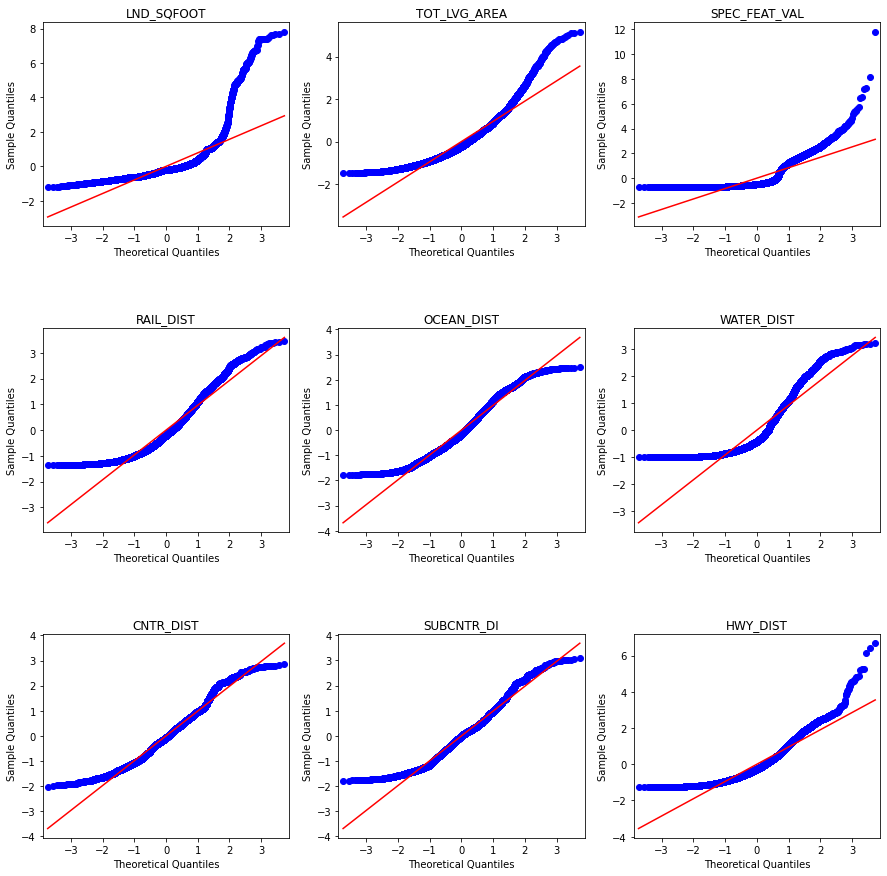

In [98]:
qq_plot_data(miami_train_X, miami_numeric_columns)

### QQ plots for Matched features

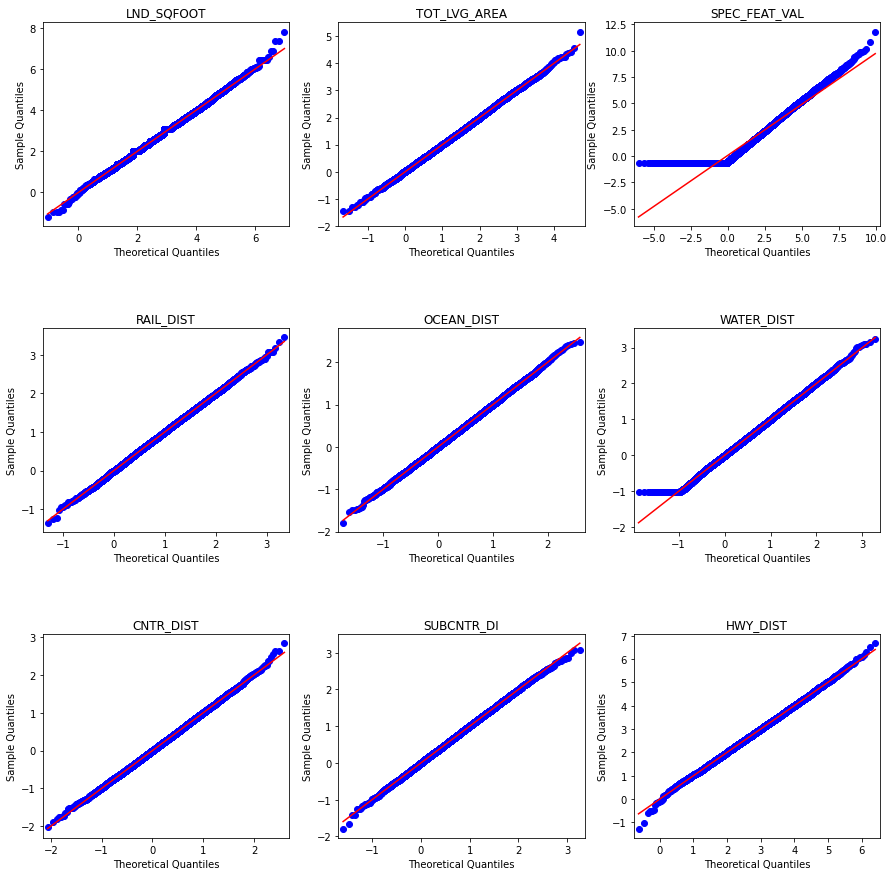

In [99]:
qq_plot_data(matched_miami_train_df_X, miami_numeric_columns)

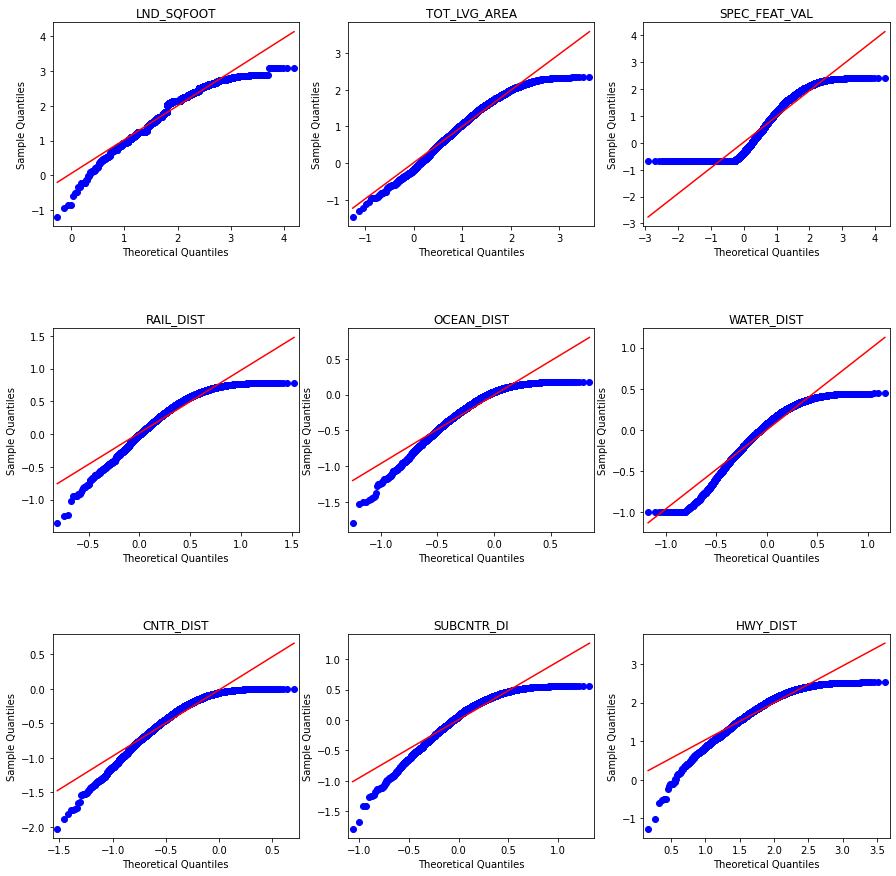

In [100]:
qq_plot_data(matched_miami_test_df_X, miami_numeric_columns)

### QQ plots for Yeo-Johnson features

In [101]:
yeo_miami_train_df_X.isna().sum()

LND_SQFOOT           0
TOT_LVG_AREA         0
SPEC_FEAT_VAL        0
RAIL_DIST            0
OCEAN_DIST           0
WATER_DIST           0
CNTR_DIST            0
SUBCNTR_DI           0
HWY_DIST             0
age                  0
avno60plus           0
structure_quality    0
dtype: int64

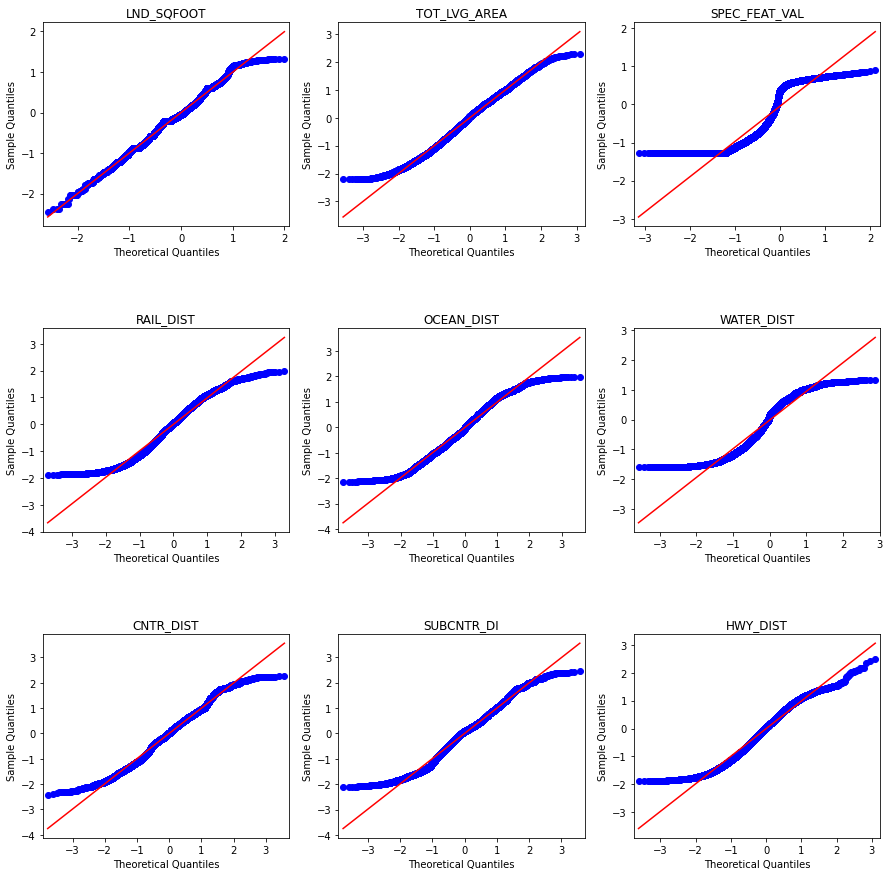

In [103]:
qq_plot_data(yeo_miami_train_df_X, miami_numeric_columns)

## Compare model preformance

### Test on regular data

In [104]:
model = LinearRegression()
prediction = model.fit(miami_train_X, miami_train_y).predict(miami_test_X)
print(f'r2={r2_score(miami_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.6856990325395769
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.332
Mean Absolute Error (Σ|y - pred|/n): 114,305
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 179,696


### Test on matched data

In [105]:
model = LinearRegression()
prediction = model.fit(matched_miami_train_df_X, miami_train_y).predict(matched_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.48725781542032365
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.477
Mean Absolute Error (Σ|y - pred|/n): 162,966
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 229,517


### Test on Yeo-Johnson data

In [106]:
model = LinearRegression()
prediction = model.fit(yeo_miami_train_df_X, miami_train_y).predict(yeo_miami_test_df_X)
print(f'r2={r2_score(miami_test_y, prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(miami_test_y, prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(miami_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(miami_test_y, prediction))))

r2=0.6302273851434688
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.376
Mean Absolute Error (Σ|y - pred|/n): 125,853
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 194,909


## Try to normalize only 1 column at a time and Compare to regular model

In [107]:
compare_one_norm_column(miami_train_X, miami_test_X, miami_train_y, miami_test_y,\
                        matched_miami_train_df_X, matched_miami_test_df_X, yeo_miami_train_df_X,\
                        yeo_miami_test_df_X, 'SALE_PRC', miami_numeric_columns)

=== Measure for regular model: ===
column=SALE_PRC, r2=0.6856990325395769
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.332
Mean Absolute Error (Σ|y - pred|/n): 114,305
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 179,696

=== Compare for column LND_SQFOOT ===
column=LND_SQFOOT, matched r2=0.6835026199171997
column=LND_SQFOOT, yeo r2=0.6846971743184347

=== Compare for column TOT_LVG_AREA ===
column=TOT_LVG_AREA, matched r2=0.5874745820829606
column=TOT_LVG_AREA, yeo r2=0.6430807369887821

=== Compare for column SPEC_FEAT_VAL ===
column=SPEC_FEAT_VAL, matched r2=0.672981408216296
column=SPEC_FEAT_VAL, yeo r2=0.6805592554314317

=== Compare for column RAIL_DIST ===
column=RAIL_DIST, matched r2=0.6731653294443714
column=RAIL_DIST, yeo r2=0.6827909141027027

=== Compare for column OCEAN_DIST ===
column=OCEAN_DIST, matched r2=0.5907097878145589
column=OCEAN_DIST, yeo r2=0.6899053366421468

=== Compare for column WATER_DIST ===
column=WATER_DIST, matched r2=0.6748213693682034
column=W

## Get insights about the data

In [108]:
miami_insights = get_insights(miami_train_X[miami_numeric_columns])
miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-1.196446,7.818657,-6.969707e-17,-0.186656,1.000048,1.000096,3.838654,18.892978,6.902732
TOT_LVG_AREA,-1.465761,5.169366,-1.434450e-16,-0.224957,1.000048,1.000096,1.372556,2.613224,7.640119
SPEC_FEAT_VAL,-0.688687,11.811187,3.448396e-17,-0.489855,1.000048,1.000096,1.928168,5.063825,7.579753
RAIL_DIST,-1.354127,3.450378,7.991183e-17,-0.197694,1.000048,1.000096,0.827509,0.010544,9.201553
OCEAN_DIST,-1.792896,2.489026,6.710320e-17,-0.169942,1.000048,1.000096,0.380519,-0.712860,9.230628
WATER_DIST,-1.005790,3.225999,-1.155114e-16,-0.420071,1.000048,1.000096,1.129103,0.299404,9.171251
CNTR_DIST,-2.022710,2.844049,-5.809838e-17,-0.078681,1.000048,1.000096,0.430492,-0.288516,9.236035
SUBCNTR_DI,-1.784262,3.078734,-1.798202e-16,-0.006109,1.000048,1.000096,0.457242,-0.190945,9.231790
HWY_DIST,-1.262037,6.679305,-9.488268e-17,-0.257256,1.000048,1.000096,1.141100,1.283177,9.197988


In [109]:
matched_miami_insights = get_insights(matched_miami_train_df_X[miami_numeric_columns])
matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-1.196446,7.818657,2.975096,3.082971,1.078164,1.162437,0.034778,0.133933,6.902732
TOT_LVG_AREA,-1.465761,5.169366,1.512150,1.503989,0.852878,0.727402,0.038685,-0.061953,7.640119
SPEC_FEAT_VAL,-0.688687,11.811187,1.971113,1.750233,2.140526,4.581854,0.563871,-0.320014,7.579753
RAIL_DIST,-1.354127,3.450378,1.023624,1.028313,0.622769,0.387841,-0.026967,-0.003636,9.201553
OCEAN_DIST,-1.792896,2.489026,0.426395,0.428029,0.578684,0.334875,0.025301,-0.033033,9.230628
WATER_DIST,-1.005790,3.225999,0.702786,0.696620,0.691087,0.477601,0.052416,-0.114092,9.171251
CNTR_DIST,-2.022710,2.844049,0.268598,0.266156,0.624886,0.390483,0.043146,-0.032165,9.236035
SUBCNTR_DI,-1.784262,3.078734,0.832407,0.839885,0.650088,0.422615,-0.028813,-0.055380,9.231790
HWY_DIST,-1.262037,6.679305,2.888415,2.882728,0.943266,0.889751,0.022056,0.058488,9.197988


In [110]:
matched_not_miami_insights = get_insights(matched_miami_train_df_X_not[miami_numeric_columns])
matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-3.740437,3.715874,0.010877,0.114600,0.993343,0.986730,-0.031991,0.118518,6.902732
TOT_LVG_AREA,-3.231709,4.249891,0.006527,-0.005274,0.997265,0.994538,0.007307,-0.063353,7.640119
SPEC_FEAT_VAL,-0.998396,3.336787,0.074881,-0.013295,0.866601,0.750997,0.573870,-0.335068,7.579753
RAIL_DIST,-4.086891,3.476805,0.001750,0.003236,1.002764,1.005536,-0.035654,0.002099,9.201553
OCEAN_DIST,-3.754075,3.617088,-0.002779,-0.003414,1.001981,1.003966,-0.000437,0.024019,9.230628
WATER_DIST,-2.410542,3.726379,0.027243,0.032197,0.998830,0.997662,0.052172,-0.091441,9.171251
CNTR_DIST,-4.403523,4.007070,-0.012495,-0.015660,0.986451,0.973085,-0.001194,0.032125,9.236035
SUBCNTR_DI,-4.942358,3.780488,-0.002789,0.000532,1.001602,1.003206,-0.017356,0.070017,9.231790
HWY_DIST,-3.812196,3.511417,0.009826,0.003648,0.997628,0.995261,-0.010015,-0.089022,9.197988


In [111]:
yeo_miami_insights = get_insights(yeo_miami_train_df_X[miami_numeric_columns])
yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,-2.464444,1.322333,-0.291551,-0.213651,0.613829,0.376786,0.006268,-0.048918,6.902732
TOT_LVG_AREA,-2.212811,2.283031,-0.236907,-0.243846,0.892656,0.796834,0.081390,-0.594872,7.640119
SPEC_FEAT_VAL,-1.283069,0.902942,-0.520603,-0.773911,0.704918,0.496910,0.618082,-1.137380,7.579753
RAIL_DIST,-1.878571,1.968047,-0.217747,-0.210032,0.938023,0.879887,0.112980,-0.995297,9.201553
OCEAN_DIST,-2.168024,1.983188,-0.110253,-0.174256,0.985449,0.971109,0.031618,-0.857392,9.230628
WATER_DIST,-1.589311,1.326268,-0.352062,-0.520110,0.864742,0.747779,0.274672,-1.274571,9.171251
CNTR_DIST,-2.428620,2.282728,-0.096350,-0.079515,0.985553,0.971314,0.042154,-0.608781,9.236035
SUBCNTR_DI,-2.112221,2.438800,-0.096836,-0.006114,0.984525,0.969289,0.055345,-0.608059,9.231790
HWY_DIST,-1.873357,2.475376,-0.262013,-0.283837,0.900797,0.811435,0.131538,-0.952137,9.197988


In [112]:
miami_insights - matched_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,0.0,-8.881784e-16,-2.975096,-3.269627,-0.078116,-0.162342,3.803876,18.759044,0.0
TOT_LVG_AREA,0.0,0.000000e+00,-1.512150,-1.728945,0.147169,0.272694,1.333871,2.675177,0.0
SPEC_FEAT_VAL,0.0,1.776357e-15,-1.971113,-2.240088,-1.140479,-3.581758,1.364298,5.383840,0.0
RAIL_DIST,0.0,0.000000e+00,-1.023624,-1.226007,0.377279,0.612255,0.854476,0.014180,0.0
OCEAN_DIST,0.0,-4.440892e-16,-0.426395,-0.597971,0.421364,0.665220,0.355218,-0.679827,0.0
WATER_DIST,0.0,0.000000e+00,-0.702786,-1.116691,0.308961,0.522494,1.076688,0.413496,0.0
CNTR_DIST,0.0,-4.440892e-16,-0.268598,-0.344837,0.375162,0.609613,0.387347,-0.256351,0.0
SUBCNTR_DI,0.0,0.000000e+00,-0.832407,-0.845994,0.349959,0.577481,0.486056,-0.135565,0.0
HWY_DIST,0.0,0.000000e+00,-2.888415,-3.139985,0.056782,0.110345,1.119044,1.224688,0.0


In [113]:
miami_insights - matched_not_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,2.543991,4.102783,-0.010877,-0.301256,0.006705,0.013366,3.870645,18.774460,0.0
TOT_LVG_AREA,1.765948,0.919474,-0.006527,-0.219682,0.002783,0.005558,1.365249,2.676577,0.0
SPEC_FEAT_VAL,0.309709,8.474401,-0.074881,-0.476560,0.133447,0.249099,1.354298,5.398893,0.0
RAIL_DIST,2.732763,-0.026426,-0.001750,-0.200929,-0.002716,-0.005440,0.863163,0.008445,0.0
OCEAN_DIST,1.961179,-1.128062,0.002779,-0.166527,-0.001933,-0.003870,0.380956,-0.736879,0.0
WATER_DIST,1.404752,-0.500380,-0.027243,-0.452268,0.001218,0.002434,1.076932,0.390845,0.0
CNTR_DIST,2.380813,-1.163021,0.012495,-0.063021,0.013597,0.027010,0.431686,-0.320641,0.0
SUBCNTR_DI,3.158096,-0.701755,0.002789,-0.006641,-0.001554,-0.003111,0.474598,-0.260962,0.0
HWY_DIST,2.550159,3.167888,-0.009826,-0.260904,0.002420,0.004835,1.151115,1.372198,0.0


In [114]:
miami_insights - yeo_miami_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
LND_SQFOOT,1.267998,6.496324,0.291551,0.026994,0.386218,0.623309,3.832386,18.941896,0.0
TOT_LVG_AREA,0.747050,2.886335,0.236907,0.018890,0.107392,0.203261,1.291166,3.208096,0.0
SPEC_FEAT_VAL,0.594381,10.908245,0.520603,0.284056,0.295130,0.503186,1.310087,6.201205,0.0
RAIL_DIST,0.524443,1.482331,0.217747,0.012338,0.062025,0.120209,0.714529,1.005841,0.0
OCEAN_DIST,0.375129,0.505838,0.110253,0.004314,0.014599,0.028986,0.348901,0.144532,0.0
WATER_DIST,0.583521,1.899731,0.352062,0.100040,0.135305,0.252316,0.854431,1.573975,0.0
CNTR_DIST,0.405909,0.561321,0.096350,0.000834,0.014495,0.028781,0.388339,0.320265,0.0
SUBCNTR_DI,0.327959,0.639934,0.096836,0.000005,0.015523,0.030807,0.401898,0.417114,0.0
HWY_DIST,0.611320,4.203929,0.262013,0.026580,0.099251,0.188661,1.009561,2.235313,0.0


## Plot distributions

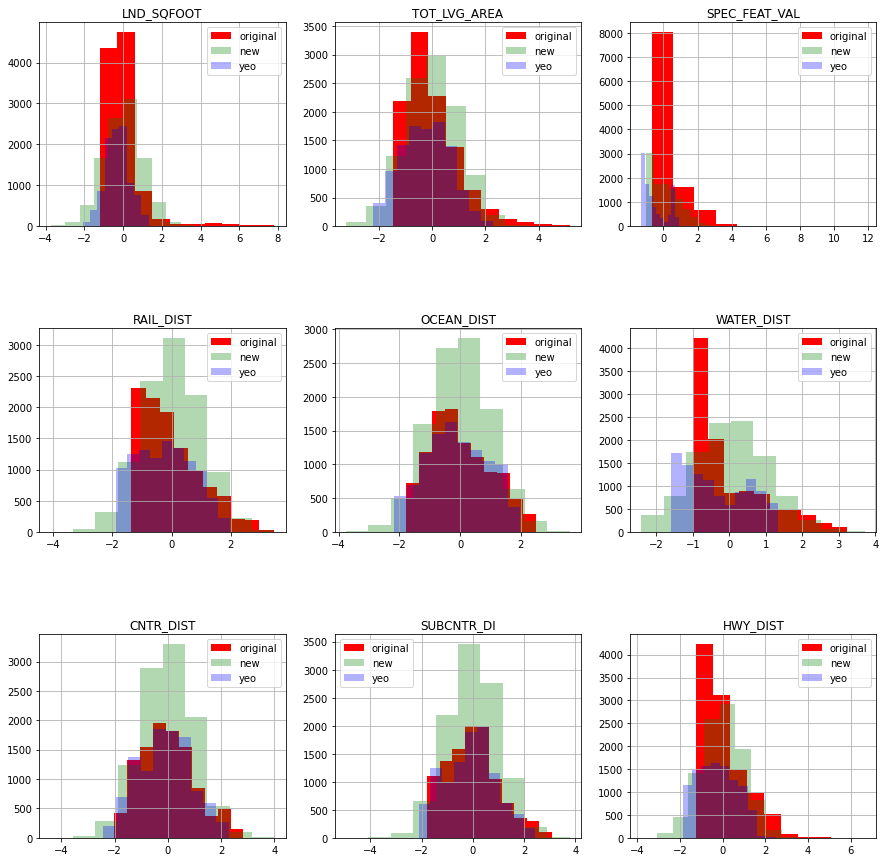

In [115]:
plot_histograms(miami_train_X[miami_numeric_columns], 
                matched_miami_train_df_X_not[miami_numeric_columns], 
                yeo_miami_train_df_X[miami_numeric_columns])

## Plot a Heatmap of all columns to targets

In [116]:
matched_miami_df_corr = pd.concat([matched_miami_train_df_X, miami_train_y], axis=1)
yeo_miami_df_corr = pd.concat([yeo_miami_train_df_X, miami_train_y], axis=1)

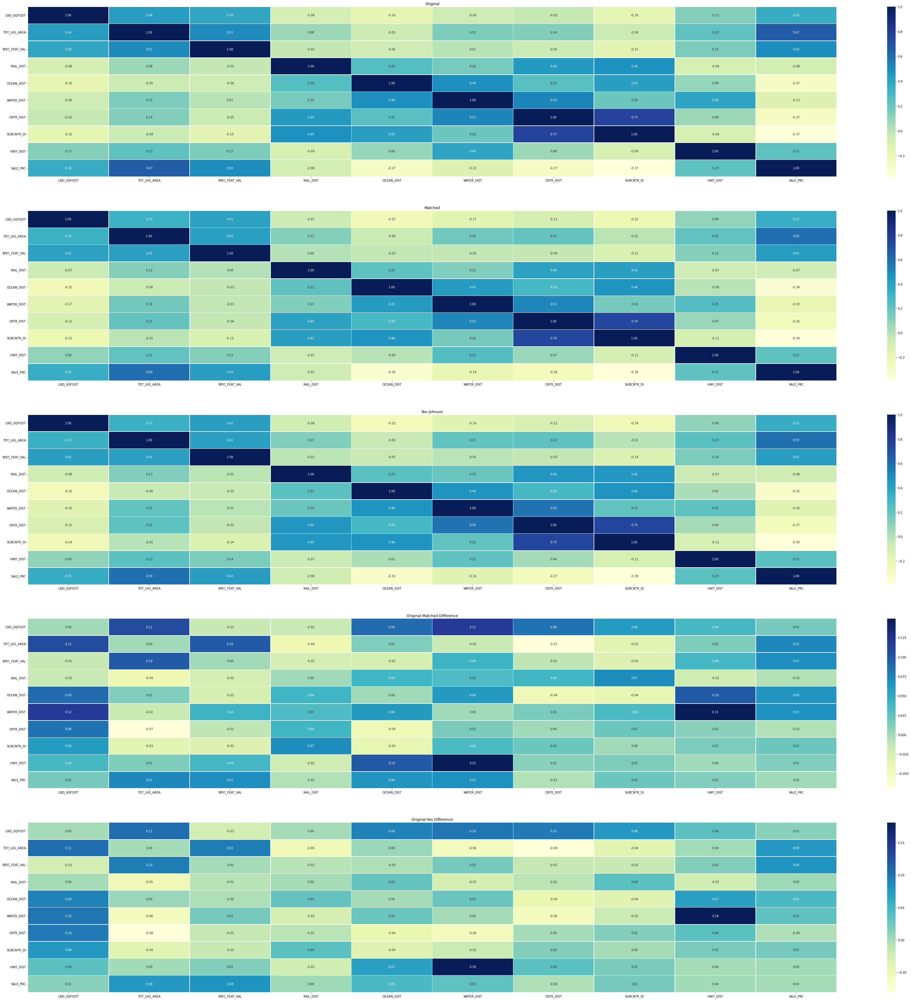

In [117]:
plot_correlation_heatmaps(miami_df, matched_miami_df_corr, yeo_miami_df_corr, miami_numeric_columns + ['SALE_PRC'])

In [118]:
for column in miami_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_miami_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_miami_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: SALE_PRC ===============
matched corr sum: 4.379532258407342
yeo corr sum: 4.341361563337148


In [119]:
miami_diff_corr_df = pd.concat([
           matched_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_miami_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

miami_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
LND_SQFOOT,3.250249,3.305997
TOT_LVG_AREA,3.721235,3.777089
SPEC_FEAT_VAL,2.842192,2.863524
RAIL_DIST,2.918081,3.144583
OCEAN_DIST,3.438124,3.521207
WATER_DIST,3.593985,3.796804
CNTR_DIST,4.595298,4.750708
SUBCNTR_DI,4.316192,4.451718
HWY_DIST,2.422991,2.442895
age,3.645834,3.687112


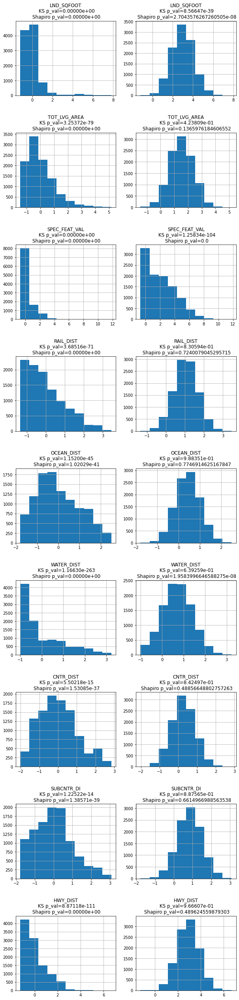

In [120]:
plot_histograms_side_by_side(miami_train_X[miami_numeric_columns], matched_miami_train_df_X[miami_numeric_columns])

## Plot waterfall of each model

Plot for regular model

In [121]:
# print(f'Plot for column: Age')
# model = LinearRegression()
# prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
# plot_waterfall_coeficients(crab_train_X, crab_test_X, crab_test_y, prediction, model)

Plot for normalized model

In [122]:
# print(f'Plot for column: Age')
# matched_model = LinearRegression()
# matched_prediction = matched_model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
# plot_waterfall_coeficients(matched_crab_train_df_X, matched_crab_test_df_X, crab_test_y, matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [123]:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on third Dataset (Regression)

https://www.kaggle.com/sidhus/crab-age-prediction

In [124]:
!if [ ! -f datasets/CrabAgePrediction.csv ]; then kaggle datasets download --unzip -d sidhus/crab-age-prediction -p datasets/; fi;

100%|███████████████████████████████████████| 81.2k/81.2k [00:00<00:00, 751kB/s]
100%|███████████████████████████████████████| 81.2k/81.2k [00:00<00:00, 748kB/s]


In [125]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/CrabAgePrediction.csv' -d './CrabAgePrediction.csv'

In [126]:
# !unzip -n ./crab-age-prediction.zip -d .
# !rm -rf ./crab-age-prediction.zip

In [127]:
# !unzip -n ./CrabAgePrediction.zip -d .
# !rm -rf ./CrabAgePrediction.zip

In [128]:
crab_df = pd.read_csv('./datasets/CrabAgePrediction.csv')

In [129]:
crab_df.describe()

,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
count,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000,3893.000000
mean,1.311306,1.020893,0.349374,23.567275,10.207342,5.136546,6.795844,9.954791
std,0.300431,0.248233,0.104976,13.891201,6.275275,3.104133,3.943392,3.220967
min,0.187500,0.137500,0.000000,0.056699,0.028349,0.014175,0.042524,1.000000
25%,1.125000,0.875000,0.287500,12.672227,5.343881,2.664853,3.713785,8.000000
50%,1.362500,1.062500,0.362500,22.792998,9.539607,4.861939,6.662132,10.000000
75%,1.537500,1.200000,0.412500,32.786197,14.273973,7.200773,9.355335,11.000000
max,2.037500,1.625000,2.825000,80.101512,42.184056,21.545620,28.491247,29.000000


In [130]:
print(crab_df.shape)
crab_df.head()

(3893, 9)


,Sex,Length,Diameter,Height,Weight,Shucked Weight,Viscera Weight,Shell Weight,Age
0,F,1.4375,1.1750,0.4125,24.635715,12.332033,5.584852,6.747181,9
1,M,0.8875,0.6500,0.2125,5.400580,2.296310,1.374951,1.559222,6
2,I,1.0375,0.7750,0.2500,7.952035,3.231843,1.601747,2.764076,6
3,F,1.1750,0.8875,0.2500,13.480187,4.748541,2.282135,5.244657,10
4,I,0.8875,0.6625,0.2125,6.903103,3.458639,1.488349,1.700970,6


In [131]:
crab_df['Sex'] = crab_df['Sex'].astype('category')
crab_df['Sex'] = crab_df['Sex'].cat.codes

In [132]:
crab_df.Sex.head(5)

0    0
1    2
2    1
3    0
4    1
Name: Sex, dtype: int8

In [133]:
crab_df_train, crab_df_test = train_test_split(crab_df, test_size=0.25)

print(crab_df_train.shape)
print(crab_df_test.shape)

(2919, 9)
(974, 9)


In [134]:
crab_numeric_columns, crab_categorical_columns = get_numeric_categorical_columns(crab_df_train, ['Age'], 1)

column: Sex, %: 0.10277492291880781
column: Length, %: 4.522096608427543
column: Diameter, %: 3.6656389174374784
column: Height, %: 1.7129153819801302
column: Weight, %: 68.17403220280917
column: Shucked Weight, %: 46.21445700582391
column: Viscera Weight, %: 28.331620417951353
column: Shell Weight, %: 27.543679342240495
numeric_columns = ['Length', 'Diameter', 'Height', 'Weight', 'Shucked Weight', 'Viscera Weight', 'Shell Weight']
categorical_columns = ['Sex']


In [135]:
crab_train_X = crab_df_train.drop('Age', axis=1)
crab_train_y = crab_df_train['Age']

crab_test_X = crab_df_test.drop('Age', axis=1)
crab_test_y = crab_df_test['Age']

### Visualize histograms of features

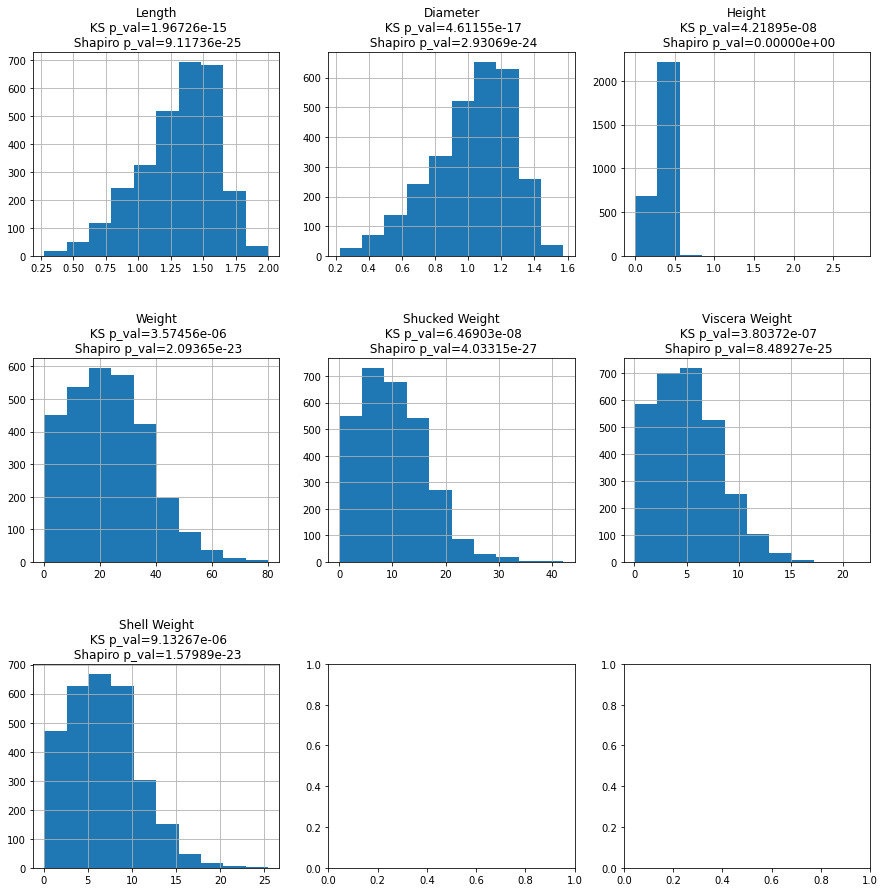

In [136]:
plot_numerical_histograms(crab_train_X, crab_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: Length
Correction: Diameter
Correction: Height
Correction: Weight
Correction: Shucked Weight
Correction: Viscera Weight
Correction: Shell Weight


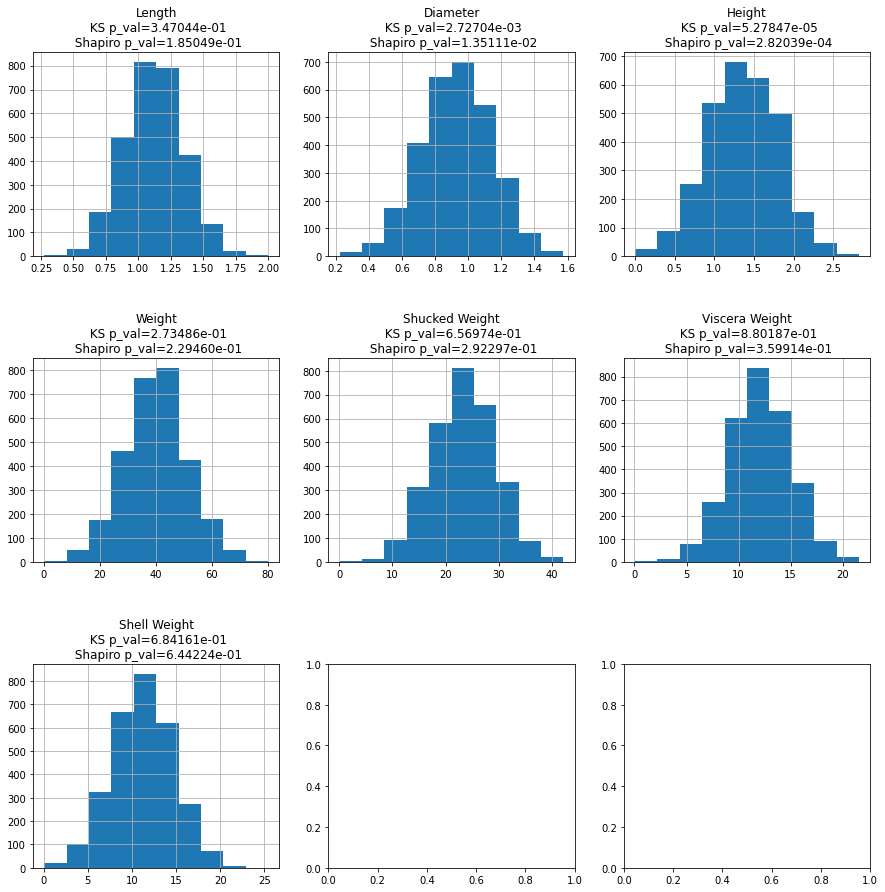

In [137]:
matched_crab_train_df_X, matched_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution,\
                                                                                    correction=correction_func)

matched_crab_train_df_X_not, matched_crab_train_df_X_normal_mapping_not = transform_dataset(crab_train_X[crab_numeric_columns],\
                                                                                    match_to_normal_distribution)
plot_numerical_histograms(matched_crab_train_df_X, crab_numeric_columns)

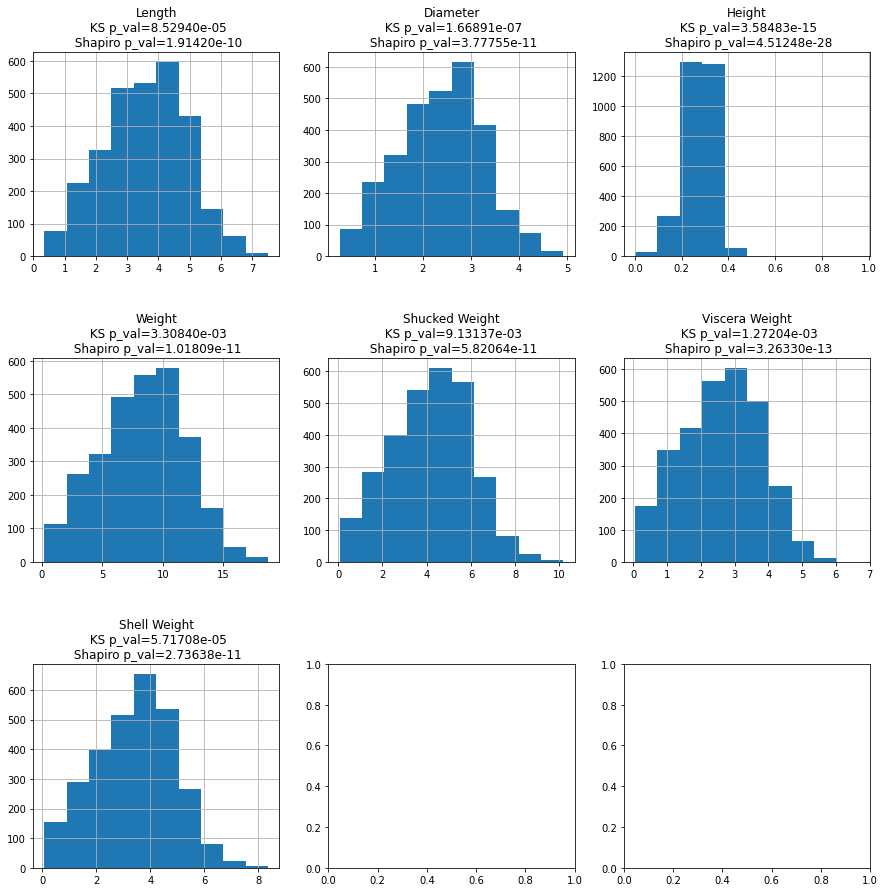

In [138]:
yeo_crab_train_df_X, yeo_crab_train_df_X_normal_mapping = transform_dataset(crab_train_X[crab_numeric_columns], stats.yeojohnson)
plot_numerical_histograms(yeo_crab_train_df_X, crab_numeric_columns)

#### Match test set X

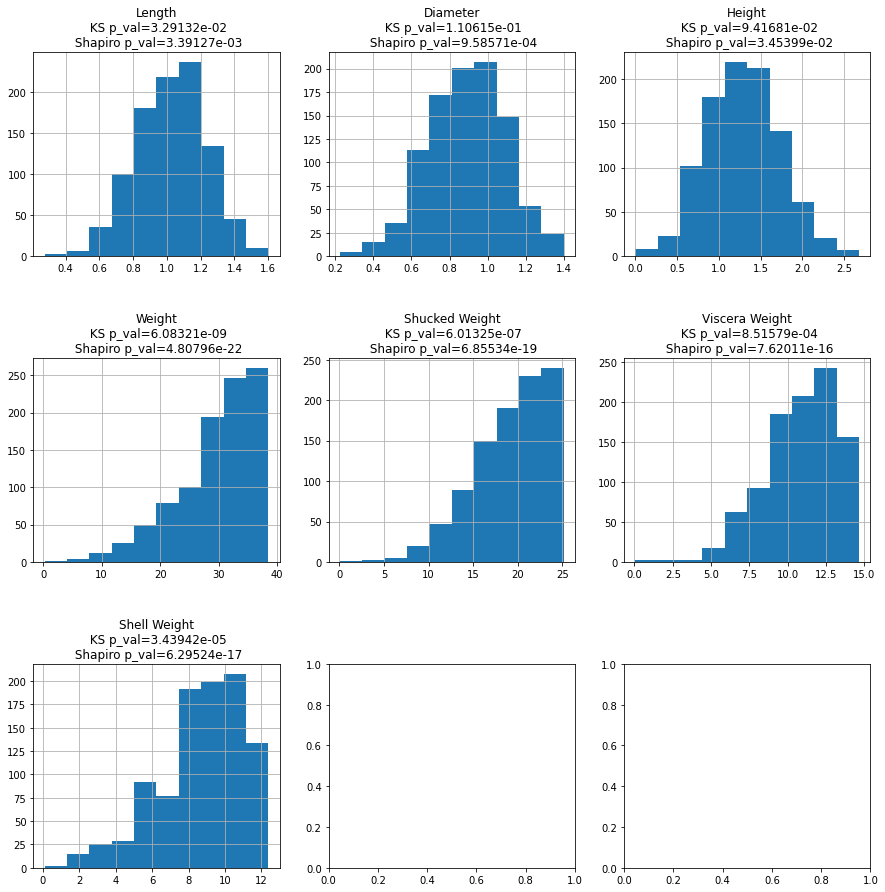

In [139]:
matched_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], match_to_normal_distribution, mapping=matched_crab_train_df_X_normal_mapping)
plot_numerical_histograms(matched_crab_test_df_X, crab_numeric_columns)

In [140]:
yeo_crab_test_df_X, _ = transform_dataset(crab_test_X[crab_numeric_columns], stats.yeojohnson, mapping=yeo_crab_train_df_X_normal_mapping)

#### Add the categorical columns to the train and the test

In [141]:
matched_crab_train_df_X = pd.concat([matched_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
matched_crab_test_df_X = pd.concat([matched_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

yeo_crab_train_df_X = pd.concat([yeo_crab_train_df_X, crab_train_X[crab_categorical_columns]], axis=1)
yeo_crab_test_df_X = pd.concat([yeo_crab_test_df_X, crab_test_X[crab_categorical_columns]], axis=1)

## QQ plots of features

### QQ plots for regular features

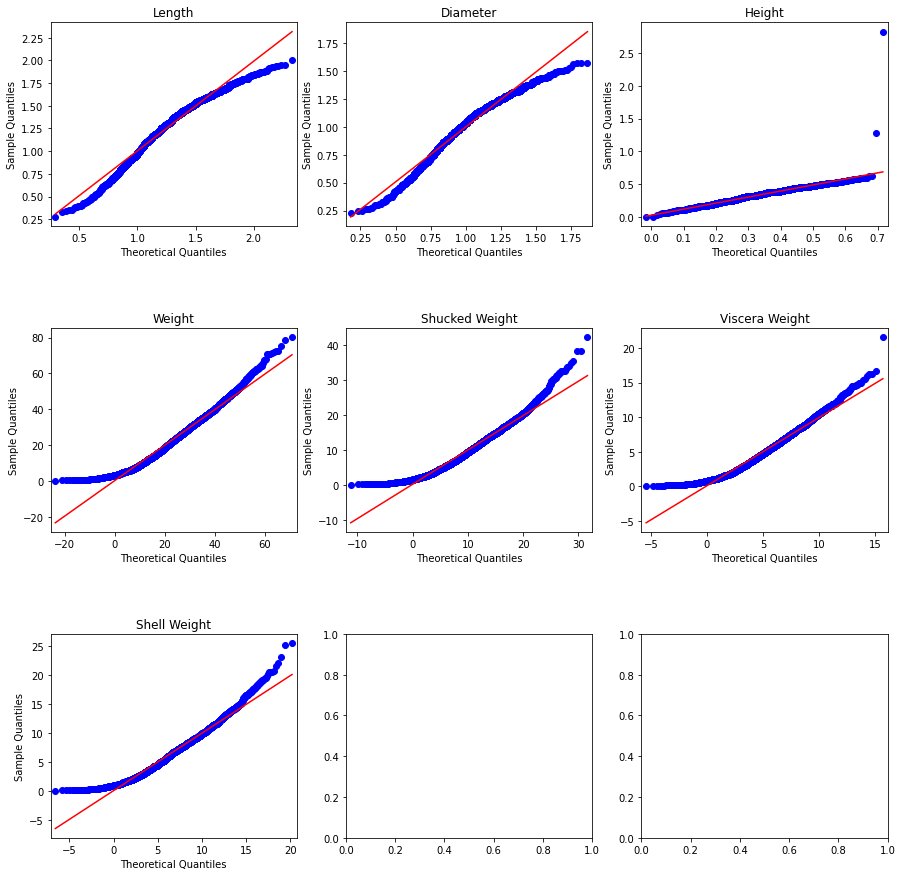

In [142]:
qq_plot_data(crab_train_X, crab_numeric_columns)

### QQ plots for Matched features

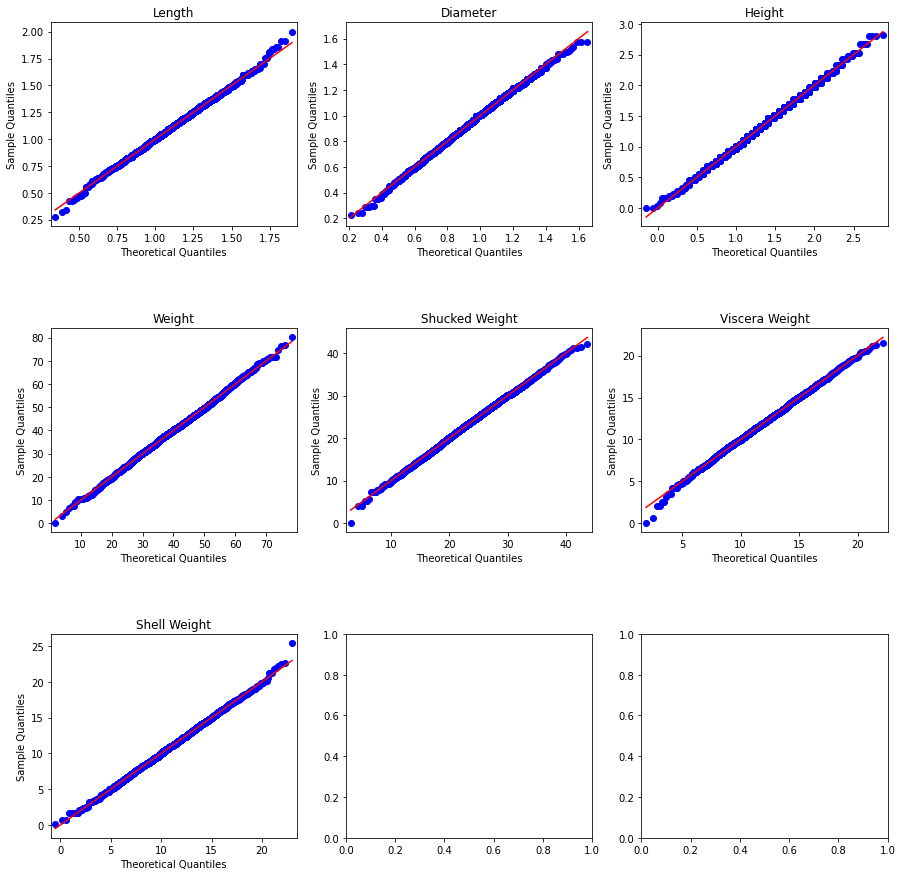

In [143]:
qq_plot_data(matched_crab_train_df_X, crab_numeric_columns)

### QQ plots for Yeo-Johnson features

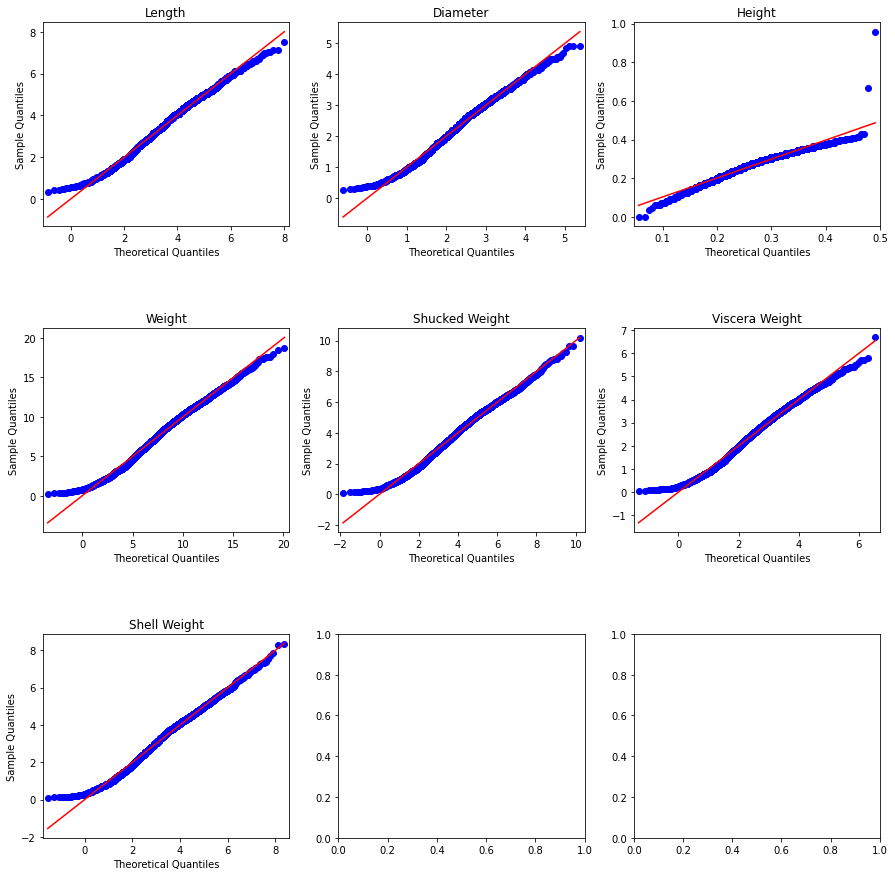

In [144]:
qq_plot_data(yeo_crab_train_df_X, crab_numeric_columns)

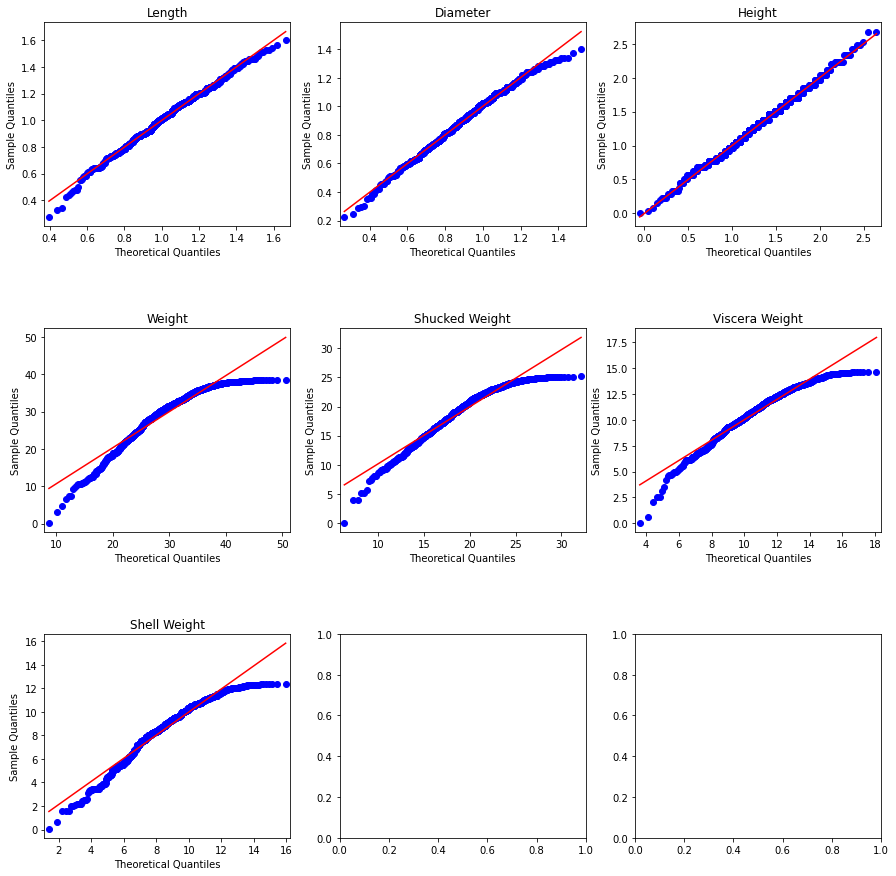

In [145]:
qq_plot_data(matched_crab_test_df_X, crab_numeric_columns)

## Compare model preformance

### Test on regular data

In [146]:
model = LinearRegression()
prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.5465839563487929
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.159
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on matched data

In [147]:
model = LinearRegression()
prediction = model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.15285916502181773
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.183
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 3


### Test on Yeo-Johnson data

In [148]:
model = LinearRegression()
prediction = model.fit(yeo_crab_train_df_X,crab_train_y).predict(yeo_crab_test_df_X)
print(f'r2={r2_score(crab_test_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(crab_test_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(crab_test_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(crab_test_y, prediction))))

r2=0.5529677321545758
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.159
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


## Try to normalize only 1 column at a time and Compare to regular model

In [149]:
compare_one_norm_column(crab_train_X, crab_test_X, crab_train_y, crab_test_y,\
                        matched_crab_train_df_X, matched_crab_test_df_X,\
                        yeo_crab_train_df_X, yeo_crab_test_df_X, 'Age', crab_numeric_columns)

=== Measure for regular model: ===
column=Age, r2=0.5465839563487929
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.159
Mean Absolute Error (Σ|y - pred|/n): 2
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2

=== Compare for column Length ===
column=Length, matched r2=0.5373259169868635
column=Length, yeo r2=0.5542293404674006

=== Compare for column Diameter ===
column=Diameter, matched r2=0.5382677236440963
column=Diameter, yeo r2=0.5380683373225233

=== Compare for column Height ===
column=Height, matched r2=0.5414795388917666
column=Height, yeo r2=0.5489764099350485

=== Compare for column Weight ===
column=Weight, matched r2=-0.7130677779444408
column=Weight, yeo r2=0.5506320955697493

=== Compare for column Shucked Weight ===
column=Shucked Weight, matched r2=0.02437089474121301
column=Shucked Weight, yeo r2=0.5128077358421549

=== Compare for column Viscera Weight ===
column=Viscera Weight, matched r2=0.5358517208835568
column=Viscera Weight, yeo r2=0.5376814124130231

=== Co

## Get insights about the data

In [150]:
crab_insights = get_insights(crab_train_X[crab_numeric_columns])
crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.275000,2.000000,1.312033,1.362500,0.299885,0.089931,-0.652330,0.086361,4.508471
Diameter,0.225000,1.575000,1.022264,1.062500,0.247670,0.061341,-0.615530,-0.028942,4.314633
Height,0.000000,2.825000,0.349974,0.350000,0.107743,0.011609,4.144941,96.421245,3.437815
Weight,0.226796,80.101512,23.606786,22.665425,13.953588,194.702615,0.547106,0.056036,7.488762
Shucked Weight,0.070874,42.184056,10.223787,9.624655,6.304930,39.752141,0.734926,0.684798,7.047295
Viscera Weight,0.056699,21.545620,5.143298,4.847764,3.113650,9.694818,0.589625,0.107322,6.533703
Shell Weight,0.085048,25.429502,6.806881,6.662132,3.946596,15.575618,0.600935,0.383998,6.042000


In [151]:
matched_crab_insights = get_insights(matched_crab_train_df_X[crab_numeric_columns])
matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.275000,2.000000,1.119881,1.120750,0.228696,0.052302,0.006623,0.091658,4.508471
Diameter,0.225000,1.575000,0.931911,0.937372,0.212147,0.045006,-0.098139,-0.088255,4.314633
Height,0.000000,2.825000,1.363143,1.335369,0.444668,0.197730,0.027559,-0.077453,3.437815
Weight,0.226796,80.101512,40.067921,40.168844,11.264709,126.893670,0.005163,0.108672,7.488762
Shucked Weight,0.070874,42.184056,23.368630,23.502072,5.967177,35.607202,-0.072989,-0.051160,7.047295
Viscera Weight,0.056699,21.545620,12.037174,12.018146,2.977930,8.868068,-0.051244,0.111675,6.533703
Shell Weight,0.085048,25.429502,11.241275,11.218198,3.459684,11.969414,0.016254,-0.027535,6.042000


In [152]:
matched_not_crab_insights = get_insights(matched_crab_train_df_X_not[crab_numeric_columns])
matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.271348,2.386801,1.323254,1.323784,0.303247,0.091959,-0.094849,-0.078067,4.508471
Diameter,0.135527,1.829837,1.031963,1.029062,0.254272,0.064654,-0.005349,-0.086994,4.314633
Height,0.024040,0.687472,0.358370,0.349807,0.107727,0.011605,0.021355,-0.230876,3.437815
Weight,-24.722723,69.582001,23.307581,23.169603,13.937625,194.257377,0.008063,-0.062508,7.488762
Shucked Weight,-10.389588,34.745240,10.300336,10.395368,6.256853,39.148212,0.007129,-0.019794,7.047295
Viscera Weight,-5.816904,14.491787,5.124712,5.130742,3.072170,9.438231,-0.072749,-0.067403,6.533703
Shell Weight,-7.144238,20.351937,6.816032,6.873861,3.953340,15.628900,-0.012398,-0.045734,6.042000


In [153]:
yeo_crab_insights = get_insights(yeo_crab_train_df_X[crab_numeric_columns])
yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.348975,7.507486,3.575080,3.652905,1.306814,1.707763,-0.082491,-0.507598,4.508471
Diameter,0.275479,4.920567,2.387491,2.436968,0.881261,0.776621,-0.080086,-0.524630,4.314633
Height,-0.000000,0.958451,0.273545,0.277336,0.064135,0.004113,-0.083161,4.984773,3.437815
Weight,0.216382,18.686837,8.325518,8.575557,3.467317,12.022285,-0.089729,-0.506038,7.488762
Shucked Weight,0.069571,10.180164,4.173567,4.289016,1.777484,3.159449,-0.058228,-0.434456,7.047295
Viscera Weight,0.055825,6.679806,2.608430,2.670861,1.159895,1.345357,-0.058025,-0.607382,6.533703
Shell Weight,0.083328,8.355973,3.414501,3.554260,1.465761,2.148456,-0.054454,-0.418120,6.042000


In [154]:
crab_insights - matched_not_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.003652,-0.386801,-0.011221,0.038716,-0.003362,-0.002028,-0.557481,0.164428,0.0
Diameter,0.089473,-0.254837,-0.009699,0.033438,-0.006602,-0.003314,-0.610180,0.058052,0.0
Height,-0.024040,2.137528,-0.008396,0.000193,0.000016,0.000003,4.123587,96.652121,0.0
Weight,24.949519,10.519512,0.299205,-0.504177,0.015963,0.445238,0.539043,0.118544,0.0
Shucked Weight,10.460462,7.438816,-0.076549,-0.770713,0.048077,0.603929,0.727797,0.704592,0.0
Viscera Weight,5.873603,7.053833,0.018586,-0.282977,0.041480,0.256588,0.662374,0.174725,0.0
Shell Weight,7.229287,5.077565,-0.009151,-0.211729,-0.006745,-0.053281,0.613333,0.429732,0.0


In [155]:
crab_insights - matched_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,0.0,0.0,0.192152,0.241750,0.071190,0.037630,-0.658954,-0.005297,0.0
Diameter,0.0,0.0,0.090353,0.125128,0.035524,0.016334,-0.517391,0.059313,0.0
Height,0.0,0.0,-1.013168,-0.985369,-0.336925,-0.186121,4.117382,96.498698,0.0
Weight,0.0,0.0,-16.461135,-17.503419,2.688879,67.808945,0.541943,-0.052635,0.0
Shucked Weight,0.0,0.0,-13.144843,-13.877417,0.337753,4.144939,0.807915,0.735958,0.0
Viscera Weight,0.0,0.0,-6.893877,-7.170381,0.135720,0.826750,0.640869,-0.004353,0.0
Shell Weight,0.0,0.0,-4.434394,-4.556065,0.486912,3.606204,0.584681,0.411533,0.0


In [156]:
crab_insights - yeo_crab_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
Length,-0.073975,-5.507486,-2.263047,-2.290405,-1.006929,-1.617831,-0.569840,0.593959,0.0
Diameter,-0.050479,-3.345567,-1.365227,-1.374468,-0.633590,-0.715280,-0.535444,0.495688,0.0
Height,0.000000,1.866549,0.076430,0.072664,0.043608,0.007495,4.228102,91.436472,0.0
Weight,0.010414,61.414676,15.281268,14.089868,10.486271,182.680330,0.636835,0.562074,0.0
Shucked Weight,0.001303,32.003892,6.050220,5.335639,4.527446,36.592692,0.793154,1.119254,0.0
Viscera Weight,0.000874,14.865814,2.534867,2.176903,1.953755,8.349462,0.647650,0.714704,0.0
Shell Weight,0.001721,17.073528,3.392381,3.107873,2.480835,13.427162,0.655389,0.802118,0.0


## Plot distributions

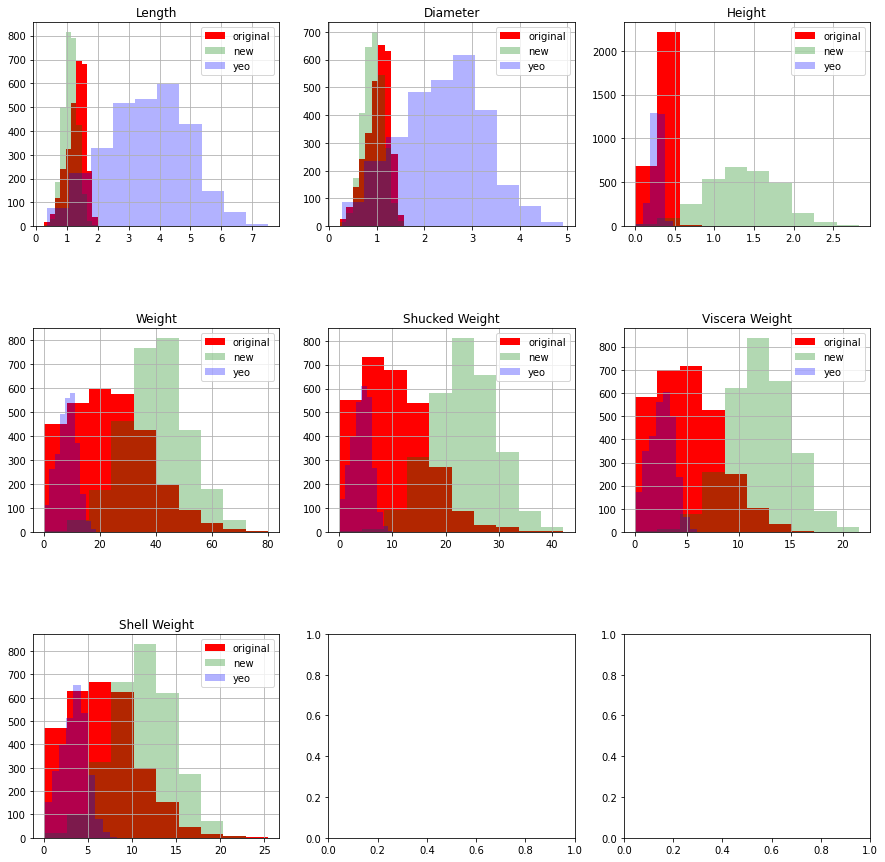

In [157]:
plot_histograms(crab_train_X[crab_numeric_columns], 
                matched_crab_train_df_X[crab_numeric_columns], 
                yeo_crab_train_df_X[crab_numeric_columns])

## Plot a Heatmap of all columns to targets

In [158]:
matched_crab_df_corr = pd.concat([matched_crab_train_df_X, crab_train_y], axis=1)
yeo_crab_df_corr = pd.concat([yeo_crab_train_df_X, crab_train_y], axis=1)

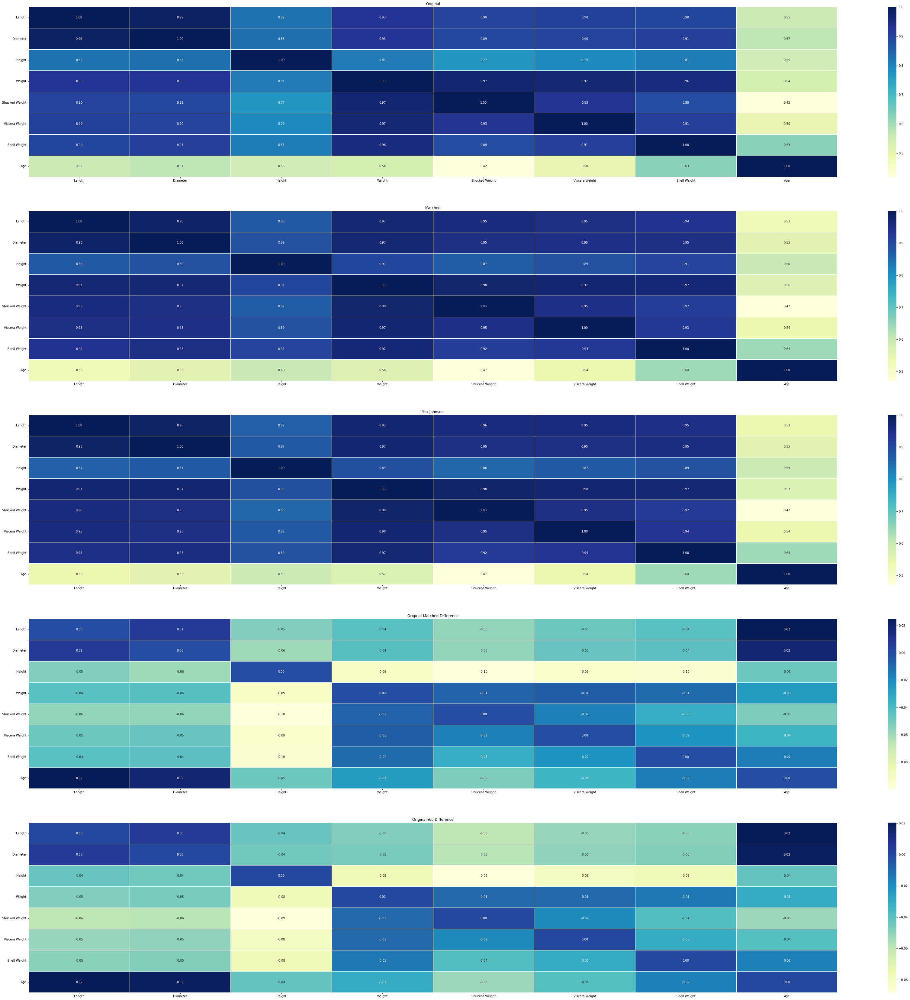

In [159]:
plot_correlation_heatmaps(crab_df, matched_crab_df_corr, yeo_crab_df_corr, crab_numeric_columns + ['Age'])

In [160]:
for column in crab_train_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_crab_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_crab_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: Age ===============
matched corr sum: 4.926486821944466
yeo corr sum: 4.931817045651666


In [161]:
crab_diff_corr_df = pd.concat([
           matched_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_crab_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

crab_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
Length,7.233620,7.246628
Diameter,7.277534,7.275584
Height,6.971528,6.876153
Weight,7.343844,7.347746
Shucked Weight,7.093895,7.096378
Viscera Weight,7.201520,7.206504
Shell Weight,7.282227,7.286599
Sex,1.216164,1.211427
Age,4.926487,4.931817


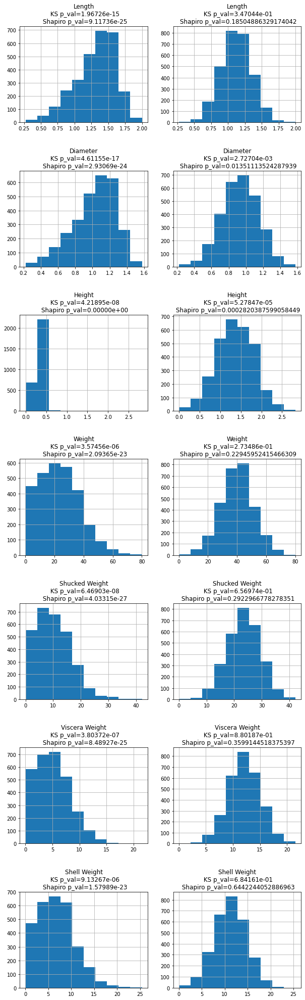

In [162]:
plot_histograms_side_by_side(crab_train_X[crab_numeric_columns], matched_crab_train_df_X[crab_numeric_columns])

## Plot waterfall of each model

Plot for regular model

In [163]:
# print(f'Plot for column: Age')
# model = LinearRegression()
# prediction = model.fit(crab_train_X,crab_train_y).predict(crab_test_X)
# plot_waterfall_coeficients(crab_train_X, crab_test_X, crab_test_y, prediction, model)

Plot for normalized model

In [164]:
# print(f'Plot for column: Age')
# matched_model = LinearRegression()
# matched_prediction = matched_model.fit(matched_crab_train_df_X,crab_train_y).predict(matched_crab_test_df_X)
# plot_waterfall_coeficients(matched_crab_train_df_X, matched_crab_test_df_X, crab_test_y, matched_prediction, matched_model)

Plot for Yeo-Johnson model

In [165]:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_measures_train_df_X, yeo_measures_test_df_X, measures_test_df_y[column], yeo_prediction, yeo_model)

# Try on fourth Dataset (Classification)

https://www.kaggle.com/jsphyg/weather-dataset-rattle-package

## Preprocess Dataset

In [166]:
!if [ ! -f datasets/weatherAUS.csv ]; then kaggle datasets download --unzip -d jsphyg/weather-dataset-rattle-package -p datasets/; fi;

 78%|█████████████████████████████▋        | 3.00M/3.83M [00:00<00:00, 4.25MB/s]
100%|██████████████████████████████████████| 3.83M/3.83M [00:00<00:00, 4.41MB/s]


In [167]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/weatherAUS.csv.zip' -d './weatherAUS.csv.zip'

In [168]:
# !unzip -n ./weather-dataset-rattle-package.zip -d .
# !rm -rf ./weather-dataset-rattle-package.zip

In [169]:
# !unzip -n ./weatherAUS.csv.zip -d .
# !rm -rf ./weatherAUS.csv.zip

In [170]:
aus_df = pd.read_csv('./datasets/weatherAUS.csv')

In [171]:
aus_df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [172]:
aus_df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [173]:
print('Shape before droping N/A labels:', aus_df.shape)

Shape before droping N/A labels: (145460, 23)


In [174]:
aus_df = aus_df[aus_df['RainToday'].notna()]
aus_df = aus_df[aus_df['RainTomorrow'].notna()]

print('Shape after droping N/A labels:', aus_df.shape)
aus_df.head()

Shape after droping N/A labels: (140787, 23)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [175]:
aus_df['RainToday'] = aus_df['RainToday'].astype('category')
aus_df['RainToday'] = aus_df['RainToday'].cat.codes
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].astype('category')
aus_df['RainTomorrow'] = aus_df['RainTomorrow'].cat.codes

#### Handle dates data in dataset: split into Year, Month, Day

In [176]:
aus_df[['DateYear', 'DateMonth', 'DateDay']] = aus_df['Date'].str.split('-', expand=True)

aus_df.drop('Date', axis=1, inplace=True)

aus_df.DateYear = aus_df.DateYear.astype('category')
aus_df.DateMonth = aus_df.DateMonth.astype('category')
aus_df.DateDay = aus_df.DateDay.astype('category')

aus_df.DateYear = aus_df.DateYear.cat.codes
aus_df.DateMonth = aus_df.DateMonth.cat.codes
aus_df.DateDay = aus_df.DateDay.cat.codes

In [177]:
aus_train_df, aus_test_df = train_test_split(aus_df, test_size=0.25)

print(aus_train_df.shape)
print(aus_test_df.shape)

(105590, 25)
(35197, 25)


In [178]:
aus_numeric_columns, aus_categorical_columns = get_numeric_categorical_columns(aus_train_df, ['RainToday', 'RainTomorrow'], threshold_prec=0.1)

column: Location, %: 0.046405909650535086
column: MinTemp, %: 0.6960886447580263
column: MaxTemp, %: 0.6866180509517946
column: Rainfall, %: 0.5975944691732172
column: Evaporation, %: 42.625248603087414
column: Sunshine, %: 47.467563216213655
column: WindGustDir, %: 0.016100009470593805
column: WindGustSpeed, %: 6.58585093285349
column: WindDir9am, %: 0.016100009470593805
column: WindDir3pm, %: 0.016100009470593805
column: WindSpeed9am, %: 0.8002651766265745
column: WindSpeed3pm, %: 1.842030495312056
column: Humidity9am, %: 1.1554124443602614
column: Humidity3pm, %: 2.576001515295009
column: Pressure9am, %: 10.20930012311772
column: Pressure3pm, %: 10.232029548252676
column: Cloud9am, %: 37.27341604318591
column: Cloud3pm, %: 39.7632351548442
column: Temp9am, %: 0.8542475613220949
column: Temp3pm, %: 2.323136660668624
column: DateYear, %: 0.010417653186854815
column: DateMonth, %: 0.01136471256747798
column: DateDay, %: 0.02935884079931812
numeric_columns = ['MinTemp', 'MaxTemp', 'Rain

In [179]:
print(aus_numeric_columns)
print(aus_categorical_columns)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm']
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'DateYear', 'DateMonth', 'DateDay']


#### Fill numerical and Categorical N/A values

In [180]:
aus_df.isna().sum() / len(aus_df) * 100

Location          0.000000
MinTemp           0.332417
MaxTemp           0.218060
Rainfall          0.000000
Evaporation      42.400222
Sunshine         47.451114
WindGustDir       6.508413
WindGustSpeed     6.467216
WindDir9am        6.861429
WindDir3pm        2.606775
WindSpeed9am      0.749359
WindSpeed3pm      1.797751
Humidity9am       1.077514
Humidity3pm       2.486735
Pressure9am       9.761555
Pressure3pm       9.780022
Cloud9am         37.379161
Cloud3pm         39.843167
Temp9am           0.465952
Temp3pm           1.863808
RainToday         0.000000
RainTomorrow      0.000000
DateYear          0.000000
DateMonth         0.000000
DateDay           0.000000
dtype: float64

In [181]:
for column in aus_numeric_columns:
    aus_train_df[column] = aus_train_df[column].fillna(aus_train_df[column].mean())

for column in aus_numeric_columns:
    aus_test_df[column] = aus_test_df[column].fillna(aus_test_df[column].mean())

In [182]:
for column in aus_categorical_columns:
    aus_train_df[column] = aus_train_df[column].fillna('UNKNOWN')
    aus_train_df[column] = aus_train_df[column].astype('category')
    aus_train_df[column] = aus_train_df[column].cat.codes

for column in aus_categorical_columns:
    aus_test_df[column] = aus_test_df[column].fillna('UNKNOWN')
    aus_test_df[column] = aus_test_df[column].astype('category')
    aus_test_df[column] = aus_test_df[column].cat.codes

Test for N/A values again

In [183]:
aus_train_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [184]:
aus_test_df.isna().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
DateYear         0
DateMonth        0
DateDay          0
dtype: int64

In [185]:
aus_test_df.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,DateYear,DateMonth,DateDay
62409,35,0.4,12.7,0.2,1.000000,8.600000,0,20.00000,7,0,...,1024.500000,2.000000,0.00000,4.4,12.600000,0,0,5,5,10
77357,33,12.2,29.4,0.0,7.200000,8.400000,15,54.00000,6,15,...,1019.100000,4.443268,5.00000,23.7,26.500000,0,0,8,9,2
111078,1,19.5,24.7,0.0,16.600000,7.800000,13,39.96789,14,13,...,1010.300000,8.000000,4.49286,20.5,21.681205,0,0,9,0,9
1657,2,2.4,15.4,0.0,5.478021,7.670216,14,46.00000,13,15,...,1014.800000,4.443268,4.49286,9.7,15.300000,0,0,6,8,11
126230,36,11.9,23.0,3.8,5.478021,7.670216,11,50.00000,0,11,...,1015.230932,4.443268,4.49286,17.0,19.700000,1,1,8,10,1


#### Extract Target Features

In [186]:
print(aus_train_df.columns)

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'DateYear', 'DateMonth',
       'DateDay'],
      dtype='object')


In [187]:
aus_train_df_X = aus_train_df.drop(['RainToday', 'RainTomorrow'], axis=1)
aus_test_df_X = aus_test_df.drop(['RainToday', 'RainTomorrow'], axis=1)

aus_train_df_y = aus_train_df[['RainToday', 'RainTomorrow']]
aus_test_df_y = aus_test_df[['RainToday', 'RainTomorrow']]

In [188]:
print('aus_train_df_X.shape ==',aus_train_df_X.shape)
print('aus_test_df_X.shape ==',aus_test_df_X.shape)
print('aus_train_df_y.shape ==',aus_train_df_y.shape)
print('aus_test_df_y.shape ==',aus_test_df_y.shape)

aus_train_df_X.shape == (105590, 23)
aus_test_df_X.shape == (35197, 23)
aus_train_df_y.shape == (105590, 2)
aus_test_df_y.shape == (35197, 2)


In [189]:
aus_train_df_X.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,DateYear,DateMonth,DateDay
97677,0,14.9,31.2,0.0,4.400000,7.617435,7,30.0,5,14,...,19.0,1018.6,1014.9,4.427155,4.501368,24.8,30.6,5,3,17
79475,44,9.0,20.9,2.4,2.800000,6.300000,7,35.0,6,6,...,48.0,1021.4,1018.7,3.000000,7.000000,13.3,19.3,6,3,24
1672,2,2.6,18.5,3.6,5.470692,7.617435,1,22.0,0,5,...,43.0,1020.8,1015.5,4.427155,4.501368,10.7,18.2,6,8,26
40809,45,7.0,18.9,0.4,1.200000,7.500000,15,20.0,7,5,...,46.0,1024.4,1020.2,8.000000,1.000000,8.6,18.4,5,6,24
78388,44,23.1,30.2,0.0,13.200000,0.700000,4,43.0,5,3,...,83.0,1009.1,1008.8,7.000000,8.000000,28.1,22.9,3,1,3


In [190]:
aus_train_numerical_df_X = aus_train_df_X.drop(aus_categorical_columns, axis=1)
aus_train_categorical_df_X = aus_train_df_X.drop(aus_numeric_columns, axis=1)

aus_test_numerical_df_X = aus_test_df_X.drop(aus_categorical_columns, axis=1)
aus_test_categorical_df_X = aus_test_df_X.drop(aus_numeric_columns, axis=1)

## Visualize histograms of features

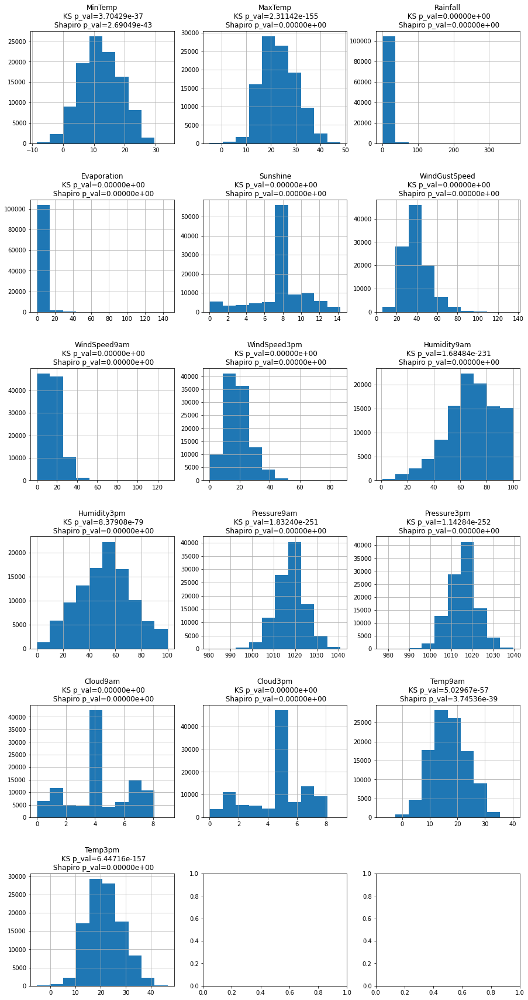

In [191]:
plot_numerical_histograms(aus_train_df_X, aus_numeric_columns)

### Compare Histogram-Matching to Yeo-Johnson

Correction: MinTemp
Correction: MaxTemp
Correction: Rainfall
Correction: Evaporation
Correction: Sunshine
Correction: WindGustSpeed
Correction: WindSpeed9am
Correction: WindSpeed3pm
Correction: Humidity9am
Correction: Humidity3pm
Correction: Pressure9am
Correction: Pressure3pm
Correction: Cloud9am
Correction: Cloud3pm
Correction: Temp9am
Correction: Temp3pm


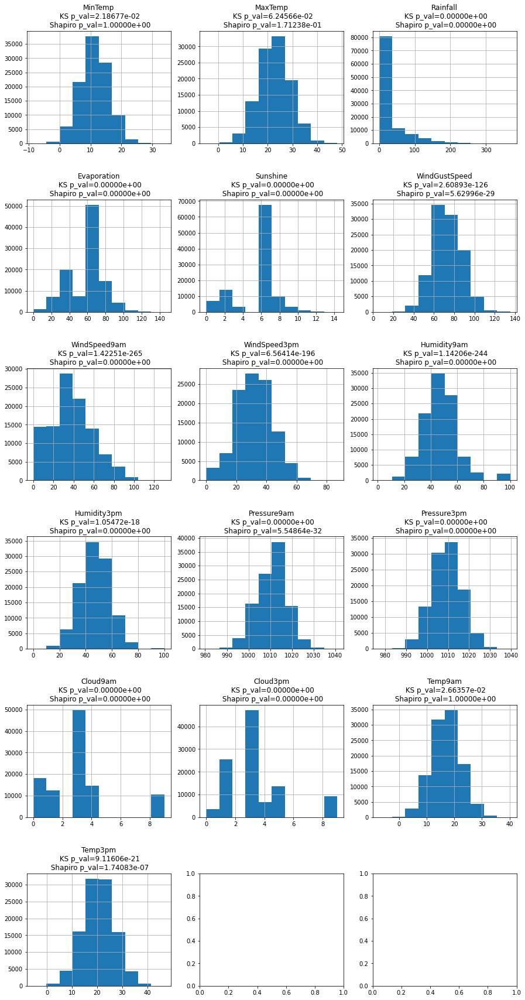

In [192]:
matched_aus_train_df_X, train_df_X_normal_mapping = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution,\
                                                                      correction=correction_func)

matched_aus_train_df_X_not, train_df_X_normal_mapping_not = transform_dataset(aus_train_numerical_df_X,\
                                                                      match_to_normal_distribution)

plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

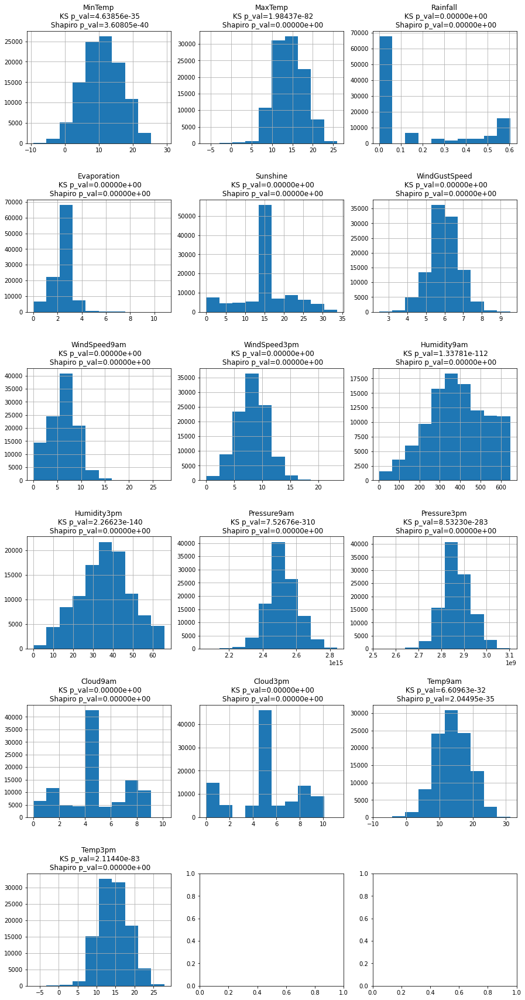

In [193]:
yeo_aus_train_df_X, train_df_X_yeo_mapping = transform_dataset(aus_train_numerical_df_X, stats.yeojohnson)
plot_numerical_histograms(yeo_aus_train_df_X, aus_numeric_columns)

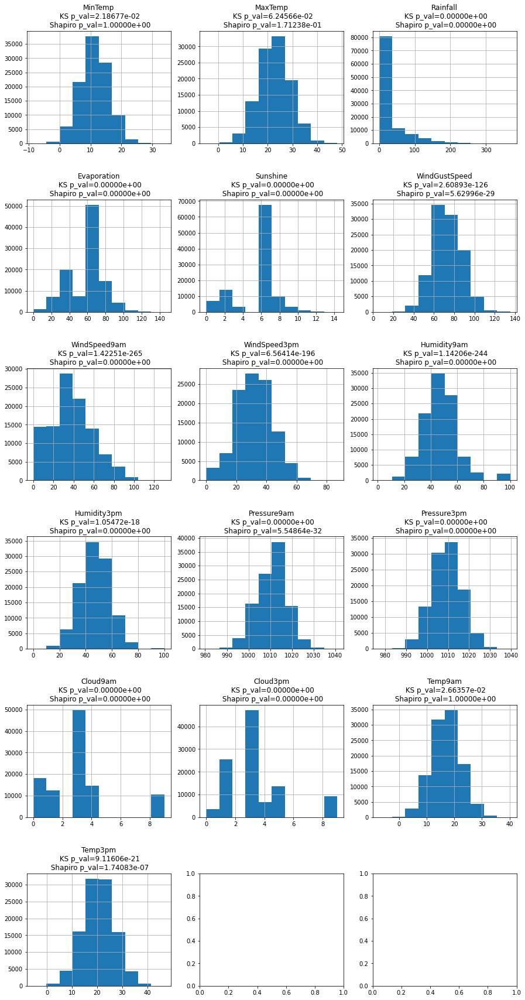

In [194]:
matched_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_aus_train_df_X, aus_numeric_columns)

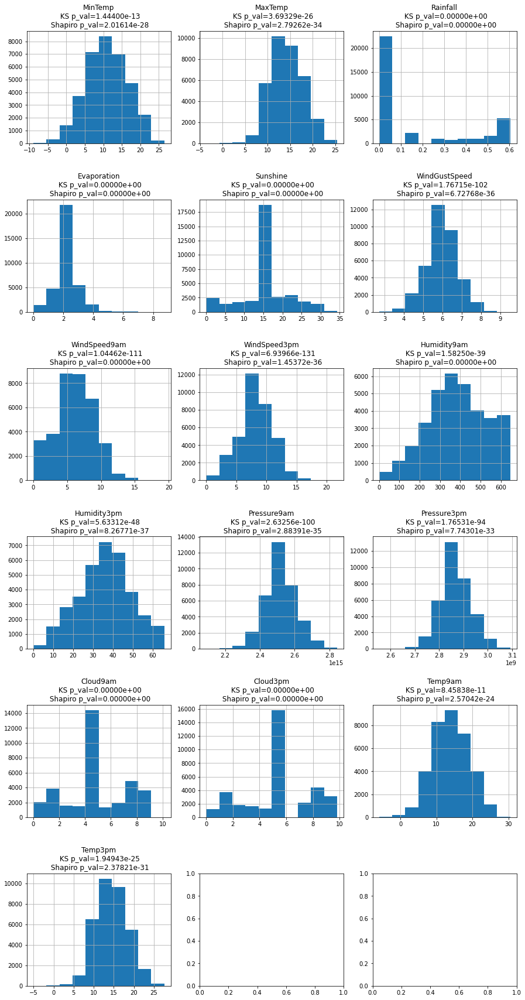

In [195]:
yeo_aus_test_df_X, _ = transform_dataset(aus_test_numerical_df_X, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_aus_test_df_X, aus_numeric_columns)

## QQ plots of features

### QQ plots for regular features

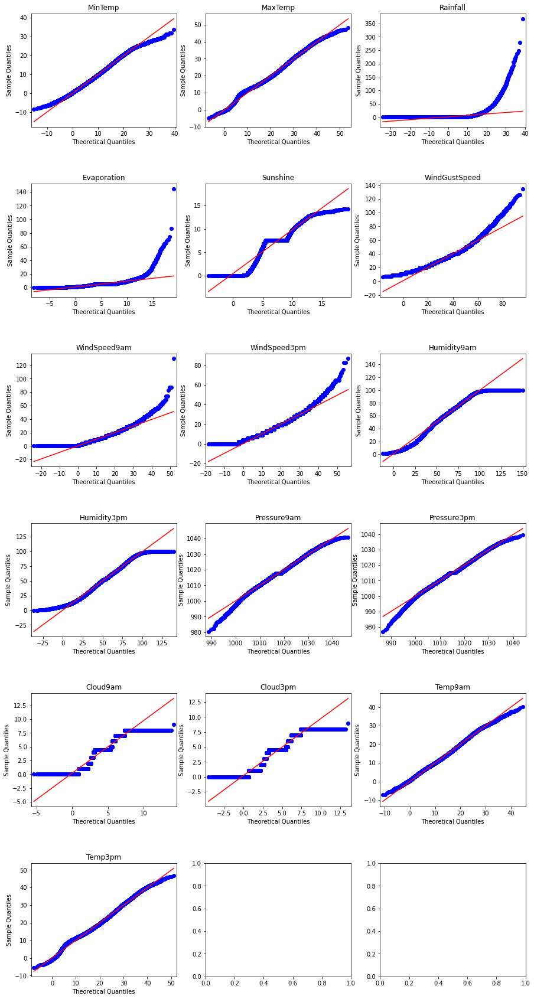

In [196]:
qq_plot_data(aus_train_df_X, aus_numeric_columns)

### QQ plots for Matched features

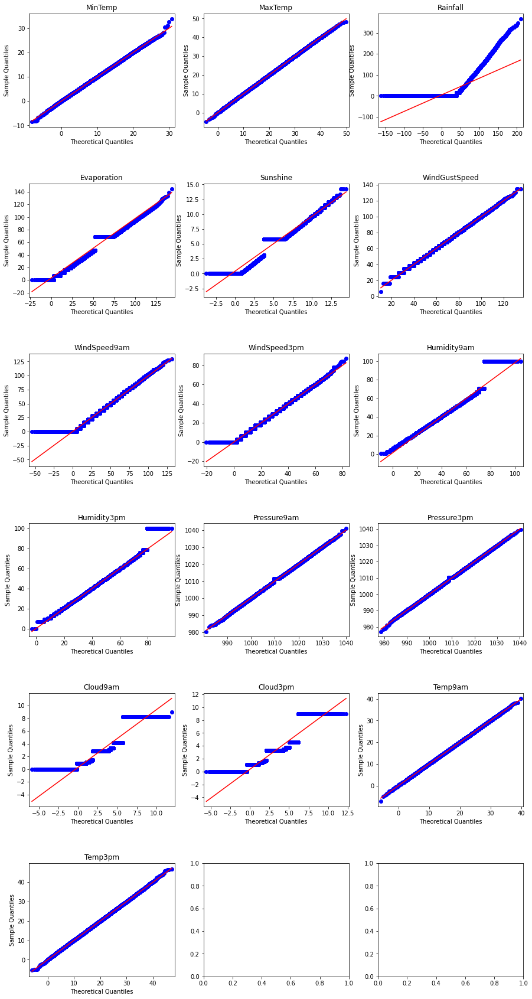

In [197]:
qq_plot_data(matched_aus_train_df_X, aus_numeric_columns)

### QQ plots for Yeo-Johnson features

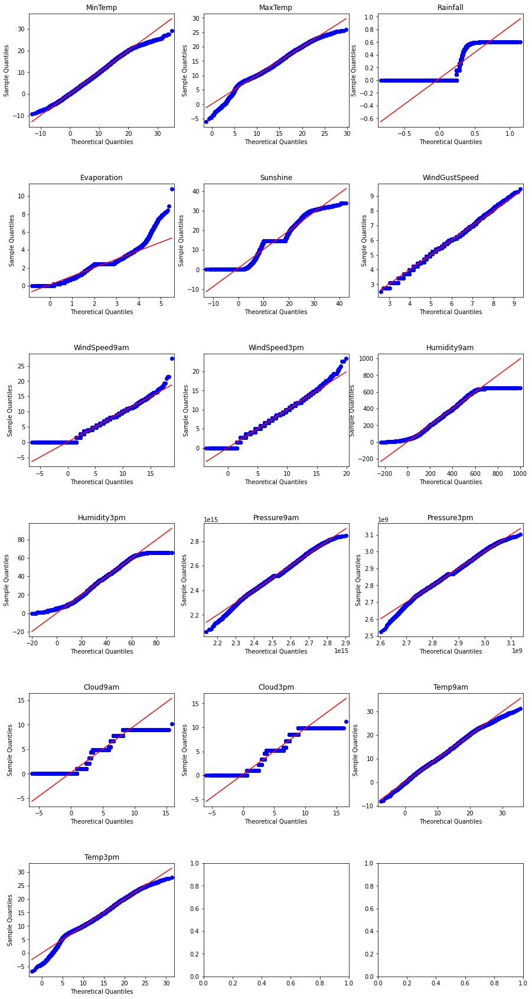

In [198]:
qq_plot_data(yeo_aus_train_df_X, aus_numeric_columns)

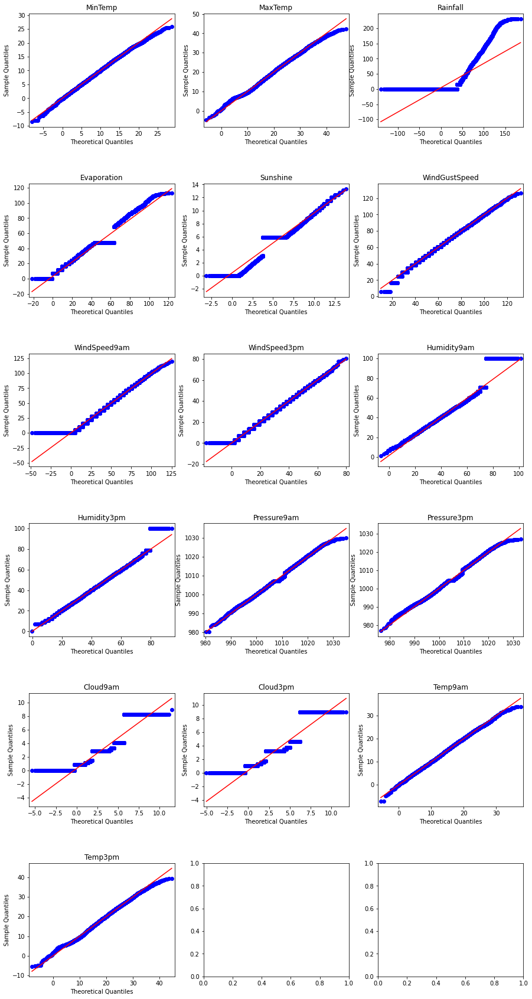

In [199]:
qq_plot_data(matched_aus_test_df_X, aus_numeric_columns)

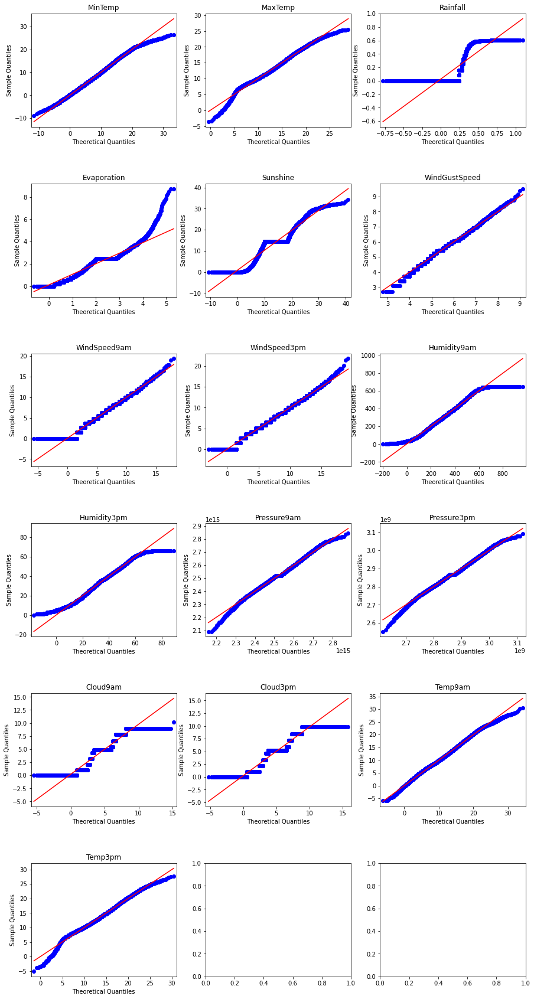

In [200]:
qq_plot_data(yeo_aus_test_df_X, aus_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [201]:
aus_train_df_X = pd.concat([aus_train_numerical_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([aus_test_numerical_df_X, aus_test_categorical_df_X], axis=1)

In [202]:
matched_aus_train_df_X = pd.concat([matched_aus_train_df_X, aus_train_categorical_df_X], axis=1)

matched_aus_test_df_X = pd.concat([matched_aus_test_df_X, aus_test_categorical_df_X], axis=1)

In [203]:
aus_train_df_X = pd.concat([yeo_aus_train_df_X, aus_train_categorical_df_X], axis=1)

aus_test_df_X = pd.concat([yeo_aus_test_df_X, aus_test_categorical_df_X], axis=1)

### Test on regular data

In [204]:
for column in aus_test_df_y:
    model = LogisticRegression()
    prediction = model.fit(aus_train_df_X,aus_train_df_y[column]).predict(aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column],prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], prediction))))
    print('=' * 50)

column=RainToday, acc=0.7751228797908912
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.7751797028155809
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [205]:
for column in aus_test_df_y:
    matched_model = LogisticRegression()
    matched_prediction = matched_model.fit(matched_aus_train_df_X,aus_train_df_y[column]).predict(matched_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], matched_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],matched_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], matched_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], matched_prediction))))
    print('=' * 50)

column=RainToday, acc=0.9999431769753104
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.8401284200357985
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 174,913,222,451,216.656
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [206]:
for column in aus_test_df_y:
    yeo_model = LogisticRegression()
    yeo_prediction = yeo_model.fit(yeo_aus_train_df_X,aus_train_df_y[column]).predict(yeo_aus_test_df_X)
    print(f'column={column}, acc={accuracy_score(aus_test_df_y[column], yeo_prediction)}')
    print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(aus_test_df_y[column],yeo_prediction)))
    print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(aus_test_df_y[column], yeo_prediction)))
    print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(aus_test_df_y[column], yeo_prediction))))
    print('=' * 50)

column=RainToday, acc=0.7751228797908912
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0
column=RainTomorrow, acc=0.7751797028155809
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [207]:
for column in aus_test_df_y:
    compare_one_norm_column(aus_train_df_X, aus_test_df_X, aus_train_df_y[column],\
                            aus_test_df_y[column], matched_aus_train_df_X, matched_aus_test_df_X,\
                            yeo_aus_train_df_X, yeo_aus_test_df_X, column, aus_numeric_columns, acc=True)

=== Measure for regular model: ===
column=RainToday, acc=0.7751228797908912
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.225
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column MinTemp ===
column=MinTemp, matched acc=0.7751228797908912
column=MinTemp, yeo acc=0.7751228797908912

=== Compare for column MaxTemp ===
column=MaxTemp, matched acc=0.7751228797908912
column=MaxTemp, yeo acc=0.7751228797908912

=== Compare for column Rainfall ===
column=Rainfall, matched acc=0.7751228797908912
column=Rainfall, yeo acc=0.7751228797908912

=== Compare for column Evaporation ===
column=Evaporation, matched acc=0.7751228797908912
column=Evaporation, yeo acc=0.7751228797908912

=== Compare for column Sunshine ===
column=Sunshine, matched acc=0.7751228797908912
column=Sunshine, yeo acc=0.7751228797908912

=== Compare for column WindGustSpeed ===
column=WindGustSpeed, matched acc=0.7751228797908912
column=WindGustSpeed, yeo acc=0.7751228

## Get insights about the data

In [208]:
aus_insights = get_insights(aus_train_df_X[aus_numeric_columns])
aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-9.256901e+00,2.924755e+01,1.095223e+01,1.087080e+01,5.586611e+00,3.121023e+01,-0.067672,-0.391371,5.568441
MaxTemp,-6.125271e+00,2.598525e+01,1.424757e+01,1.408844e+01,3.626319e+00,1.315019e+01,0.031455,-0.032772,5.659379
Rainfall,-0.000000e+00,6.040213e-01,1.571880e-01,0.000000e+00,2.325511e-01,5.408000e-02,1.007353,-0.754740,2.142601
Evaporation,0.000000e+00,1.083152e+01,2.334519e+00,2.451872e+00,7.378180e-01,5.443754e-01,0.112306,3.316329,3.119871
Sunshine,0.000000e+00,3.370538e+01,1.497436e+01,1.446024e+01,6.472055e+00,4.188749e+01,-0.050416,0.559227,3.235504
WindGustSpeed,2.492689e+00,9.513575e+00,5.958690e+00,5.993190e+00,7.856517e-01,6.172486e-01,0.012790,0.485398,3.374301
WindSpeed9am,0.000000e+00,2.737966e+01,6.164201e+00,6.238793e+00,2.955640e+00,8.735809e+00,-0.055537,-0.010630,2.918179
WindSpeed3pm,0.000000e+00,2.335668e+01,8.152131e+00,8.401608e+00,2.748181e+00,7.552499e+00,0.022444,0.271686,2.973708
Humidity9am,1.213247e+00,6.458162e+02,3.828727e+02,3.819213e+02,1.450853e+02,2.104974e+04,-0.111954,-0.572442,4.286824
Humidity3pm,0.000000e+00,6.593685e+01,3.611062e+01,3.643158e+01,1.313920e+01,1.726386e+02,-0.080451,-0.421696,4.430144


In [209]:
matched_aus_insights = get_insights(matched_aus_train_df_X[aus_numeric_columns])
matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-8.5,33.9,11.265607,11.245232,4.556280,20.759687,-0.005488,0.006306,5.568441
MaxTemp,-4.8,48.1,22.756067,22.771600,6.346254,40.274942,-0.002923,-0.012702,5.659379
Rainfall,0.0,367.6,23.824442,0.000000,43.438124,1886.870632,2.256873,5.477711,2.142601
Evaporation,0.0,145.0,60.168614,68.432131,19.476689,379.341425,-0.548794,-0.306981,3.119871
Sunshine,0.0,14.3,5.361600,5.841638,2.127705,4.527128,-0.711128,0.317069,3.235504
WindGustSpeed,6.0,135.0,72.927124,72.659811,14.543408,211.510726,0.008544,-0.009492,3.374301
WindSpeed9am,0.0,130.0,38.406946,37.927606,21.673855,469.755974,0.197174,-0.347311,2.918179
WindSpeed3pm,0.0,87.0,31.138075,29.913298,12.053624,145.289861,0.053020,-0.077251,2.973708
Humidity9am,1.0,100.0,47.391580,47.100039,13.356498,178.396027,0.964401,3.184010,4.286824
Humidity3pm,0.0,100.0,46.980988,46.809292,11.710885,137.144839,0.192105,0.718398,4.430144


In [210]:
matched_not_aus_insights = get_insights(matched_aus_train_df_X_not[aus_numeric_columns])
matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-15.041583,38.877414,12.277315,12.240757,6.384493,40.761751,0.006860,0.016694,5.568441
MaxTemp,-8.783531,54.985313,23.293938,23.318296,7.099084,50.396992,0.001964,0.016785,5.659379
Rainfall,5.399350,37.734729,7.559809,5.399350,3.927480,15.425095,2.218285,5.124368,2.142601
Evaporation,-3.948107,18.515605,6.302434,7.687943,3.267390,10.675840,-0.556741,-0.287811,3.119871
Sunshine,1.754088,20.968832,8.470041,9.073273,2.682920,7.198062,-0.692129,0.341227,3.235504
WindGustSpeed,-21.340136,91.549726,40.919619,40.731425,12.930974,167.210081,0.005331,-0.028235,3.374301
WindSpeed9am,0.285153,53.746967,15.104522,14.956852,8.371799,70.087015,0.207998,-0.309468,2.918179
WindSpeed3pm,-2.573394,56.417755,19.534223,18.672419,8.506300,72.357145,0.047323,-0.069056,2.973708
Humidity9am,-6.846543,157.301570,70.216358,69.699195,21.907281,479.928970,1.000527,3.335100,4.286824
Humidity3pm,-31.644237,150.486595,52.132065,51.839576,20.930096,438.068925,0.224902,0.891365,4.430144


In [211]:
yeo_aus_insights = get_insights(yeo_aus_train_df_X[aus_numeric_columns])
yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-9.256901e+00,2.924755e+01,1.095223e+01,1.087080e+01,5.586611e+00,3.121023e+01,-0.067672,-0.391371,5.568441
MaxTemp,-6.125271e+00,2.598525e+01,1.424757e+01,1.408844e+01,3.626319e+00,1.315019e+01,0.031455,-0.032772,5.659379
Rainfall,-0.000000e+00,6.040213e-01,1.571880e-01,0.000000e+00,2.325511e-01,5.408000e-02,1.007353,-0.754740,2.142601
Evaporation,0.000000e+00,1.083152e+01,2.334519e+00,2.451872e+00,7.378180e-01,5.443754e-01,0.112306,3.316329,3.119871
Sunshine,0.000000e+00,3.370538e+01,1.497436e+01,1.446024e+01,6.472055e+00,4.188749e+01,-0.050416,0.559227,3.235504
WindGustSpeed,2.492689e+00,9.513575e+00,5.958690e+00,5.993190e+00,7.856517e-01,6.172486e-01,0.012790,0.485398,3.374301
WindSpeed9am,0.000000e+00,2.737966e+01,6.164201e+00,6.238793e+00,2.955640e+00,8.735809e+00,-0.055537,-0.010630,2.918179
WindSpeed3pm,0.000000e+00,2.335668e+01,8.152131e+00,8.401608e+00,2.748181e+00,7.552499e+00,0.022444,0.271686,2.973708
Humidity9am,1.213247e+00,6.458162e+02,3.828727e+02,3.819213e+02,1.450853e+02,2.104974e+04,-0.111954,-0.572442,4.286824
Humidity3pm,0.000000e+00,6.593685e+01,3.611062e+01,3.643158e+01,1.313920e+01,1.726386e+02,-0.080451,-0.421696,4.430144


In [212]:
aus_insights - matched_not_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,5.784682e+00,-9.629866e+00,-1.325089e+00,-1.369958e+00,-7.978817e-01,-9.551526e+00,-0.074532,-0.408065,0.0
MaxTemp,2.658260e+00,-2.900007e+01,-9.046370e+00,-9.229861e+00,-3.472764e+00,-3.724680e+01,0.029491,-0.049557,0.0
Rainfall,-5.399350e+00,-3.713071e+01,-7.402621e+00,-5.399350e+00,-3.694928e+00,-1.537102e+01,-1.210931,-5.879108,0.0
Evaporation,3.948107e+00,-7.684088e+00,-3.967915e+00,-5.236071e+00,-2.529572e+00,-1.013146e+01,0.669047,3.604140,0.0
Sunshine,-1.754088e+00,1.273655e+01,6.504319e+00,5.386970e+00,3.789134e+00,3.468943e+01,0.641713,0.218000,0.0
WindGustSpeed,2.383282e+01,-8.203615e+01,-3.496093e+01,-3.473824e+01,-1.214532e+01,-1.665928e+02,0.007460,0.513634,0.0
WindSpeed9am,-2.851527e-01,-2.636731e+01,-8.940321e+00,-8.718058e+00,-5.416159e+00,-6.135121e+01,-0.263535,0.298838,0.0
WindSpeed3pm,2.573394e+00,-3.306108e+01,-1.138209e+01,-1.027081e+01,-5.758119e+00,-6.480465e+01,-0.024878,0.340742,0.0
Humidity9am,8.059791e+00,4.885146e+02,3.126563e+02,3.122221e+02,1.231780e+02,2.056981e+04,-1.112481,-3.907542,0.0
Humidity3pm,3.164424e+01,-8.454974e+01,-1.602145e+01,-1.540799e+01,-7.790896e+00,-2.654303e+02,-0.305353,-1.313061,0.0


In [213]:
aus_insights - matched_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,-7.569012e-01,-4.652452e+00,-3.133805e-01,-3.744338e-01,1.030331e+00,1.045054e+01,-0.062184,-0.397677,0.0
MaxTemp,-1.325271e+00,-2.211475e+01,-8.508498e+00,-8.683165e+00,-2.719935e+00,-2.712475e+01,0.034378,-0.020070,0.0
Rainfall,-0.000000e+00,-3.669960e+02,-2.366725e+01,0.000000e+00,-4.320557e+01,-1.886817e+03,-1.249520,-6.232451,0.0
Evaporation,0.000000e+00,-1.341685e+02,-5.783409e+01,-6.598026e+01,-1.873887e+01,-3.787970e+02,0.661100,3.623310,0.0
Sunshine,0.000000e+00,1.940538e+01,9.612760e+00,8.618605e+00,4.344350e+00,3.736036e+01,0.660712,0.242158,0.0
WindGustSpeed,-3.507311e+00,-1.254864e+02,-6.696843e+01,-6.666662e+01,-1.375776e+01,-2.108935e+02,0.004247,0.494890,0.0
WindSpeed9am,0.000000e+00,-1.026203e+02,-3.224274e+01,-3.168881e+01,-1.871821e+01,-4.610202e+02,-0.252711,0.336681,0.0
WindSpeed3pm,0.000000e+00,-6.364332e+01,-2.298594e+01,-2.151169e+01,-9.305443e+00,-1.377374e+02,-0.030575,0.348937,0.0
Humidity9am,2.132471e-01,5.458162e+02,3.354811e+02,3.348213e+02,1.317288e+02,2.087134e+04,-1.076355,-3.756452,0.0
Humidity3pm,0.000000e+00,-3.406315e+01,-1.087037e+01,-1.037771e+01,1.428315e+00,3.549375e+01,-0.272556,-1.140094,0.0


In [214]:
aus_insights - yeo_aus_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
MinTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
MaxTemp,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Rainfall,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Evaporation,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Sunshine,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindGustSpeed,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
WindSpeed3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity9am,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Humidity3pm,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Plot distributions

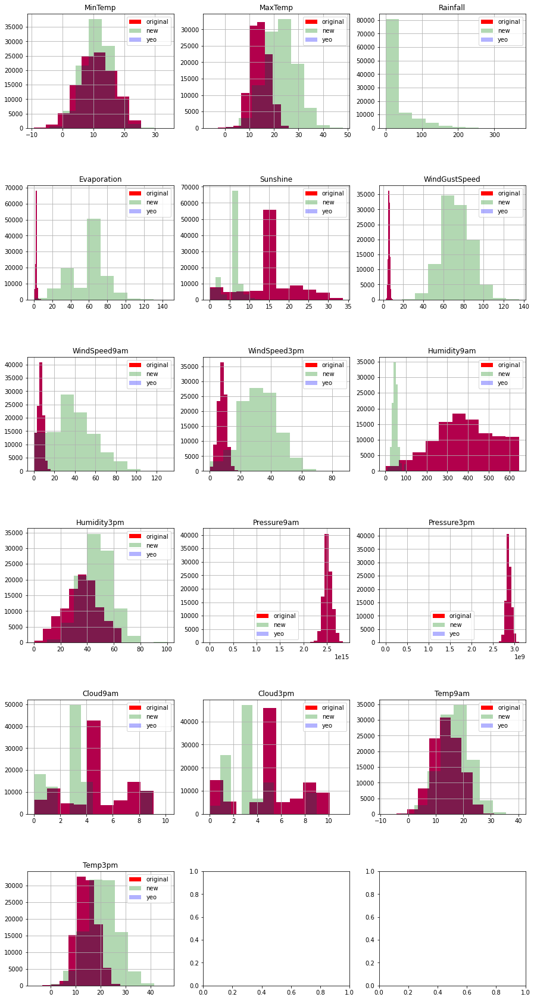

In [215]:
plot_histograms(aus_train_df_X[aus_numeric_columns], 
                matched_aus_train_df_X[aus_numeric_columns], 
                yeo_aus_train_df_X[aus_numeric_columns])

## Plot a Heatmap of all columns to targets

In [216]:
matched_aus_df_corr = pd.concat([matched_aus_train_df_X, aus_train_df_y], axis=1)
yeo_aus_df_corr = pd.concat([yeo_aus_train_df_X, aus_train_df_y], axis=1)

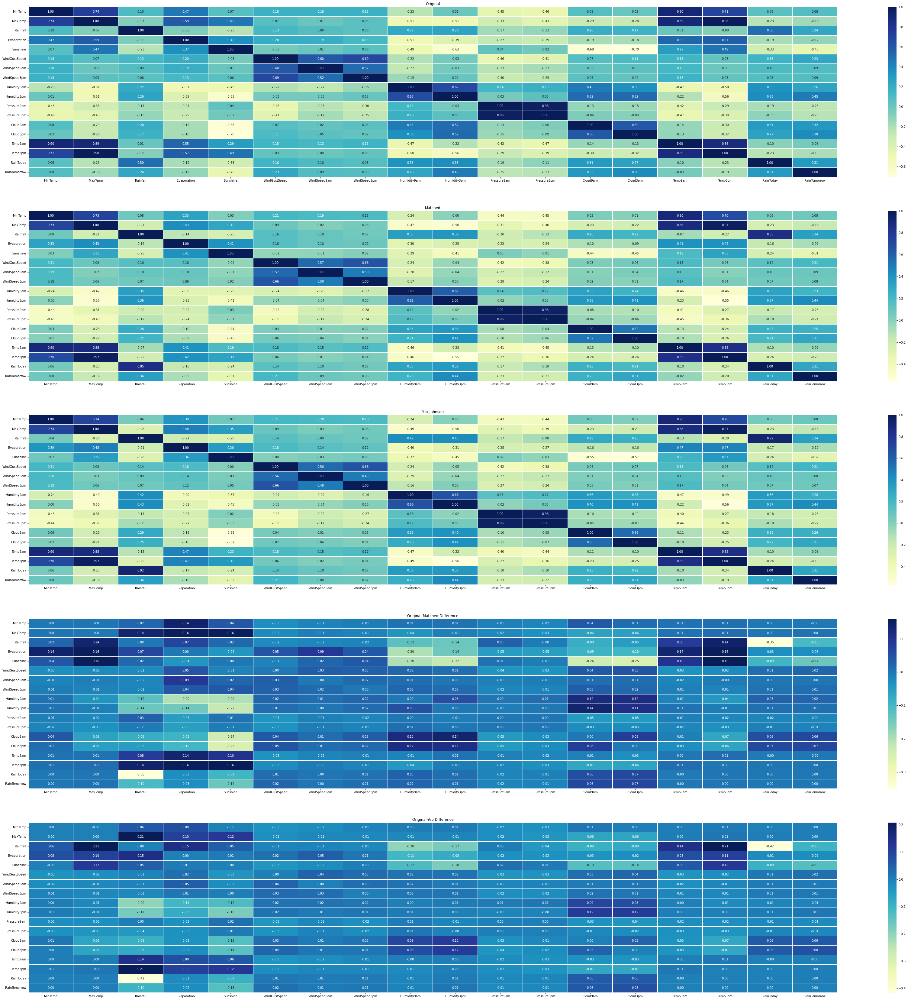

In [217]:
plot_correlation_heatmaps(aus_df, matched_aus_df_corr, yeo_aus_df_corr, aus_numeric_columns + ['RainToday', 'RainTomorrow'])

In [218]:
for column in aus_train_df_y.columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_aus_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_aus_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: RainToday ===============
matched corr sum: 5.35288146472819
yeo corr sum: 5.044213712799816
=============== Compare sum of corr for target column: RainTomorrow ===============
matched corr sum: 4.724627056632723
yeo corr sum: 4.613401593759395


In [219]:
aus_diff_corr_df = pd.concat([
           matched_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_aus_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')
    
aus_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
MinTemp,6.296389,5.750998
MaxTemp,8.111452,7.416467
Rainfall,5.460588,5.444991
Evaporation,5.309147,5.628044
Sunshine,4.992655,5.291012
WindGustSpeed,5.095967,4.632433
WindSpeed9am,3.930608,3.664145
WindSpeed3pm,3.982183,3.721709
Humidity9am,6.713765,6.802060
Humidity3pm,5.970506,5.919014


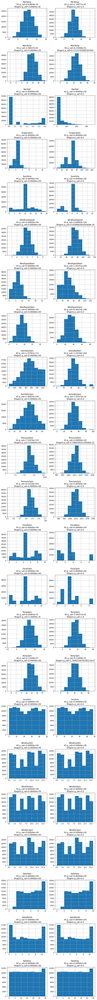

In [220]:
plot_histograms_side_by_side(aus_train_df_X, matched_aus_train_df_X)

## Plot waterfall of each model

### Plot for regular model

In [221]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     model = LogisticRegression()
#     prediction = model.fit(aus_train_df_X,aus_train_df_y[column]).predict(aus_test_df_X)
#     plot_waterfall_coeficients(aus_train_df_X, aus_test_df_X, aus_test_df_y[column], prediction, model, sample_size=1000)

### Plot for normalized model

In [222]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     matched_model = LogisticRegression()
#     matched_prediction = matched_model.fit(matched_aus_train_df_X,aus_train_df_y[column]).predict(matched_aus_test_df_X)
#     plot_waterfall_coeficients(matched_aus_train_df_X, matched_aus_test_df_X, aus_test_df_y, matched_prediction, matched_model, sample_size=1000)

### Plot for Yeo-Johnson model

In [223]:
# for column in aus_test_df_y:
#     print(f'Plot for column: {column}')
#     plot_waterfall_coeficients(yeo_aus_train_df_X, yeo_aus_test_df_X, aus_test_df_y, yeo_prediction, yeo_model, sample_size=1000)

# Try on Fifth Dataset (Classification)

https://www.kaggle.com/ruslankl/mice-protein-expression

In [224]:
!if [ ! -f datasets/Data_Cortex_Nuclear.csv ]; then kaggle datasets download --unzip -d ruslankl/mice-protein-expression -p datasets/; fi;

100%|████████████████████████████████████████| 423k/423k [00:00<00:00, 1.29MB/s]
100%|████████████████████████████████████████| 423k/423k [00:00<00:00, 1.29MB/s]


In [225]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/Data_Cortex_Nuclear.csv' -d './Data_Cortex_Nuclear.csv'

In [226]:
# !unzip -n mice-protein-expression.zip -d .
# !rm -rf ./mice-protein-expression.zip

In [227]:
mice_df = pd.read_csv('datasets/Data_Cortex_Nuclear.csv')

In [228]:
mice_df.describe()

,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,pELK_N,...,SHH_N,BAD_N,BCL2_N,pS6_N,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N
count,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,1077.000000,...,1080.000000,867.000000,795.000000,1080.000000,1005.000000,1080.000000,900.000000,870.000000,810.000000,1080.000000
mean,0.425810,0.617102,0.319088,2.297269,3.843934,0.233168,0.181846,3.537109,0.212574,1.428682,...,0.226676,0.157914,0.134762,0.121521,0.131053,0.446073,0.169609,0.183135,0.205440,1.337784
std,0.249362,0.251640,0.049383,0.347293,0.933100,0.041634,0.027042,1.295169,0.032587,0.466904,...,0.028989,0.029537,0.027417,0.014276,0.023863,0.066432,0.059402,0.040406,0.055514,0.317126
min,0.145327,0.245359,0.115181,1.330831,1.737540,0.063236,0.064043,1.343998,0.112812,0.429032,...,0.155869,0.088305,0.080657,0.067254,0.085419,0.258626,0.079691,0.105537,0.101787,0.586479
25%,0.288121,0.473361,0.287444,2.057411,3.155678,0.205755,0.164595,2.479834,0.190823,1.203665,...,0.206395,0.136424,0.115554,0.110839,0.113506,0.398082,0.125848,0.155121,0.165143,1.081423
50%,0.366378,0.565782,0.316564,2.296546,3.760855,0.231177,0.182302,3.326520,0.210594,1.355846,...,0.224000,0.152313,0.129468,0.121626,0.126523,0.448459,0.158240,0.174935,0.193994,1.317441
75%,0.487711,0.698032,0.348197,2.528481,4.440011,0.257261,0.197418,4.481940,0.234595,1.561316,...,0.241655,0.174017,0.148235,0.131955,0.143652,0.490773,0.197876,0.204542,0.235215,1.585824
max,2.516367,2.602662,0.497160,3.757641,8.482553,0.539050,0.317066,7.464070,0.306247,6.113347,...,0.358289,0.282016,0.261506,0.158748,0.256529,0.759588,0.479763,0.360692,0.413903,2.129791


In [229]:
mice_df.head()

,MouseID,DYRK1A_N,ITSN1_N,BDNF_N,NR1_N,NR2A_N,pAKT_N,pBRAF_N,pCAMKII_N,pCREB_N,...,pCFOS_N,SYP_N,H3AcK18_N,EGR1_N,H3MeK4_N,CaNA_N,Genotype,Treatment,Behavior,class
0,309_1,0.503644,0.747193,0.430175,2.816329,5.990152,0.218830,0.177565,2.373744,0.232224,...,0.108336,0.427099,0.114783,0.131790,0.128186,1.675652,Control,Memantine,C/S,c-CS-m
1,309_2,0.514617,0.689064,0.411770,2.789514,5.685038,0.211636,0.172817,2.292150,0.226972,...,0.104315,0.441581,0.111974,0.135103,0.131119,1.743610,Control,Memantine,C/S,c-CS-m
2,309_3,0.509183,0.730247,0.418309,2.687201,5.622059,0.209011,0.175722,2.283337,0.230247,...,0.106219,0.435777,0.111883,0.133362,0.127431,1.926427,Control,Memantine,C/S,c-CS-m
3,309_4,0.442107,0.617076,0.358626,2.466947,4.979503,0.222886,0.176463,2.152301,0.207004,...,0.111262,0.391691,0.130405,0.147444,0.146901,1.700563,Control,Memantine,C/S,c-CS-m
4,309_5,0.434940,0.617430,0.358802,2.365785,4.718679,0.213106,0.173627,2.134014,0.192158,...,0.110694,0.434154,0.118481,0.140314,0.148380,1.839730,Control,Memantine,C/S,c-CS-m


In [230]:
mice_df.shape

(1080, 82)

Remove Mouse ID column

In [231]:
mice_df.drop('MouseID', axis=1, inplace=True)

## Preprocess Dataset

In [232]:
mice_df.isna().sum()

DYRK1A_N     3
ITSN1_N      3
BDNF_N       3
NR1_N        3
NR2A_N       3
            ..
CaNA_N       0
Genotype     0
Treatment    0
Behavior     0
class        0
Length: 81, dtype: int64

In [233]:
mice_numeric_columns = mice_df.dtypes[(mice_df.dtypes=="float64") | (mice_df.dtypes=="int64")].index.tolist()
mice_categorical_columns = mice_df.dtypes[~((mice_df.dtypes=="float64") | (mice_df.dtypes=="int64"))].index.tolist()

print(mice_numeric_columns)
print(mice_categorical_columns)

['DYRK1A_N', 'ITSN1_N', 'BDNF_N', 'NR1_N', 'NR2A_N', 'pAKT_N', 'pBRAF_N', 'pCAMKII_N', 'pCREB_N', 'pELK_N', 'pERK_N', 'pJNK_N', 'PKCA_N', 'pMEK_N', 'pNR1_N', 'pNR2A_N', 'pNR2B_N', 'pPKCAB_N', 'pRSK_N', 'AKT_N', 'BRAF_N', 'CAMKII_N', 'CREB_N', 'ELK_N', 'ERK_N', 'GSK3B_N', 'JNK_N', 'MEK_N', 'TRKA_N', 'RSK_N', 'APP_N', 'Bcatenin_N', 'SOD1_N', 'MTOR_N', 'P38_N', 'pMTOR_N', 'DSCR1_N', 'AMPKA_N', 'NR2B_N', 'pNUMB_N', 'RAPTOR_N', 'TIAM1_N', 'pP70S6_N', 'NUMB_N', 'P70S6_N', 'pGSK3B_N', 'pPKCG_N', 'CDK5_N', 'S6_N', 'ADARB1_N', 'AcetylH3K9_N', 'RRP1_N', 'BAX_N', 'ARC_N', 'ERBB4_N', 'nNOS_N', 'Tau_N', 'GFAP_N', 'GluR3_N', 'GluR4_N', 'IL1B_N', 'P3525_N', 'pCASP9_N', 'PSD95_N', 'SNCA_N', 'Ubiquitin_N', 'pGSK3B_Tyr216_N', 'SHH_N', 'BAD_N', 'BCL2_N', 'pS6_N', 'pCFOS_N', 'SYP_N', 'H3AcK18_N', 'EGR1_N', 'H3MeK4_N', 'CaNA_N']
['Genotype', 'Treatment', 'Behavior', 'class']


In [234]:
for column in mice_categorical_columns:
    mice_df[column] = mice_df[column].astype('category')
    mice_df[column] = mice_df[column].cat.codes

# see changes to categroies numbers
mice_categorical_columns.remove('class')
mice_df[mice_categorical_columns].value_counts()

Genotype  Treatment  Behavior
0         0          1           150
                     0           150
1         1          1           135
          0          1           135
                     0           135
0         1          1           135
                     0           135
1         1          0           105
dtype: int64

### Split to Train and Test

In [235]:
mice_train_df, mice_test_df = train_test_split(mice_df, test_size=0.4)

### Deal with N/A in dataset

In [236]:
for column in mice_numeric_columns:
    mice_train_df[column] = mice_train_df[column].fillna(mice_train_df[column].mean())
    mice_test_df[column] = mice_test_df[column].fillna(mice_test_df[column].mean())

In [237]:
mice_train_df_X = mice_train_df.drop('class', axis=1)
mice_train_df_y = mice_train_df['class']

mice_test_df_X = mice_test_df.drop('class', axis=1)
mice_test_df_y = mice_test_df['class']

## Visualize Histogram of features

In [238]:
mice_train_df_X_numerical = mice_train_df_X[mice_numeric_columns]
mice_train_df_X_categorical = mice_train_df_X[mice_categorical_columns]

mice_test_df_X_numerical = mice_test_df_X[mice_numeric_columns]
mice_test_df_X_categorical = mice_test_df_X[mice_categorical_columns]

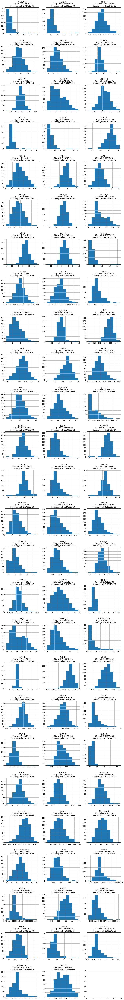

In [239]:
plot_numerical_histograms(mice_train_df, mice_numeric_columns)

Correction: DYRK1A_N
Correction: ITSN1_N
Correction: BDNF_N
Correction: NR1_N
Correction: NR2A_N
Correction: pAKT_N
Correction: pBRAF_N
Correction: pCAMKII_N
Correction: pCREB_N
Correction: pELK_N
Correction: pERK_N
Correction: pJNK_N
Correction: PKCA_N
Correction: pMEK_N
Correction: pNR1_N
Correction: pNR2A_N
Correction: pNR2B_N
Correction: pPKCAB_N
Correction: pRSK_N
Correction: AKT_N
Correction: BRAF_N
Correction: CAMKII_N
Correction: CREB_N
Correction: ELK_N
Correction: ERK_N
Correction: GSK3B_N
Correction: JNK_N
Correction: MEK_N
Correction: TRKA_N
Correction: RSK_N
Correction: APP_N
Correction: Bcatenin_N
Correction: SOD1_N
Correction: MTOR_N
Correction: P38_N
Correction: pMTOR_N
Correction: DSCR1_N
Correction: AMPKA_N
Correction: NR2B_N
Correction: pNUMB_N
Correction: RAPTOR_N
Correction: TIAM1_N
Correction: pP70S6_N
Correction: NUMB_N
Correction: P70S6_N
Correction: pGSK3B_N
Correction: pPKCG_N
Correction: CDK5_N
Correction: S6_N
Correction: ADARB1_N
Correction: AcetylH3K9_N
Co

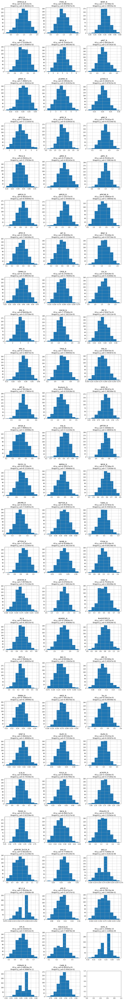

In [240]:
matched_mice_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mice_train_df_X_numerical,\
                                                                                 match_to_normal_distribution,\
                                                                                 correction=correction_func)
plot_numerical_histograms(matched_mice_train_df_X_numerical, mice_numeric_columns)

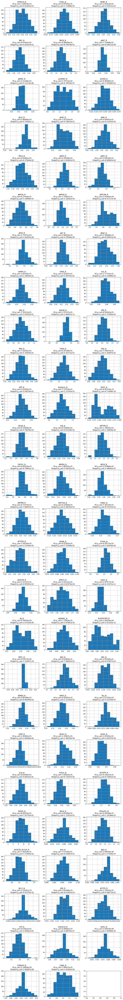

In [241]:
yeo_mice_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mice_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mice_train_df_X_numerical, mice_numeric_columns)

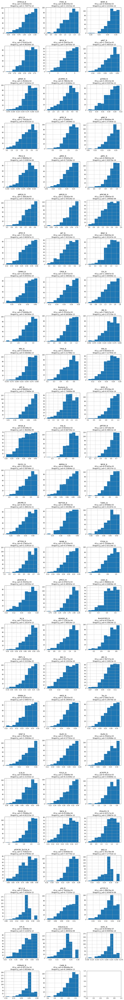

In [242]:
matched_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mice_test_df_X_numerical, mice_numeric_columns)

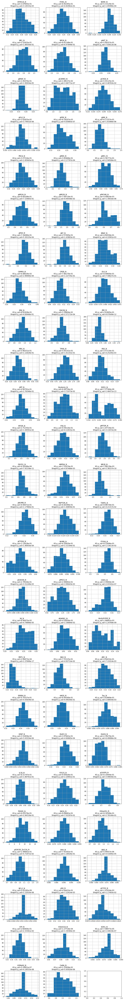

In [243]:
yeo_mice_test_df_X_numerical, _ = transform_dataset(mice_test_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## QQ plots of features

### QQ plots for regular features

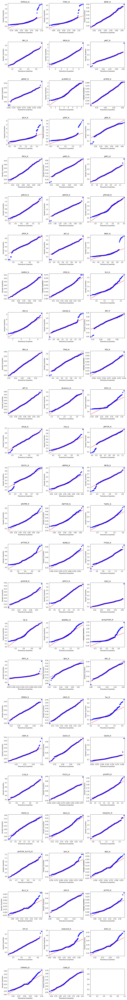

In [244]:
qq_plot_data(mice_train_df_X, mice_numeric_columns)

### QQ plots for Matched features

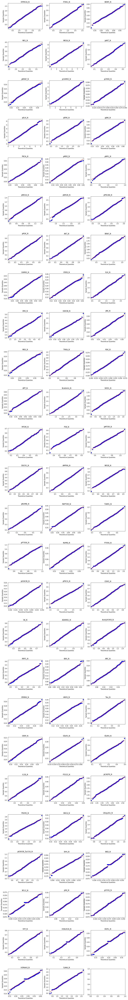

In [245]:
qq_plot_data(matched_mice_train_df_X_numerical, mice_numeric_columns)

### QQ plots for Yeo-Johnson features

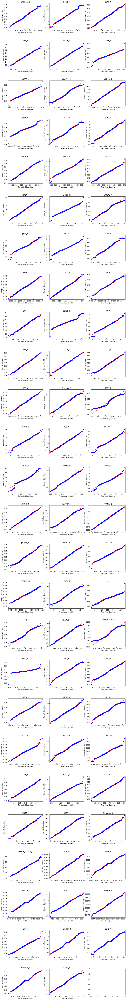

In [246]:
qq_plot_data(yeo_mice_train_df_X_numerical, mice_numeric_columns)

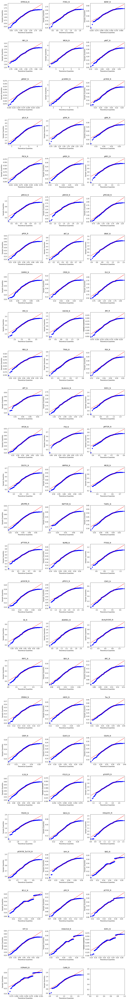

In [247]:
qq_plot_data(matched_mice_test_df_X_numerical, mice_numeric_columns)

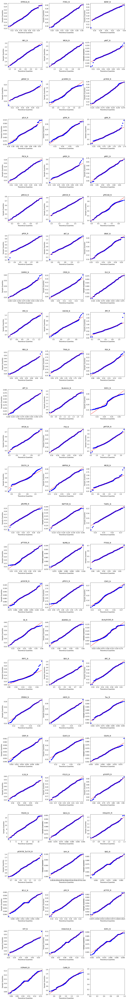

In [248]:
qq_plot_data(yeo_mice_test_df_X_numerical, mice_numeric_columns)

## Compare model preformance

#### Reassemble datasets

In [249]:
matched_mice_train_df_X = pd.concat([matched_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
matched_mice_test_df_X = pd.concat([matched_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

yeo_mice_train_df_X = pd.concat([yeo_mice_train_df_X_numerical, mice_train_df_X_categorical], axis=1)
yeo_mice_test_df_X = pd.concat([yeo_mice_test_df_X_numerical, mice_test_df_X_categorical], axis=1)

### Test on regular data

In [250]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mice_train_df_X,mice_train_df_y).predict(mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on matched data

In [251]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mice_train_df_X,mice_train_df_y).predict(matched_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, matched_prediction))))

acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


### Test on Yeo-Johnson data

In [252]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mice_train_df_X,mice_train_df_y).predict(yeo_mice_test_df_X)
print(f'acc={accuracy_score(mice_test_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mice_test_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mice_test_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mice_test_df_y, yeo_prediction))))

acc=0.9976851851851852
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.002
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0


## Try to normalize only 1 column at a time and Compare to regular model

In [253]:
 compare_one_norm_column(mice_train_df_X, mice_test_df_X, mice_train_df_y,\
                         mice_test_df_y, matched_mice_train_df_X, matched_mice_test_df_X,\
                         yeo_mice_train_df_X, yeo_mice_test_df_X,\
                         'class', mice_numeric_columns,acc=True)

=== Measure for regular model: ===
column=class, acc=1.0
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.000
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 0

=== Compare for column DYRK1A_N ===
column=DYRK1A_N, matched acc=1.0
column=DYRK1A_N, yeo acc=1.0

=== Compare for column ITSN1_N ===
column=ITSN1_N, matched acc=1.0
column=ITSN1_N, yeo acc=1.0

=== Compare for column BDNF_N ===
column=BDNF_N, matched acc=1.0
column=BDNF_N, yeo acc=1.0

=== Compare for column NR1_N ===
column=NR1_N, matched acc=1.0
column=NR1_N, yeo acc=1.0

=== Compare for column NR2A_N ===
column=NR2A_N, matched acc=1.0
column=NR2A_N, yeo acc=1.0

=== Compare for column pAKT_N ===
column=pAKT_N, matched acc=1.0
column=pAKT_N, yeo acc=1.0

=== Compare for column pBRAF_N ===
column=pBRAF_N, matched acc=1.0
column=pBRAF_N, yeo acc=1.0

=== Compare for column pCAMKII_N ===
column=pCAMKII_N, matched acc=1.0
column=pCAMKII_N, yeo acc=1.0

=== Compare for column pCREB_N ===
col

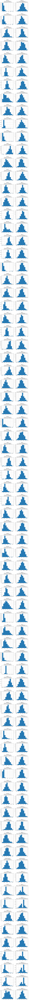

In [254]:
plot_histograms_side_by_side(mice_train_df_X[mice_numeric_columns], matched_mice_train_df_X[mice_numeric_columns])

## Plot waterfall of each model

In [255]:
# mice_train_df_X = mice_train_df_X.reset_index()
# mice_test_df_X = mice_test_df_X.reset_index()
# mice_test_df_y = mice_test_df_y.reset_index()

# mice_train_df_X.drop(['index'], inplace=True, axis=1)
# mice_test_df_X.drop(['index'], inplace=True, axis=1)
# mice_test_df_y.drop(['index'], inplace=True, axis=1)

In [256]:
# prediction = prediction.reshape(-1, 1)

### Plot for regular model

In [257]:
# plot_waterfall_coeficients(mice_train_df_X, mice_test_df_X, mice_test_df_y, prediction, model, sample_size=500)

### Plot for normalized model

In [258]:
# plot_waterfall_coeficients(matched_mice_train_df_X, matched_mice_test_df_X, mice_test_df_y, matched_prediction, matched_model, sample_size=500)

### Plot for Yeo-Johnson model

In [259]:
# plot_waterfall_coeficients(yeo_mice_train_df_X, yeo_mice_test_df_X, mice_test_df_y, yeo_prediction, yeo_model, sample_size=500)

# Try on Sixth Dataset (Classification)

https://www.kaggle.com/iabhishekofficial/mobile-price-classification

## Preprocess Dataset

In [260]:
!kaggle datasets download -d iabhishekofficial/mobile-price-classification

100%|███████████████████████████████████████| 70.6k/70.6k [00:00<00:00, 721kB/s]
100%|███████████████████████████████████████| 70.6k/70.6k [00:00<00:00, 719kB/s]


In [261]:
!if [ ! -f datasets/mobile_train.csv ]; then kaggle datasets download --unzip -d iabhishekofficial/mobile-price-classification -p datasets/; fi;

  0%|                                               | 0.00/70.6k [00:00<?, ?B/s]
100%|███████████████████████████████████████| 70.6k/70.6k [00:00<00:00, 730kB/s]


In [262]:
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/mobile_train.csv' -d './mobile_train.csv'
# !cp '/content/drive/MyDrive/Colab Notebooks/Tabular DS/mobile_test.csv' -d './mobile_test.csv'

In [263]:
# !unzip -n mobile-price-classification.zip -d .
# !rm -rf ./mobile-price-classification.zip

!mv ./datasets/train.csv ./datasets/mobile_train.csv
!mv ./datasets/test.csv ./datasets/mobile_test.csv

In [264]:
mobile_df = pd.read_csv('./datasets/mobile_train.csv')
mobile_test_df = pd.read_csv('./datasets/mobile_test.csv')

In [265]:
mobile_df.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [266]:
mobile_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [267]:
# mobile_numeric_columns = ['battery_power', 'clock_speed', 'int_memory', 'm_dep', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'fc', 'mobile_wt', 'pc']
# mobile_categorical_columns = ['blue', 'dual_sim', 'four_g', 'three_g', 'touch_screen', 'wifi', 'n_cores']

In [268]:
mobile_numeric_columns, mobile_categorical_columns = get_numeric_categorical_columns(mobile_df, ['price_range'], threshold_prec=5)

column: battery_power, %: 54.7
column: blue, %: 0.1
column: clock_speed, %: 1.3
column: dual_sim, %: 0.1
column: fc, %: 1.0
column: four_g, %: 0.1
column: int_memory, %: 3.15
column: m_dep, %: 0.5
column: mobile_wt, %: 6.05
column: n_cores, %: 0.4
column: pc, %: 1.05
column: px_height, %: 56.85
column: px_width, %: 55.45
column: ram, %: 78.10000000000001
column: sc_h, %: 0.75
column: sc_w, %: 0.95
column: talk_time, %: 0.95
column: three_g, %: 0.1
column: touch_screen, %: 0.1
column: wifi, %: 0.1
numeric_columns = ['battery_power', 'mobile_wt', 'px_height', 'px_width', 'ram']
categorical_columns = ['blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'n_cores', 'pc', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi']


In [269]:
mobile_train_df, mobile_val_df = train_test_split(mobile_df, test_size=0.15)

print(mobile_train_df.shape)
print(mobile_val_df.shape)

(1700, 21)
(300, 21)


In [270]:
mobile_train_df_X = mobile_train_df.drop(['price_range'], axis=1)
mobile_val_df_X = mobile_val_df.drop(['price_range'], axis=1)

mobile_train_df_y = mobile_train_df.price_range
mobile_val_df_y = mobile_val_df.price_range

## Visualize Histogram of features

In [271]:
mobile_train_df_X_categorical = mobile_train_df_X[mobile_categorical_columns]
mobile_val_df_X_categorical = mobile_val_df_X[mobile_categorical_columns]

In [272]:
mobile_train_df_X_numerical = mobile_train_df_X[mobile_numeric_columns]
mobile_val_df_X_numerical = mobile_val_df_X[mobile_numeric_columns]

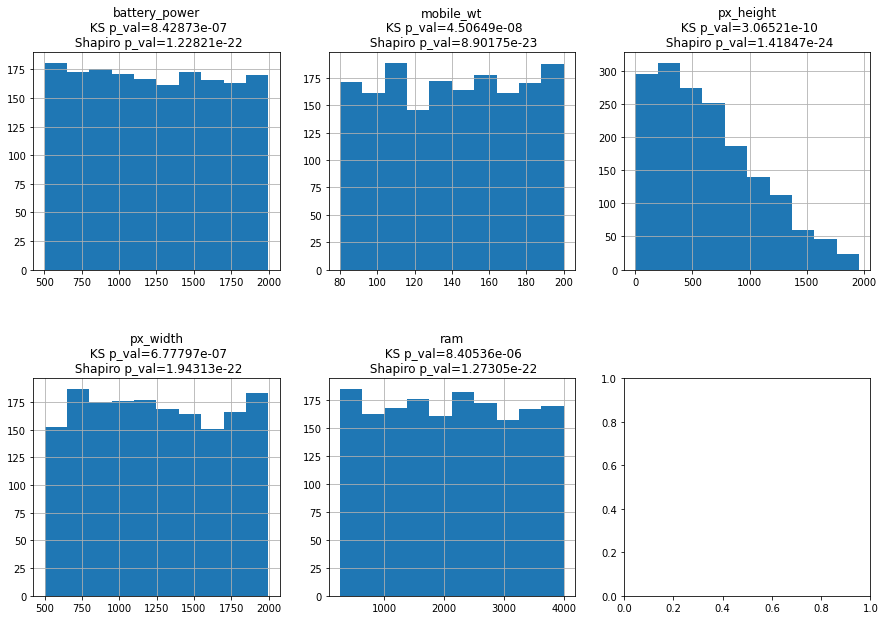

In [273]:
plot_numerical_histograms(mobile_train_df_X, mobile_numeric_columns)

Correction: battery_power
Correction: mobile_wt
Correction: px_height
Correction: px_width
Correction: ram


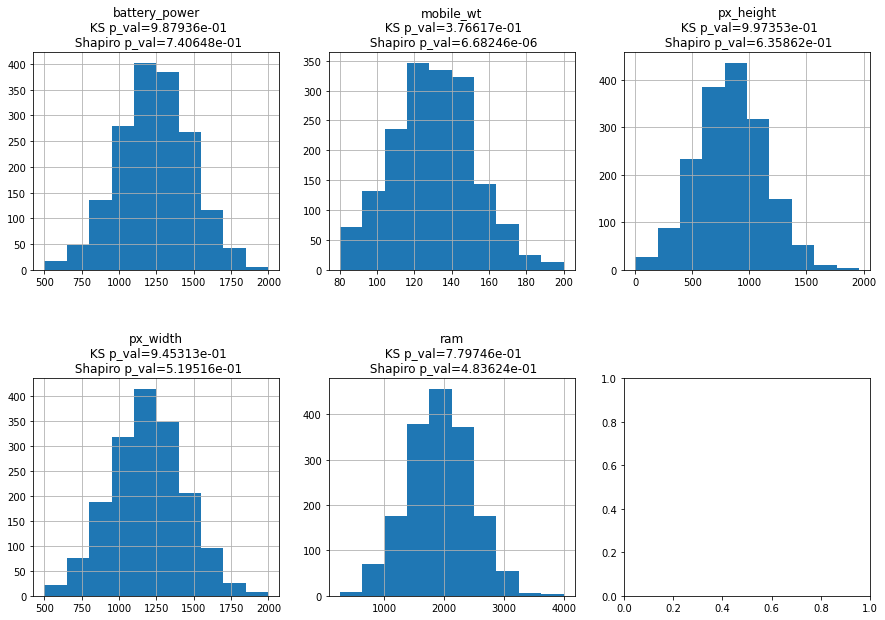

In [274]:
matched_mobile_train_df_X_numerical, train_df_X_normal_mapping = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution,\
                                                                                   correction=correction_func)

matched_mobile_train_df_X_numerical_not, train_df_X_normal_mapping_not = transform_dataset(mobile_train_df_X_numerical,\
                                                                                   match_to_normal_distribution)

plot_numerical_histograms(matched_mobile_train_df_X_numerical, mobile_numeric_columns)

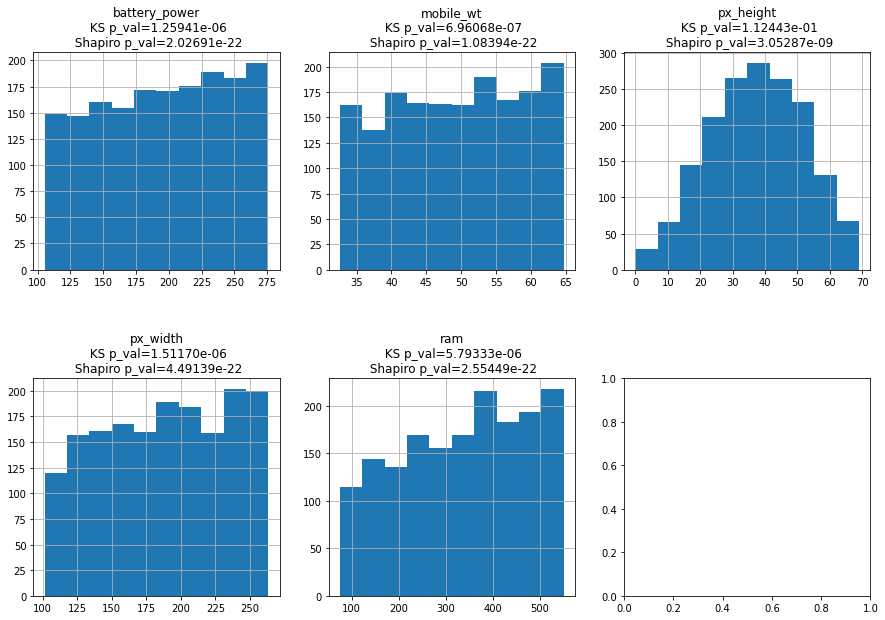

In [275]:
yeo_mobile_train_df_X_numerical, train_df_X_yeo_mapping = transform_dataset(mobile_train_df_X_numerical, stats.yeojohnson)
plot_numerical_histograms(yeo_mobile_train_df_X_numerical, mobile_numeric_columns)

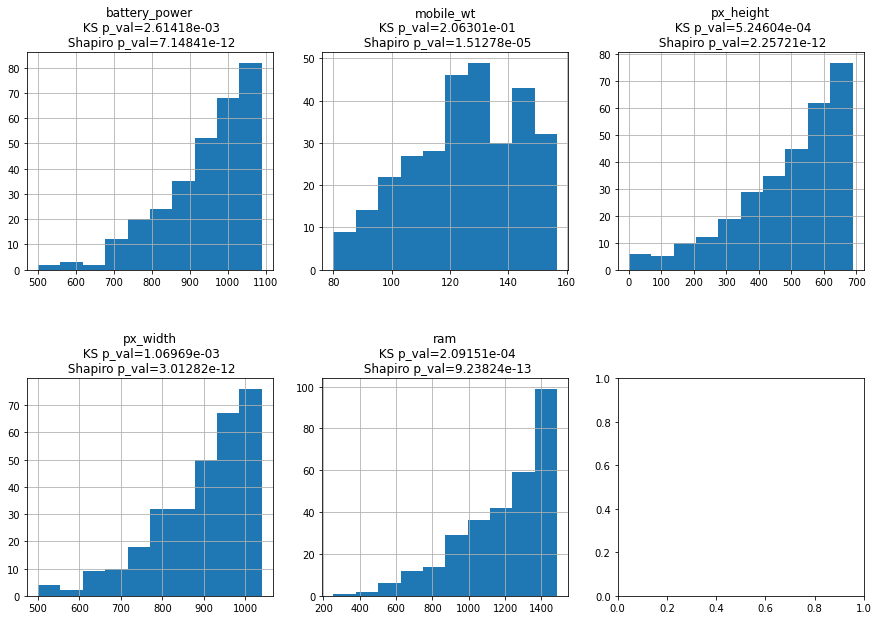

In [276]:
matched_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, match_to_normal_distribution, train_df_X_normal_mapping)
plot_numerical_histograms(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

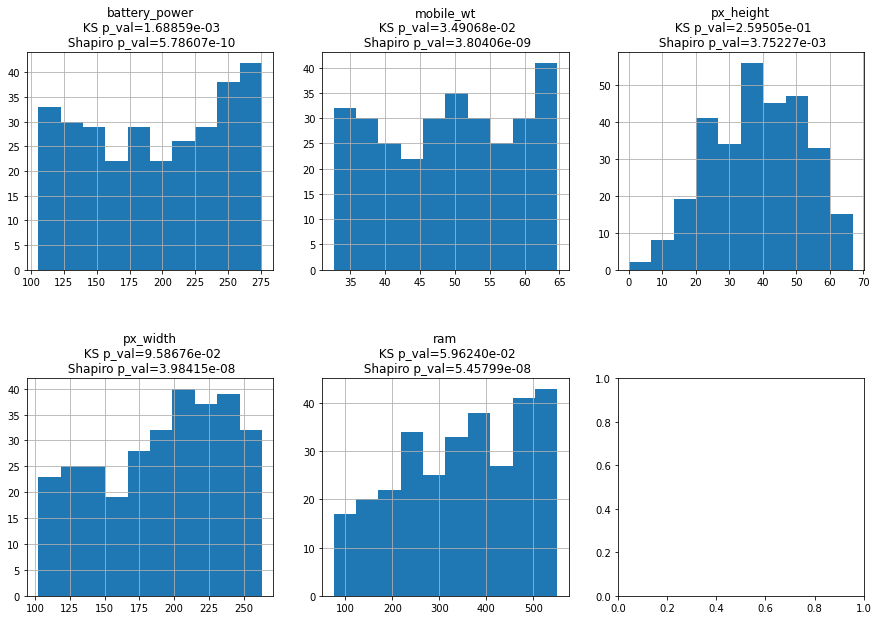

In [277]:
yeo_mobile_val_df_X_numerical, _ = transform_dataset(mobile_val_df_X_numerical, stats.yeojohnson, train_df_X_yeo_mapping)
plot_numerical_histograms(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## QQ plots of features

### QQ plots for regular features

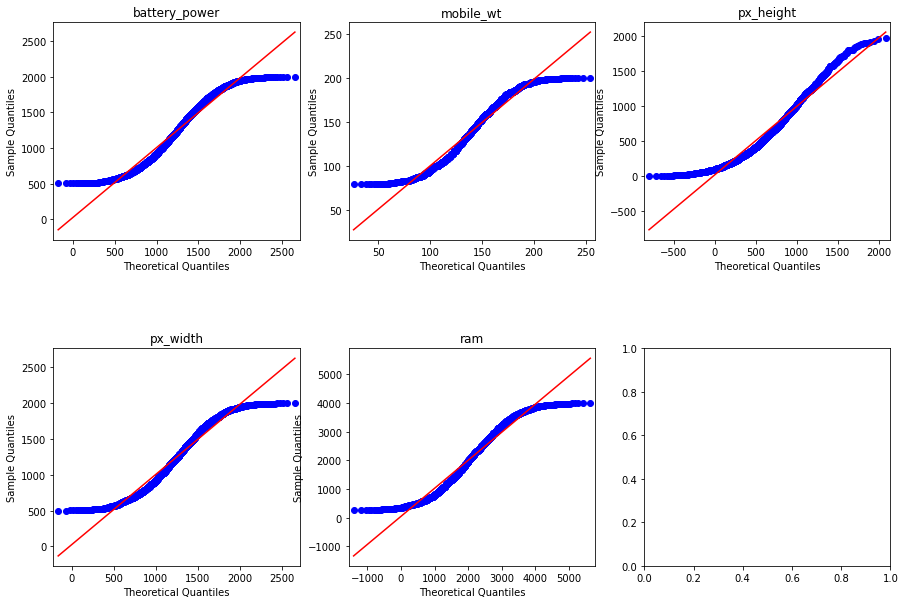

In [278]:
qq_plot_data(mobile_train_df_X, mobile_numeric_columns)

### QQ plots for Matched features

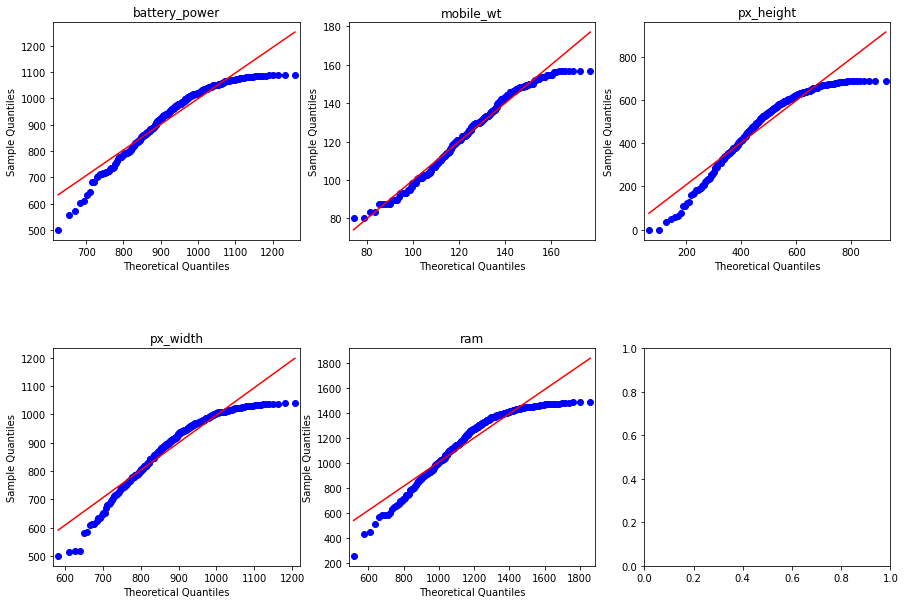

In [279]:
qq_plot_data(matched_mobile_val_df_X_numerical, mobile_numeric_columns)

### QQ plots for Yeo-Johnson features

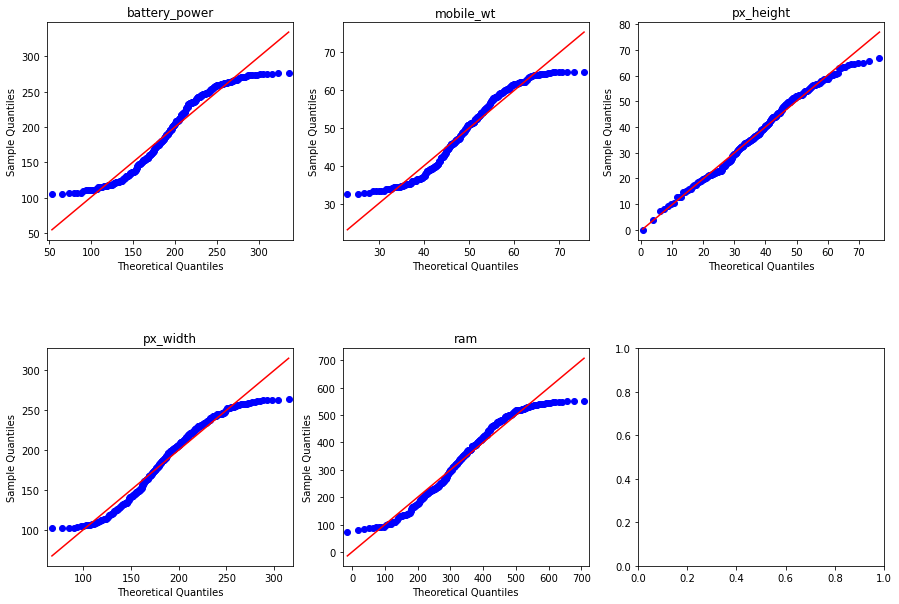

In [280]:
qq_plot_data(yeo_mobile_val_df_X_numerical, mobile_numeric_columns)

## Compare model preformance

### Reassemble Dataset

In [281]:
matched_mobile_train_df_X = pd.concat([matched_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

matched_mobile_val_df_X = pd.concat([matched_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

yeo_mobile_train_df_X = pd.concat([yeo_mobile_train_df_X_numerical, mobile_train_df_X_categorical], axis=1)

yeo_mobile_val_df_X = pd.concat([yeo_mobile_val_df_X_numerical, mobile_val_df_X_categorical], axis=1)

### Test on regular data

In [282]:
model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
prediction = model.fit(mobile_train_df_X,mobile_train_df_y).predict(mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, prediction))))

acc=0.63
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 285,227,976,400,131.625
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


### Test on matched data

In [283]:
matched_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
matched_prediction = matched_model.fit(matched_mobile_train_df_X,mobile_train_df_y).predict(matched_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,matched_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,matched_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, matched_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, matched_prediction))))

acc=0.23666666666666666
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 0.692
Mean Absolute Error (Σ|y - pred|/n): 1
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 2


### Test on Yeo-Johnson data

In [284]:
yeo_model = LogisticRegression(multi_class='multinomial', solver='lbfgs')
yeo_prediction = yeo_model.fit(yeo_mobile_train_df_X,mobile_train_df_y).predict(yeo_mobile_val_df_X)
print(f'acc={accuracy_score(mobile_val_df_y,yeo_prediction)}')
print("Mean Absolute Perc Error (Σ(|y - pred|/y)/n):","{:,.3f}".format(mean_absolute_percentage_error(mobile_val_df_y,yeo_prediction)))
print("Mean Absolute Error (Σ|y - pred|/n):", "{:,.0f}".format(mean_absolute_error(mobile_val_df_y, yeo_prediction)))
print("Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)):", "{:,.0f}".format(np.sqrt(mean_squared_error(mobile_val_df_y, yeo_prediction))))

acc=0.6533333333333333
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 255,203,978,884,328.281
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1


## Try to normalize only 1 column at a time and Compare to regular model

In [285]:
compare_one_norm_column(mobile_train_df_X, mobile_val_df_X, mobile_train_df_y, mobile_val_df_y,\
                        matched_mobile_train_df_X, matched_mobile_val_df_X, yeo_mobile_train_df_X,\
                        yeo_mobile_val_df_X, 'price_range', mobile_numeric_columns, acc=True)

=== Measure for regular model: ===
column=price_range, acc=0.63
Mean Absolute Perc Error (Σ(|y - pred|/y)/n): 285,227,976,400,131.625
Mean Absolute Error (Σ|y - pred|/n): 0
Root Mean Squared Error (sqrt(Σ(y - pred)^2/n)): 1

=== Compare for column battery_power ===
column=battery_power, matched acc=0.6433333333333333
column=battery_power, yeo acc=0.64

=== Compare for column mobile_wt ===
column=mobile_wt, matched acc=0.7333333333333333
column=mobile_wt, yeo acc=0.6766666666666666

=== Compare for column px_height ===
column=px_height, matched acc=0.6066666666666667
column=px_height, yeo acc=0.6

=== Compare for column px_width ===
column=px_width, matched acc=0.66
column=px_width, yeo acc=0.64

=== Compare for column ram ===
column=ram, matched acc=0.27
column=ram, yeo acc=0.5866666666666667



## Get insights about the data

In [286]:
mobile_insights = get_insights(mobile_train_df_X[mobile_numeric_columns])
mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501,1998,1239.017059,1230.0,435.684925,1.898214e+05,0.032633,-1.201602,6.817273
mobile_wt,80,200,140.303529,141.0,35.230389,1.241180e+03,0.006681,-1.203624,4.756571
px_height,0,1960,640.792353,563.5,444.879195,1.979175e+05,0.686942,-0.266339,6.820857
px_width,500,1998,1246.613529,1238.0,433.027211,1.875126e+05,0.041316,-1.191648,6.802794
ram,256,3998,2111.912941,2124.5,1084.605549,1.176369e+06,0.013673,-1.193893,7.153090


In [287]:
matched_mobile_insights = get_insights(matched_mobile_train_df_X[mobile_numeric_columns])
matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,501.0,1998.0,1237.122066,1240.020267,240.635604,57905.493750,-0.045228,-0.106797,6.817273
mobile_wt,80.0,200.0,130.417197,130.312395,22.101798,488.489476,0.187979,0.022277,4.756571
px_height,0.0,1960.0,836.071708,832.017590,296.369725,87835.013851,0.068021,-0.001866,6.820857
px_width,500.0,1998.0,1188.637268,1183.329973,244.541075,59800.337318,0.058740,-0.120736,6.802794
ram,256.0,3998.0,1927.512106,1926.711548,537.751542,289176.720794,0.019177,-0.100397,7.153090


In [288]:
matched_not_mobile_insights = get_insights(matched_mobile_train_df_X_numerical_not[mobile_numeric_columns])
matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,-193.674077,2461.862447,1226.788292,1231.953756,437.060456,1.910218e+05,-0.017268,-0.193855,6.817273
mobile_wt,60.212515,247.160068,141.599343,141.778120,35.466861,1.257898e+03,0.158491,-0.099659,4.756571
px_height,-914.480446,2177.769376,660.666428,671.087543,451.685068,2.040194e+05,-0.013618,0.001483,6.820857
px_width,-109.507763,3028.411331,1248.094100,1248.201219,434.041239,1.883918e+05,0.066028,-0.105668,6.802794
ram,-1910.485763,6201.601744,2121.850289,2142.434219,1080.997944,1.168557e+06,0.012283,0.267927,7.153090


In [289]:
yeo_mobile_insights = get_insights(yeo_mobile_train_df_X[mobile_numeric_columns])
yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,105.226568,275.960595,195.157652,196.929048,49.228040,2423.399921,-0.107040,-1.173765,6.817273
mobile_wt,32.623606,64.695068,49.369521,49.873838,9.371885,87.832224,-0.076576,-1.189032,4.756571
px_height,0.000000,69.037001,37.434457,37.968684,14.545692,211.577163,-0.113614,-0.650982,6.820857
px_width,101.286513,263.316918,187.695919,189.423985,46.253850,2139.418642,-0.102450,-1.158329,6.802794
ram,74.776162,551.411768,336.646073,348.833007,134.336420,18046.273778,-0.197954,-1.107979,7.153090


In [290]:
mobile_insights - matched_not_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,694.674077,-463.862447,12.228767,-1.953756,-1.375531,-1200.488434,0.049901,-1.007747,0.0
mobile_wt,19.787485,-47.160068,-1.295814,-0.778120,-0.236472,-16.717921,-0.151809,-1.103964,0.0
px_height,914.480446,-217.769376,-19.874075,-107.587543,-6.805873,-6101.902375,0.700560,-0.267821,0.0
px_width,609.507763,-1030.411331,-1.480571,-10.201219,-1.014028,-879.231297,-0.024712,-1.085980,0.0
ram,2166.485763,-2203.601744,-9.937348,-17.934219,3.607604,7812.640789,0.001390,-1.461820,0.0


In [291]:
mobile_insights - matched_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,0.0,0.0,1.894993,-10.020267,195.049322,131915.860285,0.077861,-1.094804,0.0
mobile_wt,0.0,0.0,9.886332,10.687605,13.128591,752.690853,-0.181298,-1.225900,0.0
px_height,0.0,0.0,-195.279355,-268.517590,148.509470,110082.484502,0.618921,-0.264473,0.0
px_width,0.0,0.0,57.976261,54.670027,188.486136,127712.228361,-0.017424,-1.070912,0.0
ram,0.0,0.0,184.400835,197.788452,546.854007,887192.475860,-0.005504,-1.093497,0.0


In [292]:
mobile_insights - yeo_mobile_insights

,min,max,mean,median,std,var,skew,kurtosis,entropy
battery_power,395.773432,1722.039405,1043.859407,1033.070952,386.456885,1.873980e+05,0.139673,-0.027837,0.0
mobile_wt,47.376394,135.304932,90.934009,91.126162,25.858504,1.153348e+03,0.083257,-0.014592,0.0
px_height,0.000000,1890.962999,603.357896,525.531316,430.333503,1.977059e+05,0.800556,0.384643,0.0
px_width,398.713487,1734.683082,1058.917611,1048.576015,386.773361,1.853731e+05,0.143766,-0.033319,0.0
ram,181.223838,3446.588232,1775.266868,1775.666993,950.269129,1.158323e+06,0.211627,-0.085914,0.0


## Plot distributions

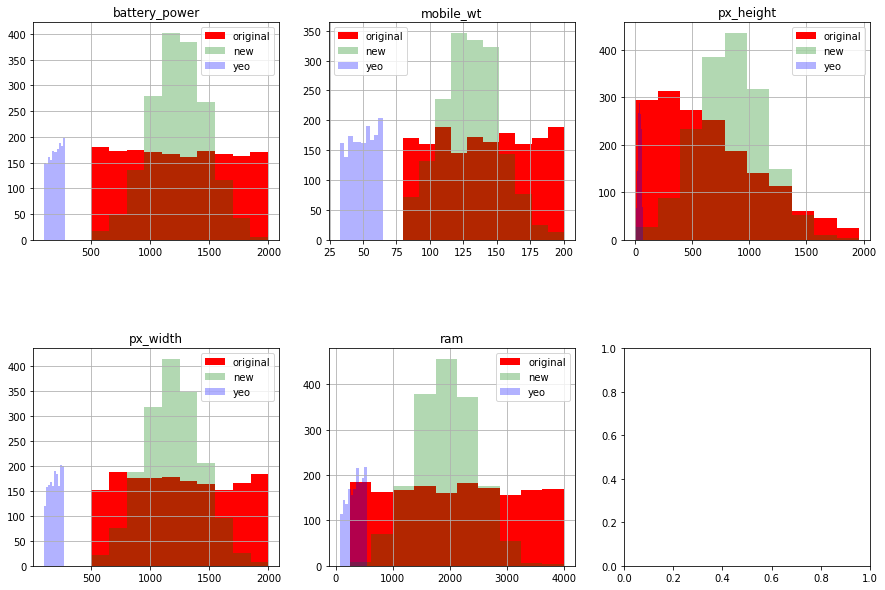

In [293]:
plot_histograms(mobile_train_df_X[mobile_numeric_columns], 
                matched_mobile_train_df_X[mobile_numeric_columns], 
                yeo_mobile_train_df_X[mobile_numeric_columns])

## Plot a Heatmap of all columns to targets

In [294]:
matched_mobile_df_corr = pd.concat([matched_mobile_train_df_X, mobile_train_df_y], axis=1)
yeo_mobile_df_corr = pd.concat([yeo_mobile_train_df_X, mobile_train_df_y], axis=1)

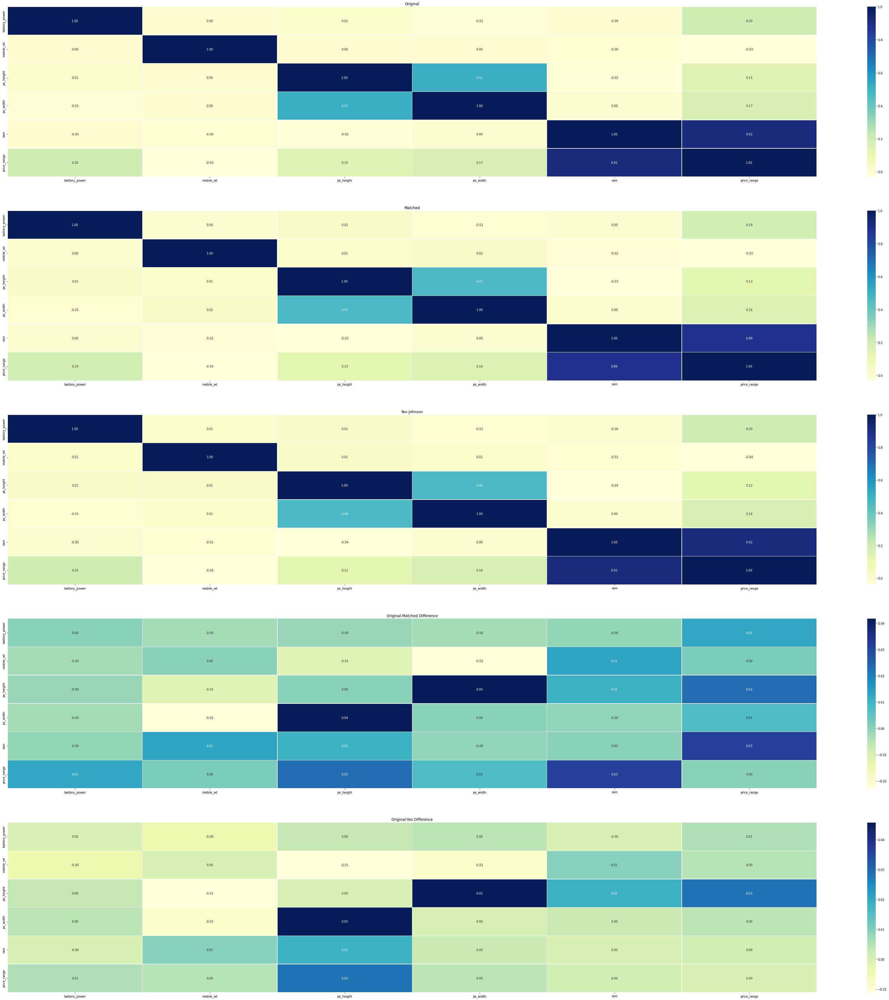

In [295]:
plot_correlation_heatmaps(mobile_df, matched_mobile_df_corr, yeo_mobile_df_corr, mobile_numeric_columns + ['price_range'])

In [296]:
for column in mobile_train_df_y.to_frame().columns:
    print(f'{"=" * 15} Compare sum of corr for target column: {column} {"=" * 15}')
    print('matched corr sum:', matched_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())
    print('yeo corr sum:', yeo_mobile_df_corr.corr(method='pearson').loc[column].abs().sum())

=============== Compare sum of corr for target column: price_range ===============
matched corr sum: 2.713327473016534
yeo corr sum: 2.7509765200115783


In [297]:
mobile_diff_corr_df = pd.concat([
           matched_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('matched').to_frame(),
           yeo_mobile_df_corr.corr(method='pearson').abs().sum(axis=1).rename('yeo').to_frame()
], axis=1)

def highlight_max(s, props=''):
    return np.where(s == np.nanmax(s.values), props, '')

mobile_diff_corr_df.style.apply(highlight_max, props='color:white;background-color:darkblue', axis=1)

,matched,yeo
battery_power,1.559790,1.595730
mobile_wt,1.341964,1.312717
px_height,2.055453,2.034487
px_width,1.891794,1.899636
ram,2.232399,2.264029
blue,1.416868,1.404796
clock_speed,1.359326,1.360873
dual_sim,1.379867,1.374381
fc,1.916279,1.934443
four_g,1.958100,1.959469


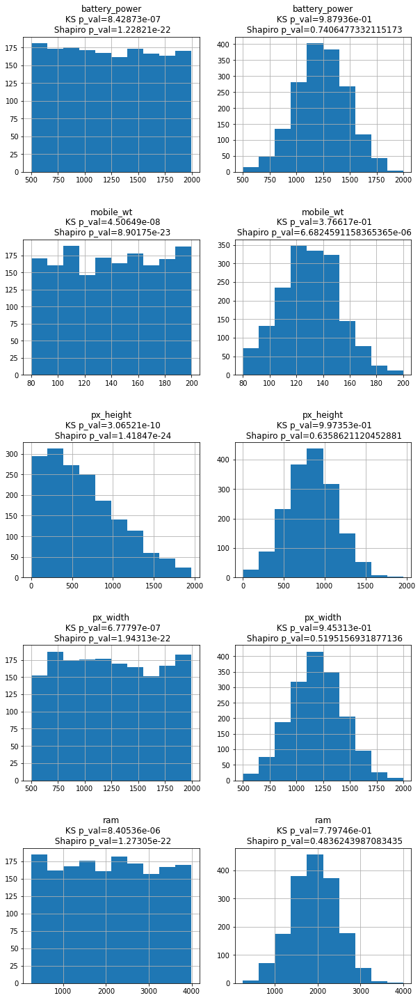

In [298]:
plot_histograms_side_by_side(mobile_train_df_X[mobile_numeric_columns], matched_mobile_train_df_X[mobile_numeric_columns])